# 0. Libs & Creds

In [12]:
import os
import json
import pickle
import glob
import gc

import calendar
from datetime import date, timedelta, datetime
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm.auto import tqdm

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

from pyspark import SparkContext, SparkConf
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from pyspark.sql.types import *
# from pyspark.sql.functions import *
# from pyspark.sql.functions import udf, struct, count_distinct, from_unixtime

!pip install openpyxl -q
import openpyxl

In [3]:
SEED = 42
s3a = 's3a://pvc-75e6242d-1f96-4903-a9eb-22fa28f5b73e'

In [4]:
home_repo = '/home/jovyan'
project_repo = f'{home_repo}/__RAYDTT'

%cd {project_repo}
%pwd

/home/jovyan/__RAYDTT


'/home/jovyan/__RAYDTT'

In [4]:
def access_data(file_path):
    with open(file_path) as file:
        access_data = json.load(file)
    return access_data

access_s3_data = access_data('.access_s3.json')

print('user:', os.environ['JUPYTERHUB_SERVICE_PREFIX'])

def uiWebUrl(self):
    from urllib.parse import urlparse
    web_url = self._jsc.sc().uiWebUrl().get()
    port = urlparse(web_url).port
    return '{}proxy/{}/jobs/'.format(os.environ['JUPYTERHUB_SERVICE_PREFIX'], port)

SparkContext.uiWebUrl = property(uiWebUrl)

conf = SparkConf()
conf.set('spark.master', 'local[*]')
conf.set('spark.driver.memory', '40G')
conf.set('spark.driver.maxResultSize', '32G')
############################################
conf.set('spark.driver.memoryOverhead', '2G')
conf.set('spark.executor.memory', '36G') #32G
conf.set('spark.executor.memoryOverhead', '2G')
conf.set('spark.executor.cores', '10') # 8
conf.set('spark.executor.instances', '2')
conf.set('spark.dynamicAllocation.enabled', 'true')
conf.set('spark.dynamicAllocation.minExecutors', '1')
conf.set('spark.dynamicAllocation.maxExecutors', '50')
############################################
sc = SparkContext(conf=conf)
spark = SparkSession(sc)
spark._jsc.hadoopConfiguration().set('fs.s3a.access.key', access_s3_data['aws_access_key_id'])
spark._jsc.hadoopConfiguration().set('fs.s3a.secret.key', access_s3_data['aws_secret_access_key'])
spark._jsc.hadoopConfiguration().set('fs.s3a.impl','org.apache.hadoop.fs.s3a.S3AFileSystem')
spark._jsc.hadoopConfiguration().set('fs.s3a.multipart.size', '104857600')
spark._jsc.hadoopConfiguration().set('fs.s3a.block.size', '33554432')
spark._jsc.hadoopConfiguration().set('fs.s3a.threads.max', '256')
spark._jsc.hadoopConfiguration().set('fs.s3a.endpoint', 'http://storage.yandexcloud.net')
spark._jsc.hadoopConfiguration().set('fs.s3a.aws.credentials.provider', 
                                     'org.apache.hadoop.fs.s3a.SimpleAWSCredentialsProvider')
spark

# conf.set('spark.driver.memory', '32G')
# conf.set('spark.driver.maxResultSize', '4G')

user: /user/st054552/


In [6]:
parquets = glob.glob(f'ray_data/*.parquet')
# parquets.remove('vgtest/data.parquet')
len(parquets)

25

# sdf_init & target

In [ ]:
columns = ['amplitude_id', 'event_time', 'purchase_type', 'subscription_date_start', 'paid']
# '[server]_purchase'
# '[server]_subscription_start_date'
sdf = None

for parquet in parquets:
    
    sdf_temp = spark.read.parquet(parquet).select(columns)
    
    sdf_temp = (
                sdf_temp
                #
                # .selectExpr('*', 'SUBSTRING(`[server]_purchase`[0], 16) AS purchase') \
                # .drop(F.col('`[server]_purchase`')) \
                #
                # .selectExpr('*', 'SUBSTRING(`[server]_subscription_start_date`[0], -10) AS subscription_start_date') \
                # .withColumn('subscription_start_date', F.col('subscription_start_date').cast('date')) \
                # .drop(F.col('`[server]_subscription_start_date`')) \
                #
                .withColumn('event_time_timestamp', F.to_timestamp('event_time'))
                .withColumn('event_time', F.to_date('event_time')) \
                .withColumn('paid', F.col('paid').cast('string')) \
                .withColumn('subscription_date_start_timestamp', F.to_timestamp('subscription_date_start')) \
                .withColumn('subscription_date_start', F.to_date('subscription_date_start'))
               )
                        
    if sdf is None:
        sdf = sdf_temp
    else:
        sdf = sdf.unionByName(sdf_temp, allowMissingColumns=True)

In [ ]:
sdf.printSchema()

In [8]:
sdf.select('*').show(truncate=200)

+------------+----------+-------------+-----------------------+-----+-----------------------+---------------------------------+
|amplitude_id|event_time|purchase_type|subscription_date_start| paid|   event_time_timestamp|subscription_date_start_timestamp|
+------------+----------+-------------+-----------------------+-----+-----------------------+---------------------------------+
|288086553546|2022-04-03|         null|                   null|false|2022-04-03 15:48:08.399|                             null|
|288086553546|2022-04-06|         null|                   null|false|2022-04-06 20:33:04.817|                             null|
|288086553546|2022-04-06|         null|                   null|false|2022-04-06 20:33:04.896|                             null|
|288086553546|2022-04-06|         null|                   null|false|2022-04-06 20:33:08.581|                             null|
|288086553546|2022-04-06|         null|                   null|false|2022-04-06 20:33:09.657|           

In [8]:
%%time
target = (
            sdf
            .filter(
                (F.col('subscription_date_start').isNotNull()) & 
                ((F.col('paid') == 'yes') | (F.col('paid') == 'true'))
                    )
            .groupBy('amplitude_id')
            .agg(
                F.min('subscription_date_start').alias('target_date'),
                F.min('subscription_date_start_timestamp').alias('target_date_timestamp'),
                F.trunc(F.min('subscription_date_start'), 'month').alias('target_month')
                )
        )

CPU times: user 5.64 ms, sys: 0 ns, total: 5.64 ms
Wall time: 168 ms


In [9]:
target.printSchema()

root
 |-- amplitude_id: long (nullable = true)
 |-- target_date: date (nullable = true)
 |-- target_date_timestamp: timestamp (nullable = true)
 |-- target_month: date (nullable = true)



In [11]:
%%time
file_path = f'{s3a}/bs_segments_new/sdf_init.parquet'

sdf.write.parquet(path = file_path, mode = 'overwrite')

CPU times: user 210 ms, sys: 125 ms, total: 335 ms
Wall time: 33min 14s


In [10]:
%%time
file_path = f'{s3a}/bs_segments_new/target.parquet'

target.write.parquet(path = file_path, mode = 'overwrite')

CPU times: user 102 ms, sys: 58.1 ms, total: 160 ms
Wall time: 15min 22s


# expanded_target

In [11]:
sdf = spark.read.parquet('bs_segments_new/sdf_init.parquet')
sdf.rdd.getNumPartitions()

31

In [13]:
sdf.printSchema()

root
 |-- amplitude_id: long (nullable = true)
 |-- event_time: date (nullable = true)
 |-- purchase_type: string (nullable = true)
 |-- subscription_date_start: date (nullable = true)
 |-- paid: string (nullable = true)



In [12]:
sdf.show(3)

+------------+----------+-------------+-----------------------+-----+--------------------+---------------------------------+
|amplitude_id|event_time|purchase_type|subscription_date_start| paid|event_time_timestamp|subscription_date_start_timestamp|
+------------+----------+-------------+-----------------------+-----+--------------------+---------------------------------+
|345510280979|2024-02-26|         null|                   null|false|2024-02-26 13:58:...|                             null|
|345510280979|2024-02-26|         null|                   null|false|2024-02-26 20:30:...|                             null|
|345510280979|2024-02-26|         null|                   null|false|2024-02-26 20:33:...|                             null|
+------------+----------+-------------+-----------------------+-----+--------------------+---------------------------------+
only showing top 3 rows



In [13]:
%%time
lifetime_target = (
                    sdf
                    .filter(
                        (F.col('purchase_type') == 'lifetime') & 
                        ((F.col('paid') == 'yes') | (F.col('paid') == 'true'))
                            )
                    .groupBy('amplitude_id')
                    .agg(
                        F.min('event_time').alias('target_date'),
                        F.min('event_time_timestamp').alias('target_date_timestamp'),
                        F.trunc(F.min('event_time'), 'month').alias('target_month')
                        )
                )

CPU times: user 4.17 ms, sys: 361 µs, total: 4.53 ms
Wall time: 64.7 ms


In [14]:
lifetime_target.describe().show()

+-------+--------------------+
|summary|        amplitude_id|
+-------+--------------------+
|  count|               22681|
|   mean|5.988664366958818E11|
| stddev|9.826635110652502E10|
|    min|        269010978069|
|    max|        886834198500|
+-------+--------------------+



In [15]:
lifetime_target.select('amplitude_id').distinct().describe().show()

+-------+--------------------+
|summary|        amplitude_id|
+-------+--------------------+
|  count|               22681|
|   mean|5.988664366958818E11|
| stddev|9.826635110652502E10|
|    min|        269010978069|
|    max|        886834198500|
+-------+--------------------+



In [16]:
narrow_target = spark.read.parquet('bs_segments_new/target.parquet')

**С переходом к subscription_date_start число строк в таргете увеличилось!**

In [17]:
narrow_target.describe().show()

+-------+--------------------+
|summary|        amplitude_id|
+-------+--------------------+
|  count|               27633|
|   mean|6.087741389992196E11|
| stddev|8.897158318938043E10|
|    min|        274721362135|
|    max|        856631834043|
+-------+--------------------+



In [18]:
narrow_target.select('amplitude_id').distinct().describe().show()

+-------+--------------------+
|summary|        amplitude_id|
+-------+--------------------+
|  count|               27633|
|   mean|6.087741389992235E11|
| stddev|8.897158318938045E10|
|    min|        274721362135|
|    max|        856631834043|
+-------+--------------------+



In [19]:
inter_target = narrow_target.join(
                    lifetime_target,
                    (lifetime_target.amplitude_id == narrow_target.amplitude_id),
                    'inner')

In [20]:
inter_target.describe().show()

+-------+--------------------+--------------------+
|summary|        amplitude_id|        amplitude_id|
+-------+--------------------+--------------------+
|  count|                 260|                 260|
|   mean|5.732256762733846E11|5.732256762733846E11|
| stddev|9.000224983856589E10|9.000224983856589E10|
|    min|        274721362135|        274721362135|
|    max|        719826605455|        719826605455|
+-------+--------------------+--------------------+



In [21]:
amplitude_ids_in_narrow = narrow_target.select('amplitude_id').distinct()

lifetime_target_not_in_narrow = lifetime_target.join(amplitude_ids_in_narrow, 'amplitude_id', 'left_anti')

expanded_target = lifetime_target_not_in_narrow.union(narrow_target)

In [22]:
expanded_target.describe().show()

+-------+--------------------+
|summary|        amplitude_id|
+-------+--------------------+
|  count|               50054|
|   mean|6.044693083037051E11|
| stddev|9.339674780599048E10|
|    min|        269010978069|
|    max|        886834198500|
+-------+--------------------+



In [23]:
expanded_target.select('amplitude_id').distinct().describe().show()

+-------+--------------------+
|summary|        amplitude_id|
+-------+--------------------+
|  count|               50054|
|   mean|6.044693083037042E11|
| stddev|9.339674780599115E10|
|    min|        269010978069|
|    max|        886834198500|
+-------+--------------------+



<span style="color:red">**Обратить внимание: число записей выросло по сравнению с предыдущим**</span>

In [24]:
# checking

22681+27633-260==50054

True

In [50]:
# checking (сколько было раньше)
lifetime_target.count() + narrow_target.count() - inter_target.count()

45536

In [25]:
expanded_target.limit(3).show()

+------------+-----------+---------------------+------------+
|amplitude_id|target_date|target_date_timestamp|target_month|
+------------+-----------+---------------------+------------+
|624616991064| 2023-08-30| 2023-08-30 21:48:...|  2023-08-01|
|610438127402| 2023-04-02| 2023-04-02 19:01:...|  2023-04-01|
|674948454508| 2023-07-06| 2023-07-06 19:41:...|  2023-07-01|
+------------+-----------+---------------------+------------+



In [26]:
%%time
file_path = f'{s3a}/bs_segments_new/expanded_target.parquet'

expanded_target.write.parquet(path = file_path, mode = 'overwrite')

CPU times: user 8.62 ms, sys: 2.94 ms, total: 11.6 ms
Wall time: 59.5 s


In [27]:
expanded_target = spark.read.parquet('bs_segments_new/expanded_target.parquet')
expanded_target.rdd.getNumPartitions()

16

In [28]:
expanded_target.describe().show()

+-------+--------------------+
|summary|        amplitude_id|
+-------+--------------------+
|  count|               50054|
|   mean|6.044693083037064E11|
| stddev|9.339674780599043E10|
|    min|        269010978069|
|    max|        886834198500|
+-------+--------------------+



# bs_for_month: search

In [6]:
sdf = spark.read.parquet('bs_segments_new/sdf_init.parquet')
sdf.rdd.getNumPartitions()

30

In [7]:
target = spark.read.parquet('bs_segments_new/expanded_target.parquet')
target.rdd.getNumPartitions()

16

In [8]:
target.limit(5).show()

+------------+-----------+---------------------+------------+
|amplitude_id|target_date|target_date_timestamp|target_month|
+------------+-----------+---------------------+------------+
|597528128086| 2023-03-17|  2023-03-17 15:59:44|  2023-03-01|
|673685480647| 2023-07-04|  2023-07-04 18:29:03|  2023-07-01|
|692183357458| 2023-08-01|  2023-08-01 20:16:43|  2023-08-01|
|607828391549| 2023-03-30|                 null|  2023-03-01|
|592403241171| 2023-03-11|  2023-03-11 07:32:24|  2023-03-01|
+------------+-----------+---------------------+------------+



In [9]:
years = [2022, 2023, 2024]

month_date_ranges = []
res_ranges=[]

for year in years:

    if year==2022:
        m = [*range(4, 12)]
        m_res = [calendar.month_abbr[i+1].lower()+f"_{year}" for i in m] + ['jan_2023']
        m+=[12]
        y = [year]*len(m)
    elif year==2023:
        m = [*range(1, 12)]
        m_res = [calendar.month_abbr[i+1].lower()+f"_{year}" for i in m] + ['jan_2024']
        m+=[12]
        y = [year]*len(m)
    elif year==2024:
        m = [*range(1, 4)]
        m_res = [calendar.month_abbr[i+1].lower()+f"_{year}" for i in m]
    for mnth, yr in zip(m, y): 
        last_day = calendar.monthrange(yr, mnth)[1]
        first_date_str = f'{yr}-{mnth:02d}-01'
        last_date_str = f'{yr}-{mnth:02d}-{last_day}'
        month_date_ranges.append((first_date_str, last_date_str))
        
    bs_names = [f'bs_for_{x}' for x in m_res]
    res_ranges += [(s, a, b) for ((a, b), s) in zip(month_date_ranges, bs_names)]
    month_date_ranges=[]
    
res_ranges

bs_for_months = [i[0] for i in month_date_ranges]

[('bs_for_may_2022', '2022-04-01', '2022-04-30'),
 ('bs_for_jun_2022', '2022-05-01', '2022-05-31'),
 ('bs_for_jul_2022', '2022-06-01', '2022-06-30'),
 ('bs_for_aug_2022', '2022-07-01', '2022-07-31'),
 ('bs_for_sep_2022', '2022-08-01', '2022-08-31'),
 ('bs_for_oct_2022', '2022-09-01', '2022-09-30'),
 ('bs_for_nov_2022', '2022-10-01', '2022-10-31'),
 ('bs_for_dec_2022', '2022-11-01', '2022-11-30'),
 ('bs_for_jan_2023', '2022-12-01', '2022-12-31'),
 ('bs_for_feb_2023', '2023-01-01', '2023-01-31'),
 ('bs_for_mar_2023', '2023-02-01', '2023-02-28'),
 ('bs_for_apr_2023', '2023-03-01', '2023-03-31'),
 ('bs_for_may_2023', '2023-04-01', '2023-04-30'),
 ('bs_for_jun_2023', '2023-05-01', '2023-05-31'),
 ('bs_for_jul_2023', '2023-06-01', '2023-06-30'),
 ('bs_for_aug_2023', '2023-07-01', '2023-07-31'),
 ('bs_for_sep_2023', '2023-08-01', '2023-08-31'),
 ('bs_for_oct_2023', '2023-09-01', '2023-09-30'),
 ('bs_for_nov_2023', '2023-10-01', '2023-10-31'),
 ('bs_for_dec_2023', '2023-11-01', '2023-11-30'),


In [6]:
# sdf = spark.read.parquet('bs_segments/sdf_init.parquet')
# target = spark.read.parquet('bs_segments/target.parquet')

# sdf.rdd.getNumPartitions(), target.rdd.getNumPartitions()

(16, 8)

In [10]:
bs_name, start_date, end_date = res_ranges[0]

ids_wo_subs = (
                sdf
                .filter(
                        (F.col('event_time') >= F.lit(start_date)) &
                        (F.col('event_time') <= F.lit(end_date)) &
                         F.col('subscription_date_start').isNull()
                        )
                .withColumn('target_month', F.date_add(F.lit(end_date), 1))
               )

excluded_ids = target.filter(\
    (F.col('target_date') <= F.lit(end_date))
                            ).select('amplitude_id').distinct()

bs = ids_wo_subs.join(
            excluded_ids,
            ids_wo_subs['amplitude_id'] == excluded_ids['amplitude_id'],
            'left_anti'
                     ).select('amplitude_id', 'target_month').distinct().withColumnRenamed('amplitude_id', 'amplitude_id_bs')

In [12]:
print(bs_name)
bs.describe().show()

bs_for_may_2022
+-------+--------------------+
|summary|     amplitude_id_bs|
+-------+--------------------+
|  count|                6142|
|   mean|3.515543116233097E11|
| stddev|2.677412794505278...|
|    min|        274703854252|
|    max|        415870186778|
+-------+--------------------+



In [13]:
# к базовому сегменту тянем дату подписки из таргета, но только для сконвертировавшихся в текущем месяце!
bs_with_target_date = bs.join(
    target.filter(target.target_month==(pd.to_datetime(end_date)+pd.DateOffset(days=1)).strftime("%Y-%m-%d")),
    bs.amplitude_id_bs==target.amplitude_id,
    'inner'
).select('amplitude_id_bs', 'target_date', 'target_date_timestamp')

In [14]:
bs_with_target_date.limit(5).show()

+---------------+-----------+---------------------+
|amplitude_id_bs|target_date|target_date_timestamp|
+---------------+-----------+---------------------+
|   337541728352| 2022-05-19| 2022-05-19 10:23:...|
|   399632770971| 2022-05-10| 2022-05-10 18:11:...|
|   333568056384| 2022-05-20|  2022-05-20 12:12:54|
|   342411969942| 2022-05-31|  2022-05-31 08:18:40|
|   390833585404| 2022-05-08|  2022-05-08 09:54:00|
+---------------+-----------+---------------------+



In [15]:
bs_with_target_date.describe().show()

+-------+--------------------+
|summary|     amplitude_id_bs|
+-------+--------------------+
|  count|                  60|
|   mean|  3.5226998548845E11|
| stddev|2.947843499124543...|
|    min|        294019726085|
|    max|        403539565860|
+-------+--------------------+



In [17]:
bs_with_target_date.select('amplitude_id_bs').distinct().describe().show()

+-------+--------------------+
|summary|     amplitude_id_bs|
+-------+--------------------+
|  count|                  60|
|   mean|  3.5226998548845E11|
| stddev|2.947843499124543...|
|    min|        294019726085|
|    max|        403539565860|
+-------+--------------------+



In [18]:
# по каждому пользователю в текущем месяце достаем минимальное время лога
ids_wo_subs_temp = ids_wo_subs.groupBy('amplitude_id')\
    .agg(F.min('event_time_timestamp')).withColumnRenamed('min(event_time_timestamp)', 'min_event_time')

In [19]:
# для всех ID с логами в апреле и купленной подпиской в мае можем посчитать длину их пути до конверсии
# для target_date_timestamp==Nan => target_date, т.к. это ID c lifetime, по которым нет фактической target_date_timestamp
bs4w_temp = bs_with_target_date.join(
    ids_wo_subs_temp,
    ids_wo_subs['amplitude_id'] == bs['amplitude_id_bs'],
    'left'
).select('amplitude_id', 'min_event_time', 'target_date', 'target_date_timestamp')

In [20]:
bs4w_temp.limit(5).show()

+------------+--------------------+-----------+---------------------+
|amplitude_id|      min_event_time|target_date|target_date_timestamp|
+------------+--------------------+-----------+---------------------+
|337541728352|2022-04-07 23:31:...| 2022-05-19| 2022-05-19 10:23:...|
|399632770971|2022-04-06 14:07:...| 2022-05-10| 2022-05-10 18:11:...|
|333568056384|2022-04-05 22:57:...| 2022-05-20|  2022-05-20 12:12:54|
|342411969942|2022-04-03 18:00:...| 2022-05-31|  2022-05-31 08:18:40|
|390833585404|2022-04-19 19:15:...| 2022-05-08|  2022-05-08 09:54:00|
+------------+--------------------+-----------+---------------------+



In [25]:
bs4w = bs4w_temp\
    .withColumn('target_date_timestamp_upd', F.when(F.col('target_date_timestamp').isNull(), F.col('target_date')).otherwise(F.col('target_date_timestamp')))\
    .withColumn('target_date_timestamp_upd', F.to_timestamp('target_date_timestamp_upd'))\
    .withColumn('life_time_days', F.round((F.col('target_date_timestamp_upd').cast('long') - F.col('min_event_time').cast('long'))/(60*60*24), 0))

In [26]:
bs4w.show(truncate=False)

+------------+-----------------------+-----------+-----------------------+-------------------------+--------------+
|amplitude_id|min_event_time         |target_date|target_date_timestamp  |target_date_timestamp_upd|life_time_days|
+------------+-----------------------+-----------+-----------------------+-------------------------+--------------+
|337541728352|2022-04-07 23:31:34.273|2022-05-19 |2022-05-19 10:23:46.121|2022-05-19 10:23:46.121  |41.0          |
|399632770971|2022-04-06 14:07:06.14 |2022-05-10 |2022-05-10 18:11:39.271|2022-05-10 18:11:39.271  |34.0          |
|333568056384|2022-04-05 22:57:57.259|2022-05-20 |2022-05-20 12:12:54    |2022-05-20 12:12:54      |45.0          |
|342411969942|2022-04-03 18:00:50.007|2022-05-31 |2022-05-31 08:18:40    |2022-05-31 08:18:40      |58.0          |
|390833585404|2022-04-19 19:15:17.678|2022-05-08 |2022-05-08 09:54:00    |2022-05-08 09:54:00      |19.0          |
|366081927148|2022-04-02 16:15:27.709|2022-05-08 |2022-05-08 19:17:57.99

In [30]:
temp = bs4w.select('life_time_days').toPandas()

In [34]:
%%time
max_event_time4target = ids_wo_subs.groupBy('amplitude_id').agg(F.max('event_time'))\
    .withColumnRenamed('amplitude_id', 'amplitude_id_temp')\
    .withColumnRenamed('max(event_time)', 'max_event_time')

CPU times: user 0 ns, sys: 3.07 ms, total: 3.07 ms
Wall time: 13 ms


In [35]:
max_event_time4target.printSchema()

root
 |-- amplitude_id_temp: long (nullable = true)
 |-- max_event_time: date (nullable = true)



In [39]:
%%time
merge_check = bs.join(max_event_time4target, bs.amplitude_id_bs==max_event_time4target.amplitude_id_temp, 'left').drop('amplitude_id_temp')

CPU times: user 1.71 ms, sys: 314 µs, total: 2.02 ms
Wall time: 10.4 ms


In [36]:
bs.printSchema()

root
 |-- amplitude_id_bs: long (nullable = true)
 |-- target_month: date (nullable = true)



In [40]:
merge_check.printSchema()

root
 |-- amplitude_id_bs: long (nullable = true)
 |-- target_month: date (nullable = true)
 |-- max_event_time: date (nullable = true)



In [41]:
merge_check.filter(merge_check.target_month<=merge_check.max_event_time).select('*').show()

+---------------+------------+--------------+
|amplitude_id_bs|target_month|max_event_time|
+---------------+------------+--------------+
+---------------+------------+--------------+



# bs_for_month: main running

In [6]:
sdf = spark.read.parquet('bs_segments_new/sdf_init.parquet')
sdf.rdd.getNumPartitions()

31

In [7]:
#  расширенный таргет использую
target = spark.read.parquet('bs_segments_new/expanded_target.parquet')
sdf.rdd.getNumPartitions()

31

In [6]:
years = [2022, 2023, 2024]

month_date_ranges = []
res_ranges=[]

for year in years:

    if year==2022:
        m = [*range(4, 12)]
        m_res = [calendar.month_abbr[i+1].lower()+f"_{year}" for i in m] + ['jan_2023']
        m+=[12]
        y = [year]*len(m)
    elif year==2023:
        m = [*range(1, 12)]
        m_res = [calendar.month_abbr[i+1].lower()+f"_{year}" for i in m] + ['jan_2024']
        m+=[12]
        y = [year]*len(m)
    elif year==2024:
        m = [*range(1, 4)]
        m_res = [calendar.month_abbr[i+1].lower()+f"_{year}" for i in m]
        y = [year]*len(m)
    for mnth, yr in zip(m, y): 
        last_day = calendar.monthrange(yr, mnth)[1]
        first_date_str = f'{yr}-{mnth:02d}-01'
        last_date_str = f'{yr}-{mnth:02d}-{last_day}'
        month_date_ranges.append((first_date_str, last_date_str))
        
    bs_names = [f'bs_for_{x}' for x in m_res]
    res_ranges += [(s, a, b) for ((a, b), s) in zip(month_date_ranges, bs_names)]
    month_date_ranges=[]
    
res_ranges

[('bs_for_may_2022', '2022-04-01', '2022-04-30'),
 ('bs_for_jun_2022', '2022-05-01', '2022-05-31'),
 ('bs_for_jul_2022', '2022-06-01', '2022-06-30'),
 ('bs_for_aug_2022', '2022-07-01', '2022-07-31'),
 ('bs_for_sep_2022', '2022-08-01', '2022-08-31'),
 ('bs_for_oct_2022', '2022-09-01', '2022-09-30'),
 ('bs_for_nov_2022', '2022-10-01', '2022-10-31'),
 ('bs_for_dec_2022', '2022-11-01', '2022-11-30'),
 ('bs_for_jan_2023', '2022-12-01', '2022-12-31'),
 ('bs_for_feb_2023', '2023-01-01', '2023-01-31'),
 ('bs_for_mar_2023', '2023-02-01', '2023-02-28'),
 ('bs_for_apr_2023', '2023-03-01', '2023-03-31'),
 ('bs_for_may_2023', '2023-04-01', '2023-04-30'),
 ('bs_for_jun_2023', '2023-05-01', '2023-05-31'),
 ('bs_for_jul_2023', '2023-06-01', '2023-06-30'),
 ('bs_for_aug_2023', '2023-07-01', '2023-07-31'),
 ('bs_for_sep_2023', '2023-08-01', '2023-08-31'),
 ('bs_for_oct_2023', '2023-09-01', '2023-09-30'),
 ('bs_for_nov_2023', '2023-10-01', '2023-10-31'),
 ('bs_for_dec_2023', '2023-11-01', '2023-11-30'),


In [27]:
%%time

diff_target_min_event = {}

for bs_name, start_date, end_date in res_ranges:
    
    print("======="*5, bs_name, "======="*5)
    
    print(f'{bs_name} start time: {datetime.now().strftime("%H:%M:%S")}', '\n')
    
    ids_wo_subs = (
        sdf
        .filter(
            (F.col('event_time') >= F.lit(start_date)) &
            (F.col('event_time') <= F.lit(end_date)) &
             F.col('subscription_date_start').isNull()
        )
        .withColumn('target_month', F.date_add(F.lit(end_date), 1))
    )

    excluded_ids = target.filter(
        (F.col('target_date') <= F.lit(end_date))
    ).select('amplitude_id').distinct()

    bs = ids_wo_subs.join(
        excluded_ids,
        ids_wo_subs['amplitude_id'] == excluded_ids['amplitude_id'],
        'left_anti'
    ).select('amplitude_id', 'target_month').distinct().withColumnRenamed('amplitude_id', 'amplitude_id_bs')

    file_path = f'{s3a}/bs_segments_new/{bs_name}.parquet'
    
    bs.write.parquet(path = file_path, mode = 'overwrite')

    # к базовому сегменту тянем дату подписки из таргета, но только для сконвертировавшихся в текущем месяце!
    bs_with_target_date = bs.join(
        target.filter(target.target_month==(pd.to_datetime(end_date)+pd.DateOffset(days=1)).strftime("%Y-%m-%d")),
        bs.amplitude_id_bs==target.amplitude_id,
        'inner'
    ).select('amplitude_id_bs', 'target_date', 'target_date_timestamp')

    # по каждому пользователю в текущем месяце достаем минимальное время лога
    ids_wo_subs_temp = ids_wo_subs.groupBy('amplitude_id')\
        .agg(F.min('event_time_timestamp')).withColumnRenamed('min(event_time_timestamp)', 'min_event_time')

    # для всех ID с логами в апреле и купленной подпиской в мае можем посчитать длину их пути до конверсии
    # для target_date_timestamp==Nan => target_date, т.к. это ID c lifetime, по которым нет фактической target_date_timestamp
    bs4w_temp = bs_with_target_date.join(
        ids_wo_subs_temp,
        ids_wo_subs['amplitude_id'] == bs['amplitude_id_bs'],
        'left'
    ).select('amplitude_id', 'min_event_time', 'target_date', 'target_date_timestamp')

    bs4w = bs4w_temp\
        .withColumn('target_date_timestamp_upd', F.when(F.col('target_date_timestamp').isNull(), F.col('target_date')).otherwise(F.col('target_date_timestamp')))\
        .withColumn('target_date_timestamp_upd', F.to_timestamp('target_date_timestamp_upd'))\
        .withColumn('life_time_days', F.round((F.col('target_date_timestamp_upd').cast('long') - F.col('min_event_time').cast('long'))/(60*60*24), 0))

    diff_target_min_event[bs_name] = bs4w.select('life_time_days').toPandas()

    max_event_time4target = ids_wo_subs.groupBy('amplitude_id').agg(F.max('event_time'))\
        .withColumnRenamed('amplitude_id', 'amplitude_id_temp')\
        .withColumnRenamed('max(event_time)', 'max_event_time')

    merge_check = bs.join(max_event_time4target, bs.amplitude_id_bs==max_event_time4target.amplitude_id_temp, 'left').drop('amplitude_id_temp')
    
    print('check: NOT target_month must <= max_event_time', '\n')
    merge_check.filter(merge_check.target_month<=merge_check.max_event_time).select('*').show()
    
    del ids_wo_subs, excluded_ids, bs, bs_with_target_date, ids_wo_subs_temp, bs4w_temp, bs4w, max_event_time4target, merge_check
    gc.collect()

    print(f'{bs_name} finish time: {datetime.now().strftime("%H:%M:%S")}', '\n')

=================================== bs_for_may_2022 ===================================
bs_for_may_2022 start time: 20:49:06 

check: NOT target_month must <= max_event_time 

+---------------+------------+--------------+
|amplitude_id_bs|target_month|max_event_time|
+---------------+------------+--------------+
+---------------+------------+--------------+

bs_for_may_2022 finish time: 20:50:51 

=================================== bs_for_jun_2022 ===================================
bs_for_jun_2022 start time: 20:50:51 

check: NOT target_month must <= max_event_time 

+---------------+------------+--------------+
|amplitude_id_bs|target_month|max_event_time|
+---------------+------------+--------------+
+---------------+------------+--------------+

bs_for_jun_2022 finish time: 20:52:48 

=================================== bs_for_jul_2022 ===================================
bs_for_jul_2022 start time: 20:52:48 

check: NOT target_month must <= max_event_time 

+---------------+-----

In [44]:
diff_target_min_event['bs_for_apr_2024'].head()

,life_time_days
0,38.0
1,19.0
2,41.0
3,22.0
4,7.0


In [41]:
vals = []
for key in diff_target_min_event.keys():
    vals+=[*diff_target_min_event[key].values.flatten()]

In [54]:
vals = {}
for key in diff_target_min_event.keys():
    vals[key]=[*diff_target_min_event[key].values.flatten()]

In [58]:
(pd.DataFrame.from_dict(vals, orient='index')).to_excel('./diff_target_min_event.xlsx')

In [13]:
diff_target_min_event = pd.read_excel('/home/jovyan/__RAYDTT/diff_target_min_event.xlsx')

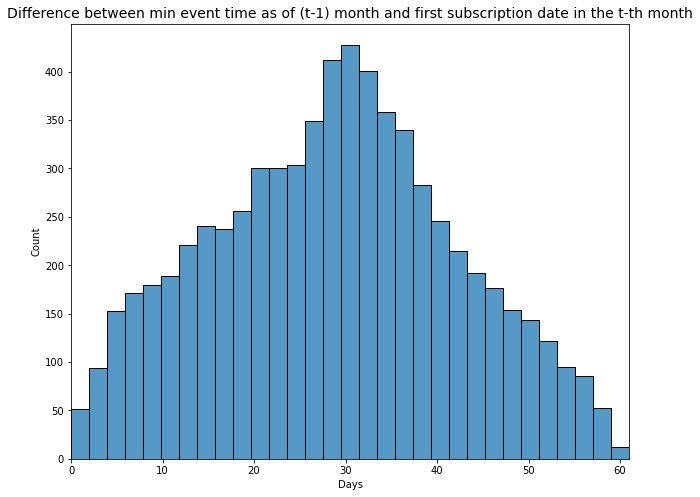

In [14]:
plt.subplots(figsize=(10, 8))
sns.histplot(pd.DataFrame(diff_target_min_event.drop(columns=['Unnamed: 0']).values.flatten()).dropna().values.flatten())
plt.xlabel('Days')
plt.title('Difference between min event time as of (t-1) month and first subscription date in the t-th month', fontsize=14)
plt.xlim(0, pd.DataFrame(diff_target_min_event.drop(columns=['Unnamed: 0']).values.flatten()).dropna().max()[0])
plt.show();

In [9]:
%%time

# то же самое, только для разницы между самым послденим логом и конвертациейи

diff_target_max_event = {}

for bs_name, start_date, end_date in res_ranges:
    
    print("======="*5, bs_name, "======="*5)
    
    print(f'{bs_name} start time: {datetime.now().strftime("%H:%M:%S")}', '\n')
    
    ids_wo_subs = (
        sdf
        .filter(
            (F.col('event_time') >= F.lit(start_date)) &
            (F.col('event_time') <= F.lit(end_date)) &
             F.col('subscription_date_start').isNull()
        )
        .withColumn('target_month', F.date_add(F.lit(end_date), 1))
    )

    file_path = f'/home/jovyan/__RAYDTT/bs_segments_new/{bs_name}.parquet'
    
    bs = spark.read.parquet(file_path)

    # к базовому сегменту тянем дату подписки из таргета, но только для сконвертировавшихся в текущем месяце!
    bs_with_target_date = bs.join(
        target.filter(target.target_month==(pd.to_datetime(end_date)+pd.DateOffset(days=1)).strftime("%Y-%m-%d")),
        bs.amplitude_id_bs==target.amplitude_id,
        'inner'
    ).select('amplitude_id_bs', 'target_date', 'target_date_timestamp')

    # по каждому пользователю в текущем месяце достаем МАКСИМАЛЬНОЕ время лога
    ids_wo_subs_temp = ids_wo_subs.groupBy('amplitude_id')\
        .agg(F.max('event_time_timestamp')).withColumnRenamed('max(event_time_timestamp)', 'max_event_time')

    # для всех ID с логами в апреле и купленной подпиской в мае можем посчитать длину их пути до конверсии
    # для target_date_timestamp==Nan => target_date, т.к. это ID c lifetime, по которым нет фактической target_date_timestamp
    bs4w_temp = bs_with_target_date.join(
        ids_wo_subs_temp,
        ids_wo_subs['amplitude_id'] == bs['amplitude_id_bs'],
        'left'
    ).select('amplitude_id', 'max_event_time', 'target_date', 'target_date_timestamp')

    bs4w = bs4w_temp\
        .withColumn('target_date_timestamp_upd', F.when(F.col('target_date_timestamp').isNull(), F.col('target_date')).otherwise(F.col('target_date_timestamp')))\
        .withColumn('target_date_timestamp_upd', F.to_timestamp('target_date_timestamp_upd'))\
        .withColumn('life_time_days', F.round((F.col('target_date_timestamp_upd').cast('long') - F.col('max_event_time').cast('long'))/(60*60*24), 0))

    diff_target_max_event[bs_name] = bs4w.select('life_time_days').toPandas()

=================================== bs_for_may_2022 ===================================
bs_for_may_2022 start time: 19:28:40 

=================================== bs_for_jun_2022 ===================================
bs_for_jun_2022 start time: 19:28:46 

=================================== bs_for_jul_2022 ===================================
bs_for_jul_2022 start time: 19:28:48 

=================================== bs_for_aug_2022 ===================================
bs_for_aug_2022 start time: 19:28:49 

=================================== bs_for_sep_2022 ===================================
bs_for_sep_2022 start time: 19:28:51 

=================================== bs_for_oct_2022 ===================================
bs_for_oct_2022 start time: 19:28:52 

=================================== bs_for_nov_2022 ===================================
bs_for_nov_2022 start time: 19:28:54 

=================================== bs_for_dec_2022 ===================================
bs_for_dec_2022 start t

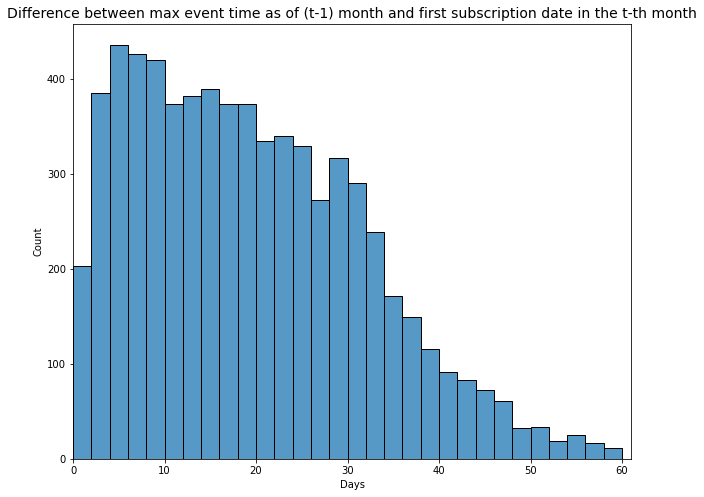

In [15]:
vals = []
for key in diff_target_max_event.keys():
    vals+=[*diff_target_max_event[key].values.flatten()]

plt.subplots(figsize=(10, 8))
sns.histplot(vals)
plt.xlabel('Days')
plt.title('Difference between max event time as of (t-1) month and first subscription date in the t-th month', fontsize=14)
plt.xlim(0, pd.DataFrame(diff_target_min_event.drop(columns=['Unnamed: 0']).values.flatten()).dropna().max()[0])
plt.show();

То есть гипотеза о том, что клиент конвертируется в среднем за месяц - верна (по первому графику).

# sdf_features_0

<span style="color:red">**Соображения по обработке фичей**</span>

**Transfer IP**

By using the library, you can convert IP addresses into integer values using:

str(ipaddress.IPv4Address('192.168.0.1'))

'192.168.0.1'

int(ipaddress.IPv4Address('192.168.0.1'))

**Coder for dates**

X['hour_cos'] = X.hour.map(lambda x: np.cos(2 * np.pi * x / 24))

X['hour_sin'] = X.hour.map(lambda x: np.sin(2 * np.pi * x / 24))

т.к. в месяце или 30, или 31 день, возьму 30,5 дней, но нам надо брать НЕ 30,5, а число дней в месяце, из которого дата

X['day_cos'] = X.day.map(lambda x: np.cos(2 * np.pi * x / 30.5))

X['day_sin'] = X.day.map(lambda x: np.sin(2 * np.pi * x / 30.5))

X['weekday_cos'] = X.weekday.map(lambda x: np.cos(2 * np.pi * (x+1) / 7))

X['weekday_sin'] = X.weekday.map(lambda x: np.sin(2 * np.pi * (x+1) / 7))

**Coder for coordinates (lat, longt)**

utm_udf_x = F.udf(lambda x,y: utm.from_latlon(x,y)[0], FloatType())

utm_udf_y = F.udf(lambda x,y: utm.from_latlon(x,y)[1], FloatType())

df = df.withColumn('UTM_x',utm_udf_x(F.col('lat'), F.col('lon')))

df = df.withColumn('UTM_y',utm_udf_y(F.col('lat'), F.col('lon')))

Otherwise

from math import radians, cos, sin, asin, sqrt

    def single_pt_haversine(lat, lng, degrees=True):

        """
        'Single-point' Haversine: Calculates the great circle distance

        between a point on Earth and the (0, 0) lat-long coordinate
        """
        r = 6371 # Earth's radius (km). Have r = 3956 if you want miles

        # Convert decimal degrees to radians
        if degrees:
            lat, lng = map(radians, [lat, lng])

        # 'Single-point' Haversine formula

        a = sin(lat/2)**2 + cos(lat) * sin(lng/2)**2
        d = 2 * r * asin(sqrt(a)) 

        return d
        
        import pandas as pd

        df = pd.DataFrame([[45.0, 120.0], [60.0, 30.0]], columns=['x', 'y'])
        df
              x      y
        0  45.0  120.0
        1  60.0   30.0

        df['harvesine_distance'] = [single_pt_haversine(x, y) for x, y in zip(df.x, df.y)]

In [17]:
# атрибуты для переработки в фичи

attr2feats = pd.read_excel('./nans_ray_data_.xlsx', sheet_name='Sheet3', header=None).values.flatten()

In [18]:
attr2feats

array(['$insert_id', 'ab-test', 'amplitude_id', 'app', 'city',
       'client_event_time', 'client_upload_time', 'cohort_day',
       'cohort_month', 'cohort_week', 'cohort_year', 'country',
       'data_type', 'device_carrier', 'device_family', 'device_id',
       'device_type', 'event_id', 'event_time', 'event_type',
       'explain_errors', 'favorites_count', 'hazard_progress',
       'hazard_solved', 'ip_address', 'language', 'library', 'os_name',
       'os_version', 'percent_solved', 'platform', 'processed_time',
       'push_permission', 'region', 'right_answers',
       'server_received_time', 'server_upload_time', 'session_id',
       'show_hint', 'start_version', 'time', 'uuid', 'version_name',
       'wrong_answers', 'max_daily_streak', 'path'], dtype=object)

In [26]:
pd.DataFrame({'1': [1, 2]}.values()).T

,0
0,1
1,2


In [ ]:
################################## дальше не трогал ничего ######################################

In [15]:
!pip install openpyxl

  Using cached openpyxl-3.1.2-py2.py3-none-any.whl (249 kB)
  Using cached et_xmlfile-1.1.0-py3-none-any.whl (4.7 kB)


In [232]:
%%time
file_path = 'bs_segments_new/sdf_features_w.parquet'
sdf = spark.read.parquet(file_path)

CPU times: user 1.74 ms, sys: 51 µs, total: 1.79 ms
Wall time: 215 ms


In [11]:
sdf_features_all.describe().show()

+-------+--------------------+-------------------+-------------------+------------------+-----------------+------------------+-----------------+------------------+------------------+------------------+------------------+------------------+------------------+---------+--------------------+------------------+-----------------+-------------------+-------------+-------------+-------------+--------+-------------+---------+---------------+--------------------+------------+-----------+-------------------+---------+------------------+
|summary|        amplitude_id|           event_id|     explain_errors|   favorites_count|  hazard_progress|     hazard_solved|   percent_solved|     right_answers|     wrong_answers|        cohort_day|       cohort_week|      cohort_month|       cohort_year|      app|          session_id|              time|     location_lat|       location_lng|         city|       region|      country|currency|device_family|  os_name|push_permission|             ab-test|  ip_addr

In [12]:
init_columns = ['amplitude_id', 'event_time']

numeric_columns = ['event_id', 'explain_errors', 
                   'favorites_count', 'hazard_progress', 'hazard_solved', 'percent_solved', 
                   'right_answers', 'wrong_answers',
                   'cohort_day', 'cohort_week', 'cohort_month', 'cohort_year',
                   'app', 'session_id', 'time']

categorical_columns = ['location_lat', 'location_lng', 'city', 
                       'region', 'country', 'currency', 'device_family', 'os_name', 'push_permission',
                       'ab-test', 'ip_address', 'language', 'library', 'platform', 'show_hint', 'event_type']


In [16]:
attr2feats = pd.read_excel('./nans_ray_data_.xlsx', sheet_name='Sheet3', header=None).values.flatten()

In [17]:
set(attr2feats) - set(sdf_features_all.columns)

{'$insert_id',
 'client_event_time',
 'client_upload_time',
 'data_type',
 'device_carrier',
 'device_id',
 'device_type',
 'event_type',
 'max_daily_streak',
 'os_version',
 'path',
 'processed_time',
 'server_received_time',
 'server_upload_time',
 'start_version',
 'uuid',
 'version_name'}

In [18]:
set(sdf_features_all.columns) - set(attr2feats)

{'currency', 'location_lat', 'location_lng'}

In [20]:
import ipaddress

In [22]:
int(ipaddress.ip_address('86.177.1.81'))

1454440785

In [163]:
temp = sdf_features_all.select('city').groupBy('city').agg(F.count('city')).withColumnRenamed('count(city)', 'count')

In [166]:
temp.show()

+--------------------+------+
|                city| count|
+--------------------+------+
|           Worcester|160855|
|             Hengoed| 84639|
|            Hargeisa|  1666|
|            Kolomyia|    33|
|            Seascale|  3550|
|           Paralimni|   102|
|        Thessaloniki|  1206|
|Stanley, County D...|    38|
|             Hanover|   535|
|             Antwerp|   800|
|          Sallanches|    38|
|             Radauti|   390|
|                 Bow|  9789|
|  Kirkby in Ashfield|  4855|
|            Chisinau|  7687|
|Shenley Brook End...|   160|
|          Spennymoor| 20005|
|         Knottingley|  3009|
|            Knaphill|   465|
|             Totland|    28|
+--------------------+------+
only showing top 20 rows



In [168]:
temp.select('count').rdd.max()[0]

9062603

In [169]:
temp.filter(F.col('count')==9062603).select('city', 'count').show()

+------+-------+
|  city|  count|
+------+-------+
|London|9062603|
+------+-------+



In [29]:
sdf_features_all.select('location_lat', 'location_lng').printSchema()

root
 |-- location_lat: double (nullable = true)
 |-- location_lng: double (nullable = true)



In [50]:
sdf_features_all = sdf_features_all.withColumn('lat_lng', F.format_string("%s_%s", F.col('location_lat'), F.col('location_lng')))

In [51]:
lat_lng = sdf_features_all.select('lat_lng').distinct().toPandas()

In [57]:
lat_lng_copy = lat_lng.copy()

In [80]:
lat_lng['lat'] = lat_lng.lat_lng.apply(lambda row: row.split("_")[0] if row.split("_")[0]!='null' else None).values.astype("float64")
lat_lng['lng'] = lat_lng.lat_lng.apply(lambda row: row.split("_")[1] if row.split("_")[1]!='null' else None).values.astype("float64")

<AxesSubplot:>

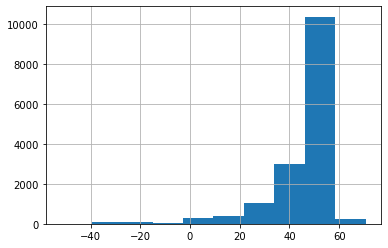

In [81]:
lat_lng.lat.hist()

<AxesSubplot:>

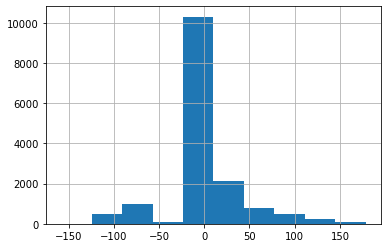

In [82]:
lat_lng.lng.hist()

In [2]:
!pip install folium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.0/100.0 KB 771.6 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 KB 6.4 MB/s eta 0:00:00


In [3]:
import folium

In [149]:
lat_lng.lng.mode().values[0]

-1.85

In [147]:
lat_lng.lat.mode().values[0]

51.4892

In [97]:
lat_lng.dropna(inplace=True)

AttributeError: 'DataFrame' object has no attribute 'sgape'

In [99]:
lat_lng.shape

(15617, 3)

In [178]:
geomap = folium.Map(location=[lat_lng.lat.mode().values[1], lat_lng.lng.mode().values[0]], zoom_start = 2.5, titles = 'Stamen Terrain')

In [4]:
folium.CircleMarker(location=[51.5085300, -0.1257400],
                                            radius = 0.01,
                                            color = 'red', 
                                            fill_color = 'Red', 
                                            overlay=False,
                                            control=True).add_to(geomap)

NameError: name 'geomap' is not defined

In [171]:
geomap

In [179]:
lat_lng.apply(lambda x: folium.CircleMarker(location=[x['lat'], x['lng']],
                                            radius = 0.00001,
                                            color = 'red', 
                                            fill_color = 'Red', 
                                            overlay=False,
                                            control=True).add_to(geomap), axis=1)

0        <folium.vector_layers.CircleMarker object at 0...
1        <folium.vector_layers.CircleMarker object at 0...
2        <folium.vector_layers.CircleMarker object at 0...
3        <folium.vector_layers.CircleMarker object at 0...
4        <folium.vector_layers.CircleMarker object at 0...
                               ...                        
15613    <folium.vector_layers.CircleMarker object at 0...
15614    <folium.vector_layers.CircleMarker object at 0...
15615    <folium.vector_layers.CircleMarker object at 0...
15616    <folium.vector_layers.CircleMarker object at 0...
15617    <folium.vector_layers.CircleMarker object at 0...
Length: 15617, dtype: object

In [180]:
folium.CircleMarker(location=[51.5085300, -0.1257400],
                                            radius = 0.1,
                                            color = 'black', 
                                            fill_color = 'Black', 
                                            overlay=False,
                                            control=True,
                                           popup = 'London'
                   ).add_to(geomap)

In [181]:
geomap

In [119]:
sdf_features_all.select('country', 'region').show()

+--------------+-----------+
|       country|     region|
+--------------+-----------+
|United Kingdom|East Sussex|
|United Kingdom|East Sussex|
|United Kingdom|East Sussex|
|United Kingdom|East Sussex|
|United Kingdom|East Sussex|
|United Kingdom|East Sussex|
|United Kingdom|East Sussex|
|United Kingdom| Birmingham|
|United Kingdom| Birmingham|
|United Kingdom| Birmingham|
|United Kingdom| Birmingham|
|United Kingdom| Birmingham|
|United Kingdom| Birmingham|
|         Spain|  Barcelona|
|         Spain|  Barcelona|
|         Spain|  Barcelona|
|         Spain|  Barcelona|
|         Spain|  Barcelona|
|         Spain|  Barcelona|
|         Spain|  Barcelona|
+--------------+-----------+
only showing top 20 rows



In [217]:
location_feats = sdf_features_all.select('city', 'location_lat', 'location_lng')

In [241]:
# расчет гаверсинуса и расстояния на нем
def haversine_spark(df, col_lat2, col_lon2, col_name="distance"):
    
    # взяли типа Лондон
    df = (
        df\
        .withColumn("lat_base", F.when(F.col(col_lat2).isNull(), None).otherwise(F.lit(51.50853000)))\
        .withColumn("lng_base", F.when(F.col(col_lon2).isNull(), None).otherwise(F.lit(-0.12574000)))
    )
    
    col_lat1, col_lon1 = "lat_base", "lng_base"
    df = df.withColumn("a", F.when(F.col(col_lat2).isNotNull() & F.col(col_lon2).isNotNull(), F.pow(F.sin(F.radians(df[col_lat2] - df[col_lat1]) / 2), 2) + F.cos(F.radians(col_lat1)) * F.cos(F.radians(col_lat2)) * F.pow(F.sin(F.radians(df[col_lon2] - df[col_lon1]) / 2), 2)).otherwise(None))
    df = df.withColumn(col_name, F.atan2(F.sqrt(df["a"]), F.sqrt(-df["a"] + 1)) * 2 * 6371)
    return df.drop("a", "lat_base", "lng_base")

In [242]:
sdf = haversine_spark(sdf, 'location_lat', 'location_lng')

In [228]:
location_feats = haversine_spark(location_feats, 'latitude_b', 'longitude_b', 'location_lat', 'location_lng')

In [243]:
sdf.printSchema()

root
 |-- amplitude_id: long (nullable = true)
 |-- event_time: timestamp (nullable = true)
 |-- event_id: long (nullable = true)
 |-- explain_errors: long (nullable = true)
 |-- favorites_count: long (nullable = true)
 |-- hazard_progress: long (nullable = true)
 |-- hazard_solved: long (nullable = true)
 |-- percent_solved: double (nullable = true)
 |-- right_answers: long (nullable = true)
 |-- wrong_answers: long (nullable = true)
 |-- cohort_day: long (nullable = true)
 |-- cohort_week: long (nullable = true)
 |-- cohort_month: long (nullable = true)
 |-- cohort_year: long (nullable = true)
 |-- app: long (nullable = true)
 |-- session_id: long (nullable = true)
 |-- time: long (nullable = true)
 |-- location_lat: double (nullable = true)
 |-- location_lng: double (nullable = true)
 |-- city: string (nullable = true)
 |-- region: string (nullable = true)
 |-- country: string (nullable = true)
 |-- currency: string (nullable = true)
 |-- device_family: string (nullable = true)
 |--

In [13]:
location_feats = location_feats\
    .withColumn('latitude_rad', F.when(F.col('location_lat').isNull(), None).otherwise(F.radians('location_lat')))\
    .withColumn('longitude_rad', F.when(F.col('location_lng').isNull(), None).otherwise(F.radians('location_lng')))\
    .withColumn('latitude_rad_b', F.when(F.col('location_lat').isNull(), None).otherwise(F.radians(F.lit(51.50853000))))\
    .withColumn('longitude_rad_b', F.when(F.col('location_lng').isNull(), None).otherwise(F.radians(F.lit(-0.12574000))))\
    .withColumn('dlat', F.when(F.col('location_lat').isNull(), None).otherwise(F.col('latitude_rad')-F.col('latitude_rad_b')))\
    .withColumn('dlon', F.when(F.col('location_lng').isNull(), None).otherwise(F.col('longitude_rad')-F.col('longitude_rad_b')))\
    .withColumn('area', F.when(F.col('location_lat').isNotNull() & F.col('location_lng').isNotNull(),\
            F.sin(F.col('dlat') / 2)**2 + F.cos('latitude_rad_b') * F.cos('latitude_rad') * F.sin(F.col('dlon') / 2)**2).otherwise(None))\
    .withColumn('distance',  F.when(F.col('area').isNull(), None).otherwise(F.abs(6372.8 * (2 * F.asin(F.sqrt('area'))))))

In [244]:
sdf.select('city', 'distance').show()

+----------+------------------+
|      city|          distance|
+----------+------------------+
|  Uckfield|              null|
|  Uckfield|              null|
|  Uckfield|262.06487221655203|
|  Uckfield|262.06487221655203|
|  Uckfield|262.06487221655203|
|  Uckfield|262.06487221655203|
|  Uckfield|262.06487221655203|
|Birmingham|162.16349256038944|
|Birmingham|162.16349256038944|
|Birmingham|162.16349256038944|
|Birmingham|162.16349256038944|
|Birmingham|162.16349256038944|
|Birmingham|162.16349256038944|
|   Manresa|              null|
|   Manresa|              null|
|   Manresa|170.86750054230416|
|   Manresa|1138.9712073646965|
|   Manresa|1138.9712073646965|
|   Manresa|1138.9712073646965|
|   Manresa|1138.9712073646965|
+----------+------------------+
only showing top 20 rows



In [231]:
location_feats.filter(location_feats.city=='London').select('city', 'distance').groupBy('city').agg(F.max('distance')).show()

+------+------------------+
|  city|     max(distance)|
+------+------------------+
|London|16993.449615150774|
+------+------------------+



In [127]:
location_feats = location_feats.withColumn('longitude_rad', F.radians('location_lng'))

In [152]:
location_feats = location_feats.withColumn('latitude_rad_b', F.radians(F.lit(51.4892)))
location_feats = location_feats.withColumn('longitude_rad_b', F.radians(F.lit(-1.85)))

In [153]:
location_feats = location_feats.withColumn('dlon', F.col('longitude_rad')-F.col('longitude_rad_b'))
location_feats = location_feats.withColumn('dlat', F.col('latitude_rad')-F.col('latitude_rad_b'))

In [155]:
location_feats.filter(location_feats.longitude_rad.isNull()).select('longitude_rad', 'latitude_rad', 'dlon', 'dlat').show(truncate=False)

+-------------+------------+----+----+
|longitude_rad|latitude_rad|dlon|dlat|
+-------------+------------+----+----+
|null         |null        |null|null|
+-------------+------------+----+----+



In [ ]:
def calculate_distance(lat1, lon1, lat2, lon2):
    # approximate radius of earth in km
    R = 6373.0

    lat1 = radians(lat1)
    lon1 = radians(lon1)
    lat2 = radians(lat2)
    lon2 = radians(lon2)

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance

In [ ]:
np.radians('')

In [157]:
location_feats = location_feats.withColumn(
    'a', 
    F.sin(F.col('dlat') / 2)**2 + F.cos('latitude_rad_b') * F.cos('latitude_rad') * F.sin(F.col('dlon') / 2)**2
)

In [158]:
location_feats.select('longitude_rad', 'latitude_rad', 'dlon', 'dlat', 'a').show(truncate=False)

+----------------------+-------------------+----------------------+----------------------+---------------------+
|longitude_rad         |latitude_rad       |dlon                  |dlat                  |a                    |
+----------------------+-------------------+----------------------+----------------------+---------------------+
|0.0012461650859239514 |0.8998289304752044 |0.03353475624781905   |0.0011728612573401742 |1.0917516041622822E-4|
|0.013781119773747224  |0.9000907298630035 |0.04606971093564233   |0.0014346606451393074 |2.058268505973866E-4 |
|-0.013721778579179418 |0.9081070271174138 |0.018566812582715683  |0.009450957899549528  |5.534402496622412E-5 |
|-0.003837979025135531 |0.8989178686056634 |0.02845061213675957   |2.6179938779913314E-4 |7.84423912557137E-5  |
|-0.037800340939693186 |0.9255097050890492 |-0.005511749777798086 |0.026853635871184944  |1.8311276384180253E-4|
|-0.012603022528651054 |0.9074787085866957 |0.019685568633244048  |0.00882263936883143   |5.6601

In [183]:
location_feats = location_feats.withColumn(
    'distance',
    6373.0 * (2 * F.atan2(F.sqrt(F.col('a')), F.sqrt(1-F.col('a'))))
)

In [184]:
location_feats.select('distance').show()

+------------------+
|          distance|
+------------------+
| 133.1814491605257|
|182.86888965371014|
| 94.82291246584877|
| 112.8898781620432|
|172.48307180620512|
| 95.89439812581476|
|  169.562571787299|
|116.35212953167097|
| 96.63223129688473|
|122.75203177404101|
| 1057.768511832359|
| 82.77741149351415|
|  222.230274109771|
|385.51455019545523|
| 729.3946697383777|
|205.72099850955507|
| 36.54349087076916|
| 6846.955157709445|
|  9126.44097838179|
|2687.3845631242916|
+------------------+
only showing top 20 rows



In [185]:
location_feats.columns

['location_lat',
 'location_lng',
 'latitude_rad',
 'longitude_rad',
 'lat_lng',
 'latitude_rad_b',
 'longitude_rad_b',
 'dlon',
 'dlat',
 'a',
 'distance']

In [ ]:
init_columns = ['amplitude_id', 'event_time']

numeric_columns = ['event_id', 'explain_errors', 
                   'favorites_count', 'hazard_progress', 'hazard_solved', 'percent_solved', 
                   'right_answers', 'wrong_answers',
                   'cohort_day', 'cohort_week', 'cohort_month', 'cohort_year',
                   'app', 'session_id', 'time']

categorical_columns = ['location_lat', 'location_lng', 'city', 
                       'region', 'country', 'currency', 'device_family', 'os_name', 'push_permission',
                       'ab-test', 'ip_address', 'language', 'library', 'platform', 'show_hint']

columns = init_columns + numeric_columns + categorical_columns
len(columns), len(set(columns))

sdf = None

for parquet in parquets:
    
    sdf_temp = spark.read.parquet(parquet).select(columns)
    
    sdf_temp = (
            sdf_temp
            .withColumn('event_time', F.col('event_time').cast('timestamp'))
            .withColumn('explain_errors', F.col('explain_errors').cast(LongType()))
           )
                        
    if sdf is None:
        sdf = sdf_temp
    else:
        sdf = sdf.unionByName(sdf_temp, allowMissingColumns=True)
        
%%time
file_path = f'{s3a}/bs_segments_new/sdf_features_w.parquet'

sdf.write.parquet(path = file_path, mode = 'overwrite')

In [ ]:
city, region, country, currency, device_family, os_name, push_permission

agg: event_time / event_type

location_lat
location_lng - OK
* country - OK
* region - OK
* interface_language - OK
* language - OK
* interface_language_changed - OK

* trial - OK
* push_permission - OK

* device_type - OK
* device_family - OK
* device_carrier - OK
* os_name - OK
* ip_address - OK
* AB-test - OK
---------
* promocode_sd_exam_passed - OK
* AB-test -- OK
* ads_watched -- OK
* show_hint -- OK
* os_name / platform -- OK

In [111]:
columns = ['amplitude_id', 'event_time', 'event_type', 'location_lat', 'location_lng']

columns = ['amplitude_id', 'event_time', 'location_lat', 'location_lng', 
           'city', 'region', 'country', 'currency', 'device_family', \
           'os_name', 'push_permission']

sdf = None

for parquet in parquets:
    
    sdf_temp = spark.read.parquet(parquet).select(columns)
    
    sdf_temp = (
                sdf_temp
                #.cast('long'))
                .withColumn('event_time', F.col('event_time').cast('timestamp'))
                # BETTER !
                .withColumn('location_lat', F.coalesce(F.col('location_lat'), F.lit(0)))
                .withColumn('location_lng', F.coalesce(F.col('location_lng'), F.lit(0)))
               )
                        
    if sdf is None:
        sdf = sdf_temp
    else:
        sdf = sdf.unionByName(sdf_temp, allowMissingColumns=True)

In [112]:
%%time
file_path = f'{s3a}/bs_segments/sdf_features_0.parquet'

sdf.write.parquet(path = file_path, mode = 'overwrite')

CPU times: user 63.7 ms, sys: 23.8 ms, total: 87.6 ms
Wall time: 9min 18s


In [114]:
!cd bs_segments; ls -a

.		    bs_for_jan.parquet	bs_for_oct.parquet
..		    bs_for_jul.parquet	bs_for_sep.parquet
bs_for_apr.parquet  bs_for_jun.parquet	sdf_features_0.parquet
bs_for_aug.parquet  bs_for_mar.parquet	sdf_init.parquet
bs_for_dec.parquet  bs_for_may.parquet	target.parquet
bs_for_feb.parquet  bs_for_nov.parquet


# bs_for_month_features_0

In [7]:
bs_for_months = [i[0] for i in month_date_ranges]
bs_for_months

['bs_for_feb',
 'bs_for_mar',
 'bs_for_apr',
 'bs_for_may',
 'bs_for_jun',
 'bs_for_jul',
 'bs_for_aug',
 'bs_for_sep',
 'bs_for_oct',
 'bs_for_nov',
 'bs_for_dec',
 'bs_for_jan']

In [53]:
spark.sql('DROP VIEW IF EXISTS bs_for_aug_features_0')
spark.sql('DROP VIEW IF EXISTS bs_for_aug')
spark.sql('DROP VIEW IF EXISTS sdf')
spark.sql('SHOW TABLES').show()

+---------+---------+-----------+
|namespace|tableName|isTemporary|
+---------+---------+-----------+
+---------+---------+-----------+



In [54]:
sdf = spark.read.parquet('bs_segments/sdf_features_0.parquet')
sdf.createOrReplaceTempView('sdf')
spark.sql('SHOW TABLES').show()

+---------+---------+-----------+
|namespace|tableName|isTemporary|
+---------+---------+-----------+
|         |      sdf|       true|
+---------+---------+-----------+



**Comment:** for agg choose an appropriate window period.

In [55]:
query = '''
(
WITH 

bs_0 AS 
(
    SELECT 
        sdf.*
        ,bs.target_month
    FROM sdf
    INNER JOIN bs
        ON bs.amplitude_id = sdf.amplitude_id
    WHERE sdf.event_time < bs.target_month
),

max_event_time AS
(
    SELECT 
        amplitude_id
        ,MAX(event_time) AS max_event_time
    FROM bs_0
    GROUP BY amplitude_id
),

bs_max_event_time AS
(
    SELECT 
        bs_0.*
        ,ROW_NUMBER() OVER (PARTITION BY bs_0.amplitude_id, bs_0.event_time ORDER BY bs_0.location_lat DESC) AS row_n
    FROM bs_0
    INNER JOIN max_event_time met
        ON bs_0.amplitude_id = met.amplitude_id
        AND bs_0.event_time = met.max_event_time
)

SELECT 
    *
FROM bs_max_event_time
WHERE row_n = 1

)
'''

In [56]:
%%time
for bs_for_month in bs_for_months:
    
    print(f'{bs_for_month} start time: {datetime.now().strftime("%H:%M:%S")}')
    
    bs = spark.read.parquet(f'bs_segments/{bs_for_month}.parquet')
    bs.createOrReplaceTempView('bs')
    
    bs_for_month_features_0 = spark.sql(query)
    
    file_path = f'{s3a}/bs_segments/{bs_for_month}_features_0.parquet'

    bs_for_month_features_0.write.parquet(path = file_path, mode = 'overwrite')
    
    spark.sql('DROP VIEW IF EXISTS bs')
    del bs, bs_for_month_features_0
    gc.collect()
     
    print(f'{bs_for_month} finish time: {datetime.now().strftime("%H:%M:%S")}')

bs_for_feb start time: 22:05:18
bs_for_feb finish time: 22:05:29
bs_for_mar start time: 22:05:29
bs_for_mar finish time: 22:05:39
bs_for_apr start time: 22:05:39
bs_for_apr finish time: 22:05:50
bs_for_may start time: 22:05:50
bs_for_may finish time: 22:06:01
bs_for_jun start time: 22:06:01
bs_for_jun finish time: 22:06:14
bs_for_jul start time: 22:06:14
bs_for_jul finish time: 22:06:27
bs_for_aug start time: 22:06:27
bs_for_aug finish time: 22:06:41
bs_for_sep start time: 22:06:41
bs_for_sep finish time: 22:06:57
bs_for_oct start time: 22:06:57
bs_for_oct finish time: 22:08:09
bs_for_nov start time: 22:08:09
bs_for_nov finish time: 22:08:25
bs_for_dec start time: 22:08:25
bs_for_dec finish time: 22:08:41
bs_for_jan start time: 22:08:41
bs_for_jan finish time: 22:08:56
CPU times: user 434 ms, sys: 10.9 ms, total: 445 ms
Wall time: 3min 38s


In [73]:
%%time
for bs_for_month in bs_for_months:
    bs_for_month = spark.read.parquet(f'bs_segments/{bs_for_month}.parquet')
    print(bs_for_month.count(), bs_for_month.select('amplitude_id').distinct().count(), \
          bs_for_month.count() == bs_for_month.select('amplitude_id').distinct().count())

39289 39289 True
40573 40573 True
47453 47453 True
50795 50795 True
61435 61435 True
74258 74258 True
82073 82073 True
85075 85075 True
69362 69362 True
64782 64782 True
74944 74944 True
72779 72779 True
CPU times: user 18.6 ms, sys: 35 ms, total: 53.6 ms
Wall time: 4.21 s


In [74]:
%%time
for bs_for_month in bs_for_months:
    bs_for_month_features_0 = spark.read.parquet(f'bs_segments/{bs_for_month}_features_0.parquet')
    print(bs_for_month_features_0.count(), bs_for_month_features_0.select('amplitude_id').distinct().count(), \
          bs_for_month_features_0.count() == bs_for_month_features_0.select('amplitude_id').distinct().count())

39289 39289 True
40573 40573 True
47453 47453 True
50795 50795 True
61435 61435 True
74258 74258 True
82073 82073 True
85075 85075 True
69362 69362 True
64782 64782 True
74944 74944 True
72779 72779 True
CPU times: user 29.7 ms, sys: 18.1 ms, total: 47.8 ms
Wall time: 5.15 s


# Sampling

In [9]:
# parquets = [f'bs_segments/{bs_for_month}_features_0.parquet' for bs_for_month in bs_for_months]
parquets = glob.glob('bs_segments/bs_for_*_features_0.parquet')
parquets

['bs_segments/bs_for_apr_features_0.parquet',
 'bs_segments/bs_for_aug_features_0.parquet',
 'bs_segments/bs_for_dec_features_0.parquet',
 'bs_segments/bs_for_feb_features_0.parquet',
 'bs_segments/bs_for_jan_features_0.parquet',
 'bs_segments/bs_for_jul_features_0.parquet',
 'bs_segments/bs_for_jun_features_0.parquet',
 'bs_segments/bs_for_mar_features_0.parquet',
 'bs_segments/bs_for_may_features_0.parquet',
 'bs_segments/bs_for_nov_features_0.parquet',
 'bs_segments/bs_for_oct_features_0.parquet',
 'bs_segments/bs_for_sep_features_0.parquet']

In [10]:
%%time
sdf = None

for parquet in parquets:
    
    sdf_temp = spark.read.parquet(parquet).drop('row_n')
                        
    if sdf is None:
        sdf = sdf_temp
    else:
        sdf = sdf.unionByName(sdf_temp, allowMissingColumns=True)

CPU times: user 15.9 ms, sys: 484 µs, total: 16.3 ms
Wall time: 4.48 s


In [11]:
sdf.show(10, 100, True)

-RECORD 0----------------------------------
 amplitude_id    | 290137056979            
 event_time      | 2023-03-25 16:03:10.459 
 location_lat    | 51.5645                 
 location_lng    | 0.4574                  
 city            | Basildon                
 region          | Essex                   
 country         | United Kingdom          
 currency        | null                    
 device_family   | Apple iPhone            
 os_name         | ios                     
 push_permission | not_granted             
 target_month    | 2023-04-01              
-RECORD 1----------------------------------
 amplitude_id    | 298287141464            
 event_time      | 2023-03-20 22:22:40.384 
 location_lat    | 51.4964                 
 location_lng    | -0.1224                 
 city            | Egham                   
 region          | Surrey                  
 country         | United Kingdom          
 currency        | null                    
 device_family   | Apple iPhone 

In [12]:
sdf.count()

762818

In [84]:
sdf.printSchema()

root
 |-- amplitude_id: long (nullable = true)
 |-- event_time: timestamp (nullable = true)
 |-- location_lat: double (nullable = true)
 |-- location_lng: double (nullable = true)
 |-- city: string (nullable = true)
 |-- region: string (nullable = true)
 |-- country: string (nullable = true)
 |-- currency: string (nullable = true)
 |-- device_family: string (nullable = true)
 |-- os_name: string (nullable = true)
 |-- push_permission: string (nullable = true)
 |-- target_month: date (nullable = true)



In [13]:
target = spark.read.parquet('bs_segments/target.parquet')
target = target.withColumnRenamed('amplitude_id', 'amplitude_id_target')
target = target.withColumnRenamed('target_month', 'target_month_target')
target.printSchema()

root
 |-- amplitude_id_target: long (nullable = true)
 |-- target_date: date (nullable = true)
 |-- target_month_target: date (nullable = true)



In [14]:
sdf_w_target = sdf.join(
                    target,
                    (sdf.amplitude_id == target.amplitude_id_target) & (sdf.target_month == target.target_month_target),
                    'left').drop('amplitude_id_target', 'target_month_target')

sdf_w_target = sdf_w_target.withColumn('target', F.when(F.col('target_date').isNull(), 0).otherwise(1))

In [15]:
sdf_w_target.printSchema()

root
 |-- amplitude_id: long (nullable = true)
 |-- event_time: timestamp (nullable = true)
 |-- location_lat: double (nullable = true)
 |-- location_lng: double (nullable = true)
 |-- city: string (nullable = true)
 |-- region: string (nullable = true)
 |-- country: string (nullable = true)
 |-- currency: string (nullable = true)
 |-- device_family: string (nullable = true)
 |-- os_name: string (nullable = true)
 |-- push_permission: string (nullable = true)
 |-- target_month: date (nullable = true)
 |-- target_date: date (nullable = true)
 |-- target: integer (nullable = false)



In [16]:
sdf_w_target.count()

762818

In [27]:
result_df = sdf_w_target.groupBy("target_month") \
    .agg(
        F.count("*").alias("count"),  # Counts all rows in each group
        F.sum("target").alias("target_count"),  # Sums up the 'target' column values per group
        # Calculate the sum of target divided by the count of rows
        (F.sum("target") / F.count("*")).alias("target_ratio")
    )

result_df_pd = result_df.toPandas()
result_df_pd['target_ratio'] = np.round(result_df_pd['target_ratio'], 4)
result_df_pd

,target_month,count,target_count,target_ratio
0,2023-02-01,39289,148,0.0038
1,2023-03-01,40573,198,0.0049
2,2023-04-01,47453,220,0.0046
3,2023-05-01,50795,260,0.0051
4,2023-06-01,61435,337,0.0055
5,2023-07-01,74258,557,0.0075
6,2023-08-01,82073,515,0.0063
7,2023-09-01,85075,495,0.0058
8,2023-10-01,69362,302,0.0044
9,2023-11-01,64782,322,0.0050


In [28]:
result_df = sdf_w_target \
    .agg(
        F.count("*").alias("count"),  # Counts all rows in each group
        F.sum("target").alias("target_count"),  # Sums up the 'target' column values per group
        # Calculate the sum of target divided by the count of rows
        (F.sum("target") / F.count("*")).alias("target_ratio")
    )

result_df_pd = result_df.toPandas()
result_df_pd['target_ratio'] = np.round(result_df_pd['target_ratio'], 4)
result_df_pd

,count,target_count,target_ratio
0,762818,3778,0.005


In [17]:
ratio_of_ones_in_train_sampled = 0.3
ratio_of_ones_in_test_sampled = 0.015

test_part = 0.2
train_part = 1 - test_part
test_to_train = test_part / train_part

train_part, test_part, test_to_train, ratio_of_ones_in_train_sampled, ratio_of_ones_in_test_sampled

(0.8, 0.2, 0.25, 0.3, 0.015)

In [18]:
train, test = sdf_w_target.randomSplit([train_part, test_part], seed = SEED)

In [27]:
train.count()

609983

## Train

In [31]:
train_sampled_count_1 = train.filter(F.col('target') == 1).count()
train_sampled_count = train_sampled_count_1 / ratio_of_ones_in_train_sampled
train_sampled_count_0 = train_sampled_count - train_sampled_count_1
train_fractions_0 = train_sampled_count_0 / train.filter(F.col('target') == 0).count()
train_fractions_0

0.011590396857824465

In [33]:
train_sampled_count_0

7035.0

In [21]:
train_fractions = {0 : train_fractions_0, 1 : 1} # different fractions
train_sampled = train.sampleBy(col = 'target', fractions = train_fractions, seed = SEED)

In [22]:
train_sampled.count(),\
train_sampled.filter(F.col('target') == 0).count(),\
train_sampled.filter(F.col('target') == 1).count(),\
train_sampled_count_1

(10115, 7107, 3008, 3008)

In [23]:
result_df = train_sampled \
    .agg(
        F.count("*").alias("count"),  # Counts all rows in each group
        F.sum("target").alias("sum_target"),  # Sums up the 'target' column values per group
        # Calculate the sum of target divided by the count of rows
        (F.sum("target") / F.count("*")).alias("average_target")
    )
result_df.show(100)

+-----+----------+-----------------+
|count|sum_target|   average_target|
+-----+----------+-----------------+
|10115|      3008|0.297380128521997|
+-----+----------+-----------------+



In [65]:
file_path = f'bs_segments/train_sampled.csv'

train_sampled.toPandas().to_csv(file_path, index=False)

In [66]:
file_path = f'bs_segments/train_sampled.csv'
train_sampled = pd.read_csv(file_path)

(10116, 14)

## Alternative way + modelling

In [6]:
numeric_columns = pd.DataFrame(['event_id', 'explain_errors', 
                   'favorites_count', 'hazard_progress', 'hazard_solved', 'percent_solved', 
                   'right_answers', 'wrong_answers',
                   'cohort_day', 'cohort_week', 'cohort_month', 'cohort_year',
                   'app', 'session_id', 'time',
                   'location_lat', 'location_lng'])

categorical_columns = pd.DataFrame(['event_type', 'city', 
                       'region', 'country', 'device_family', 'os_name', 'push_permission',
                       'ab-test', 'ip_address', 'language', 'library', 'platform', 'show_hint'])

In [6]:
!pip install openpyxl -q
import openpyxl

pd.concat([numeric_columns, categorical_columns], axis=0).reset_index().to_excel('./feats.xlsx')

In [18]:
# сттроит выборки кросс-валидации с реклассом в переданном датафрейме

import random

def build_subsample(
        X_test: object,
        target_name: str, 
        target_class: int, 
        target_class_decrease: bool,
        share: float,
        random_seed: list

    ) -> np.array:
        
        # таргет
        y_true = X_test.loc[:, target_name]
        # отделил целевой класс от нецелевого
        y_true_target_class = y_true[y_true==target_class]
        y_true_non_target_class = y_true[y_true!=target_class]

        if target_class_decrease:
            # уменьшаем целевой класс: в числителе пропорция по нахождению меньшего, чем фактическое, значения целевого класса
            # при условии, что нецелевой класс берется полностью
            decrease_share = ((len(y_true_non_target_class)*share) / (1-share)) / len(y_true_target_class)
            # ловит случай, когда доля текущего целевого класса = 0%
            if decrease_share==0:
                return np.array([None])
            # ловит случай, когда доля текущего целевого класса > 100%
            # (например, на трейне был имбаланс по целевому классу, на тесте - по нецелевому)
            elif decrease_share>1:
                decrease_share=1
            y_true_target_class_sliced = y_true_target_class.sample(frac = decrease_share, random_state = random_seed)
            y_true_new = pd.concat([y_true_target_class_sliced, y_true_non_target_class], axis=0)

        else:
            # увеличиваем целевой класс: в числителе пропорция по нахождению меньшего, чем фактическое, значения нецелевого класса
            # при условии, что целевой класс берется полностью
            decrease_share = ((len(y_true_target_class)*(1-share)) / share) / len(y_true_non_target_class)
            # для случае, когда берется та же доля целевого и нецелевого классов, что и была
            # ловит случай, когда доля текущего целевого класса = 0%
            if decrease_share==0:
                return np.array([None])
            # ловит случай, когда доля текущего целевого класса > 100%
            # (например, на трейне был имбаланс по целевому классу, на тесте - по нецелевому)
            if decrease_share>1:
                decrease_share=1
            y_true_non_target_class_sliced = y_true_non_target_class.sample(frac = decrease_share, random_state = random_seed)
            y_true_new = pd.concat([y_true_target_class, y_true_non_target_class_sliced], axis=0)
            
        idx2shuffle = y_true_new.index.to_numpy()
        random.seed(random_seed)
        # перемешал новый таргет для чистоты эксперимента
        idx_shuffled = random.sample(sorted(idx2shuffle), len(idx2shuffle))
        return X_test.loc[idx_shuffled]

def process_by_split(
        split_train, # df
        split_test,  # df
        target_class: int,
        target_name, # target name     
        avg_proba_thershold: float,
        num_of_samples: int,
        random_seed: int = 42
) -> np.ndarray:

    # посмотрел долю целевого класса на трейне
    y_fact_train = split_train[target_name]
    y_fact_test = split_test[target_name]
    avg_fact_proba_train = np.sum([int(i == target_class) for i in y_fact_train]) / len(y_fact_train)
    avg_fact_proba_test = np.sum([int(i == target_class) for i in y_fact_test]) / len(y_fact_test)

    # недоминирующий целевой класс на трейне предполагает увеличение доли доминирующего целевого на тесте
    if avg_fact_proba_train < avg_proba_thershold:
        # на трейне доминирует нецелевой класс, как и на тесте
        if avg_fact_proba_test < avg_proba_thershold:
            avg_proba_space_for_test = np.linspace(avg_proba_thershold, 1, num_of_samples, dtype=float)
        # на трейне доминирует нецелевой класс, на тесте доминирует целевой класс
        # по сути, это нам и надо для тестирования, поэтому будем итерироваться по долям класса от avg_proba_space_for_test до 1
        else:
            avg_proba_space_for_test = np.linspace(avg_fact_proba_test, 1, num_of_samples, dtype=float)
        target_class_decrease = False
    # доминирующий целевой класс на трейне предполагает снижение его доли на тесте
    elif avg_fact_proba_train >= avg_proba_thershold:
        # на трейне доминирует целевой класс, на тесте доминирует нецелевой класс
        # это нам и надо для тестирования, поэтому будем итерироваться по долям класса от 0 до avg_proba_space_for_test
        if avg_fact_proba_test < avg_proba_thershold:
            avg_proba_space_for_test = np.linspace(0, avg_fact_proba_test, num_of_samples, dtype=float)
        # на трейне доминирует целевой класс, как и на тесте
        else:
            avg_proba_space_for_test = np.linspace(0, avg_proba_thershold, num_of_samples, dtype=float)
        # повышаем долю целевого класса в соответствии с переданным числом раз
        target_class_decrease = True

    return np.vectorize(lambda share: build_subsample(
        split_test, 
        target_name, 
        target_class,
        target_class_decrease, 
        share, 
        random_seed
        ), otypes=[np.ndarray])\
        (avg_proba_space_for_test)

In [7]:
X = pd.read_parquet('/home/jovyan/__RAYDTT/bs_segments_new/train_upd.parquet')
X = X.drop(columns=['target_date', 'target_date_timestamp'])
X = X[(X.target_month>'2022-05-01') & (X.target_month<='2023-09-01')]
X_train, X_valid, X_test = X[X.target_month<'2023-08-01'], X[X.target_month=='2023-08-01'], X[X.target_month=='2023-09-01']

In [7]:
print('Доля целевого на трейне:', len(X_train[X_train.target==1])/len(X_train), '\nДоля целевого на валидации:', len(X_valid[X_valid.target==1])/len(X_valid), '\nДоля целевого на тесте:', len(X_test[X_test.target==1])/len(X_test))

Доля целевого на трейне: 0.012019595700126992 
Доля целевого на валидации: 0.013192429893631718 
Доля целевого на тесте: 0.007693638771679955


In [10]:
print('N целевого на трейне:', len(X_train[X_train.target==1]), '\nN целевого на валидации:', len(X_valid[X_valid.target==1]), '\nДоля целевого на тесте:', len(X_test[X_test.target==1]))

N целевого на трейне: 4988 
N целевого на валидации: 955 
Доля целевого на тесте: 578


In [11]:
(X_train.isna().sum() / len(X_train)).rename('percent of NA').to_frame() \
    .sort_values(by = ['percent of NA'], ascending = False) \
    .style.bar(vmax=1, vmin=0).format('{:.2%}')

,percent of NA
show_hint_mode_5,85.84%
ab_test_mode_5,83.97%
show_hint_mode_10,78.82%
ab_test_mode_10,74.57%
wrong_answers_std_5,74.52%
right_answers_std_5,74.35%
wrong_answers_max_5,74.19%
wrong_answers_sum_5,74.19%
wrong_answers_avg_5,74.19%
wrong_answers_min_5,74.19%


In [8]:
# не больше 30% Null

cols_to_stay = [i for i in X_train.loc[:, X_train.isnull().mean() < .3].columns.to_list()]
X_train = X_train[cols_to_stay]
X_valid = X_valid[cols_to_stay]
X_test = X_test[cols_to_stay]
len(cols_to_stay)

273

In [13]:
(X_train.isna().sum() / len(X_train)).rename('percent of NA').to_frame() \
    .sort_values(by = ['percent of NA'], ascending = False) \
    .style.bar(vmax=1, vmin=0).format('{:.2%}')

,percent of NA
lng_rad_min_20,29.25%
lat_rad_sum_20,29.25%
distance_min_20,29.25%
distance_avg_20,29.25%
distance_sum_20,29.25%
lng_rad_max_20,29.25%
lng_rad_avg_20,29.25%
lng_rad_sum_20,29.25%
lat_rad_max_20,29.25%
lat_rad_min_20,29.25%


In [9]:
categorical_features = X_train.select_dtypes(include=['object']).columns.to_list()

In [10]:
for column in categorical_features:
    
    X_train[column] = X_train[column].fillna('Missing')
    X_valid[column] = X_valid[column].fillna('Missing')
    X_test[column] = X_test[column].fillna('Missing')

In [37]:
# ресэмплинг целевого класса для тренировочной части
train_proba_thershold = len(X_train[X_train.target==1])/len(X_train)
train_n_samples = 50

train_splits = process_by_split(
    X_train, # df
    X_train,  # df
    target_class=1,
    target_name='target', # target name     
    avg_proba_thershold=train_proba_thershold*(1+1e-9),
    num_of_samples=train_n_samples,
    random_seed = 42
)

for i in range(train_n_samples-1):
    print('avg_target_proba:', len(train_splits[i][train_splits[i].target==1])/len(train_splits[i]), '| shape:', len(train_splits[i]))

NameError: name 'X_train' is not defined

In [10]:
train_splits_5 = train_splits[1:15]
del train_splits
gc.collect()

1785

In [13]:
valid_proba_thershold = len(X_valid[X_valid.target==1])/len(X_valid)
valid_n_samples = 50

valid_splits = process_by_split(
    X_train, # df
    X_valid,  # df
    target_class=1,
    target_name='target', # target name     
    avg_proba_thershold=valid_proba_thershold*(1+1e-9),
    num_of_samples=valid_n_samples,
    random_seed = 42
)

for i in range(valid_n_samples-1):
    print('avg_target_proba:', len(valid_splits[i][valid_splits[i].target==1])/len(valid_splits[i]), '| shape:', len(valid_splits[i]))

avg_target_proba: 0.013192429893631718 | shape: 72390
avg_target_proba: 0.03333100656149658 | shape: 28652
avg_target_proba: 0.05347144456886898 | shape: 17860
avg_target_proba: 0.07360875597348543 | shape: 12974
avg_target_proba: 0.09374693236477864 | shape: 10187
avg_target_proba: 0.1138938580799046 | shape: 8385
avg_target_proba: 0.13403508771929826 | shape: 7125
avg_target_proba: 0.15415657788539144 | shape: 6195
avg_target_proba: 0.17430187990509216 | shape: 5479
avg_target_proba: 0.19446141315414375 | shape: 4911
avg_target_proba: 0.2145585261738935 | shape: 4451
avg_target_proba: 0.23470140083558613 | shape: 4069
avg_target_proba: 0.2548705631171604 | shape: 3747
avg_target_proba: 0.27497840483731645 | shape: 3473
avg_target_proba: 0.29511742892459825 | shape: 3236
avg_target_proba: 0.3152855727963024 | shape: 3029
avg_target_proba: 0.3354408148928697 | shape: 2847
avg_target_proba: 0.3555472822040209 | shape: 2686
avg_target_proba: 0.37568843430369786 | shape: 2542
avg_target_p

In [22]:
valid_splits_5 = valid_splits[1:15]
del valid_splits
gc.collect()

3368

In [15]:
del X_train, X_valid
gc.collect()

0

### На первой выборке

In [82]:
SPLIT_NUM=0
x_i_train, y_i_train = train_splits_5[SPLIT_NUM].drop(columns=['target']), train_splits_5[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5[SPLIT_NUM].drop(columns=['target']), valid_splits_5[SPLIT_NUM].target

In [83]:
catboost = CatBoostClassifier(iterations = 700, 
                              depth = 10,
                              l2_leaf_reg = 7,
                              learning_rate = 0.05,
                              logging_level='Silent', 
                              cat_features = categorical_features,
                              #use_best_model=True,
                              early_stopping_rounds=10,
                              eval_metric='AUC',
                              loss_function='CrossEntropy',
                              random_seed = SEED)

In [84]:
%%time
catboost.fit(x_i_train, y_i_train)

CPU times: user 53min 12s, sys: 41 s, total: 53min 53s
Wall time: 4min 15s


In [16]:
pickle.dump(catboost, open(r'pickles/catboost_model_upd.pickle.dat','wb')) 

In [17]:
%%time
catboost_pred_train = catboost.predict(X_train.drop(columns=['target']))
catboost_proba_train = catboost.predict_proba(X_train.drop(columns=['target']))
catboost_proba_train = catboost.predict_proba(X_train.drop(columns=['target']))[:, 1]

CPU times: user 2min 8s, sys: 4.3 s, total: 2min 13s
Wall time: 40.6 s


In [18]:
%%time
catboost_pred_test =catboost.predict(X_test.drop(columns=['target']))
catboost_proba_test = catboost.predict_proba(X_test.drop(columns=['target']))
catboost_proba_test = catboost.predict_proba(X_test.drop(columns=['target']))[:, 1] 

CPU times: user 32.3 s, sys: 1.23 s, total: 33.5 s
Wall time: 10.1 s


In [22]:
accuracy = accuracy_score(X_train.target, catboost_pred_train)
recall = recall_score(X_train.target, catboost_pred_train)
precision = precision_score(X_train.target, catboost_pred_train)
roc_auc = roc_auc_score(X_train.target, catboost_proba_train)

precision_points, recall_points, _ = precision_recall_curve(X_train.target, catboost_proba_train) 
prc_auc = auc(recall_points, precision_points)

print('Accuracy:', np.round(accuracy, 3))
print('Recall:', np.round(recall, 3))
print('Precision:', np.round(precision, 3))
print('ROC AUC:', np.round(roc_auc, 3))
print('PRC AUC:', np.round(prc_auc, 3))

Accuracy: 0.994
Recall: 0.004
Precision: 1.0
ROC AUC: 0.927
PRC AUC: 0.331


In [23]:
accuracy = accuracy_score(X_test.target, catboost_pred_test)
recall = recall_score(X_test.target, catboost_pred_test)
precision = precision_score(X_test.target, catboost_pred_test)
roc_auc = roc_auc_score(X_test.target, catboost_proba_test)

precision_points, recall_points, _ = precision_recall_curve(X_test.target, catboost_proba_test) 
prc_auc = auc(recall_points, precision_points)

print('Accuracy:', np.round(accuracy, 3))
print('Recall:', np.round(recall, 3))
print('Precision:', np.round(precision, 3))
print('ROC AUC:', np.round(roc_auc, 3))
print('PRC AUC:', np.round(prc_auc, 3))

Accuracy: 0.994
Recall: 0.0
Precision: 0.0
ROC AUC: 0.887
PRC AUC: 0.067


### Оптимизатор

In [19]:
! pip install openpyxl -q
import openpyxl

In [20]:
set(categorical_features)-set(train_splits_5[0].select_dtypes(include=['object']).columns.to_list())

set()

In [36]:
for SPLIT_NUM in tqdm(range(len(train_splits_5))):

    x_i_train, y_i_train = train_splits_5[SPLIT_NUM].drop(columns=['target']), train_splits_5[SPLIT_NUM].target
    x_i_valid, y_i_valid = valid_splits_5[SPLIT_NUM].drop(columns=['target']), valid_splits_5[SPLIT_NUM].target

    def objective(trial: optuna.Trial) -> float:
        params = {
            "iterations": trial.suggest_int("iterations", 100, 500),
            "objective": trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
            "depth": trial.suggest_int("depth", 1, 12),
            "grow_policy": trial.suggest_categorical("grow_policy", ["Depthwise", "Lossguide"]),
            "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 1, 10), 
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1),
            "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1, 10),
            "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
            "logging_level": "Silent",
            "cat_features": categorical_features,
            "random_seed": SEED,
            "eval_metric": "AUC",
            "early_stopping_rounds": 200
        }

        if params["bootstrap_type"] == "Bayesian":
            params["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
        elif params["bootstrap_type"] == "Bernoulli":
            params["subsample"] = trial.suggest_float("subsample", 0.1, 1, log=True)
        if params["grow_policy"] == "Lossguide":
            params["max_leaves"] = trial.suggest_int("max_leaves", 10, 200)

        cb = CatBoostClassifier(**params)

        cb.fit(
            x_i_train,
            y_i_train,
            eval_set=[(x_i_valid, y_i_valid)]
        )

        catboost_pred_train = cb.predict(x_i_train)
        catboost_proba_train = cb.predict_proba(x_i_train)[:, 1]
        catboost_pred_valid = cb.predict(x_i_valid)
        catboost_proba_valid = cb.predict_proba(x_i_valid)[:, 1]

        roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, catboost_proba_train),\
                                                    balanced_accuracy_score(y_i_train, catboost_pred_train), \
                                                    average_precision_score(y_i_train, catboost_proba_train), \
                                                    f1_score(y_i_train, catboost_pred_train)

        roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, catboost_proba_valid),\
                                                        balanced_accuracy_score(y_i_valid, catboost_pred_valid), \
                                                        average_precision_score(y_i_valid, catboost_proba_valid), \
                                                        f1_score(y_i_valid, catboost_pred_valid)

        workbook = openpyxl.load_workbook("/home/jovyan/__RAYDTT/metrics_train.xlsx")
        sheet = workbook['Sheet1']
        row_number = sheet.max_row + 1
        if sheet.max_row==1:
            for col, value in enumerate(['roc_auc', 'balanced_accuracy', 'average_precision', 'f1_train', 'n'], start=1):
                sheet.cell(row=sheet.max_row, column=col, value=value)
        for col, value in enumerate([roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train, SPLIT_NUM], start=1):
            sheet.cell(row=row_number, column=col, value=value)
        workbook.save("/home/jovyan/__RAYDTT/metrics_train.xlsx")

        workbook = openpyxl.load_workbook("/home/jovyan/__RAYDTT/metrics_valid.xlsx")
        sheet = workbook['Sheet1']
        row_number = sheet.max_row + 1
        if sheet.max_row==1:
            for col, value in enumerate(['roc_auc', 'balanced_accuracy', 'average_precision', 'f1_valid', 'n'], start=1):
                sheet.cell(row=sheet.max_row, column=col, value=value)
        for col, value in enumerate([roc_auc_train, balanced_accuracy_valid, average_precision_valid, f1_valid, SPLIT_NUM], start=1):
            sheet.cell(row=row_number, column=col, value=value)
        workbook.save("/home/jovyan/__RAYDTT/metrics_valid.xlsx")

        return average_precision_valid, \
               abs(average_precision_train-average_precision_valid)

    study = optuna.create_study(directions=["maximize", "minimize"])
    study.optimize(
        lambda trial: objective(trial),
        n_trials=100,
        catch=(ValueError, AssertionError),
        gc_after_trial=True
    )

    res_df = study.trials_dataframe()
    res_df['n'] = SPLIT_NUM
    res_df.to_excel(f"/home/jovyan/__RAYDTT/split_{SPLIT_NUM}.xlsx")

  0%|          | 0/14 [00:00<?, ?it/s]

[I 2024-05-25 21:54:11,554] A new study created in memory with name: no-name-d9ab7bc1-c98b-404f-a365-37feee04244c
[I 2024-05-25 21:54:58,682] Trial 0 finished with values: [0.08009894960643926, 0.10754180879589981] and parameters: {'iterations': 275, 'objective': 'Logloss', 'depth': 11, 'grow_policy': 'Depthwise', 'min_data_in_leaf': 5, 'learning_rate': 0.07448788586663624, 'l2_leaf_reg': 6.962978391087896, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 5.203116955410706}. 
[I 2024-05-25 21:55:32,434] Trial 1 finished with values: [0.08603142061479901, 0.14265531611007132] and parameters: {'iterations': 296, 'objective': 'Logloss', 'depth': 9, 'grow_policy': 'Depthwise', 'min_data_in_leaf': 2, 'learning_rate': 0.09013708886493446, 'l2_leaf_reg': 1.6369452723903544, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 2.415669778359031}. 
[I 2024-05-25 21:56:07,632] Trial 2 finished with values: [0.09674462342141411, 0.12025191718609975] and parameters: {'iterations': 359, 'object

In [21]:
metrics_df_cb=pd.concat([\
           pd.read_excel(f"/home/jovyan/__RAYDTT/catboost_tuning/split_{i}.xlsx").drop(columns=['Unnamed: 0']) for i in range(len(train_splits_5))
          ], axis=0)

In [22]:
metrics_df_cb.head()

,number,values_0,values_1,datetime_start,datetime_complete,duration,params_bagging_temperature,params_bootstrap_type,params_depth,params_grow_policy,params_iterations,params_l2_leaf_reg,params_learning_rate,params_max_leaves,params_min_data_in_leaf,params_objective,params_subsample,system_attrs_nsga2:generation,state,n
0,0,0.080099,0.107542,2024-05-25 21:54:11.555,2024-05-25 21:54:58.682,0.000545,5.203117,Bayesian,11,Depthwise,275,6.962978,0.074488,NaN,5,Logloss,NaN,0,COMPLETE,0
1,1,0.086031,0.142655,2024-05-25 21:54:58.760,2024-05-25 21:55:32.435,0.000390,2.415670,Bayesian,9,Depthwise,296,1.636945,0.090137,NaN,2,Logloss,NaN,0,COMPLETE,0
2,2,0.096745,0.120252,2024-05-25 21:55:32.510,2024-05-25 21:56:07.632,0.000407,NaN,Bernoulli,9,Lossguide,359,9.667525,0.023523,155.0,10,CrossEntropy,0.107496,0,COMPLETE,0
3,3,0.095854,0.197138,2024-05-25 21:56:07.701,2024-05-25 21:56:27.413,0.000228,NaN,Bernoulli,8,Lossguide,216,5.813871,0.056490,34.0,4,Logloss,0.271710,0,COMPLETE,0
4,4,0.093612,0.110576,2024-05-25 21:56:27.483,2024-05-25 21:56:35.938,0.000098,NaN,MVS,4,Depthwise,107,4.737177,0.027768,NaN,7,CrossEntropy,NaN,0,COMPLETE,0


In [23]:
metrics_df_cb=pd.concat([\
           pd.read_excel(f"/home/jovyan/__RAYDTT/catboost_tuning/split_{i}.xlsx").drop(columns=['Unnamed: 0']) for i in range(len(train_splits_5))
          ], axis=0)
metrics_valid = pd.read_excel("/home/jovyan/__RAYDTT/catboost_tuning/metrics_valid.xlsx")
metrics_train = pd.read_excel("/home/jovyan/__RAYDTT/catboost_tuning/metrics_train.xlsx")
metrics_valid['rc_diff'] = (metrics_valid['roc_auc']-metrics_train['roc_auc']).abs()
metrics_valid['ba_diff'] = (metrics_valid['balanced_accuracy']-metrics_train['balanced_accuracy']).abs()
metrics_valid['ap_diff'] = (metrics_valid['average_precision']-metrics_train['average_precision']).abs()
metrics_valid['f1_diff'] = (metrics_valid['f1_valid']-metrics_train['f1_train']).abs()
metrics_valid['prod'] = metrics_valid['roc_auc']*metrics_valid['balanced_accuracy']*metrics_valid['average_precision']*metrics_valid['f1_valid']
metrics_valid['prof_diff'] = metrics_valid['rc_diff']*metrics_valid['ba_diff']*metrics_valid['ap_diff']*metrics_valid['f1_diff']
metrics_valid['rc_diff_delta'] = metrics_valid['rc_diff']/metrics_train['roc_auc']
metrics_valid['ba_diff_delta'] = metrics_valid['ba_diff']/metrics_train['balanced_accuracy']
metrics_valid['ap_diff_delta'] = metrics_valid['ap_diff']/metrics_train['average_precision']
metrics_valid['f1_diff_delta'] = metrics_valid['f1_diff']/metrics_train['f1_train']

In [24]:
metrics_df_cb.rename(columns={'values_0': 'average_precision', 'values_1': 'ap_diff'}, inplace=True)

metrics_valid_no_of_cb = metrics_valid[
    (metrics_valid.ap_diff_delta<0.1) & \
    (metrics_valid.f1_valid!=0.0)
]

metrics_valid_no_of_cb = metrics_valid_no_of_cb.sort_values(by=['f1_valid'], ascending=[False])

new_df = metrics_valid_no_of_cb.merge(metrics_df_cb, how='left', on=['average_precision', 'n'])

In [72]:
best_trial = pd.read_excel("split_13.xlsx").drop(columns=['Unnamed: 0'])
best_trial[best_trial.number==30]

,number,values_0,values_1,datetime_start,datetime_complete,duration,params_bagging_temperature,params_bootstrap_type,params_depth,params_grow_policy,params_iterations,params_l2_leaf_reg,params_learning_rate,params_max_leaves,params_min_data_in_leaf,params_objective,params_subsample,system_attrs_nsga2:generation,state,n
30,30,0.54233,0.059799,2024-05-26 05:34:28.560,2024-05-26 05:34:33.846,0.000061,NaN,MVS,2,Lossguide,482,9.533615,0.022685,91.0,8,CrossEntropy,NaN,0,COMPLETE,13


In [47]:
opt_params5 = {'iterations': 329, 'objective': 'CrossEntropy', 'depth': 3, 'grow_policy': 'Lossguide', 'min_data_in_leaf': 4, 'learning_rate': 0.09976714270027516, 'l2_leaf_reg': 7.895213253874128, 'bootstrap_type': 'Bernoulli', 'subsample': 0.8595959518297105, 'max_leaves': 39}
opt_params5.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})

In [45]:
opt_params3={'iterations': 161, 'objective': 'Logloss', 'depth': 1, 'grow_policy': 'Depthwise', 'min_data_in_leaf': 3, 'learning_rate': 0.09930527953583991, 'l2_leaf_reg': 6.783528428385243, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 5.106545468493481}
opt_params3.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})

In [55]:
opt_params4={'iterations': 184, 'objective': 'CrossEntropy', 'depth': 2, 'grow_policy': 'Lossguide', 'min_data_in_leaf': 8, 'learning_rate': 0.022336420464003984, 'l2_leaf_reg': 9.508676264876204, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 4.434540267376081, 'max_leaves': 56}
opt_params4.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})

In [10]:
opt_params5={'iterations': 112, 'objective': 'Logloss', 'depth': 2, 'grow_policy': 'Depthwise', 'min_data_in_leaf': 2, 'learning_rate': 0.08419460053799674, 'l2_leaf_reg': 4.084821138002928, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 6.899411355939375}
opt_params5.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})

In [11]:
opt_params5

{'iterations': 112,
 'objective': 'Logloss',
 'depth': 2,
 'grow_policy': 'Depthwise',
 'min_data_in_leaf': 2,
 'learning_rate': 0.08419460053799674,
 'l2_leaf_reg': 4.084821138002928,
 'bootstrap_type': 'Bayesian',
 'bagging_temperature': 6.899411355939375,
 'logging_level': 'Silent',
 'random_seed': 42,
 'eval_metric': 'AUC',
 'early_stopping_rounds': 200,
 'cat_features': ['target_month',
  'city_mode_20',
  'region_mode_20',
  'country_mode_20',
  'device_family_mode_20',
  'os_name_mode_20',
  'push_permission_mode_20',
  'ip_address_mode_20',
  'language_mode_20',
  'event_type_mode_20',
  'city_mode_30',
  'region_mode_30',
  'country_mode_30',
  'device_family_mode_30',
  'os_name_mode_30',
  'push_permission_mode_30',
  'ip_address_mode_30',
  'language_mode_30',
  'event_type_mode_30',
  'city_mode_60',
  'region_mode_60',
  'country_mode_60',
  'device_family_mode_60',
  'os_name_mode_60',
  'push_permission_mode_60',
  'ip_address_mode_60',
  'language_mode_60',
  'event_ty

In [64]:
opt_params4={'iterations': 186, 'objective': 'CrossEntropy', 'depth': 2, 'grow_policy': 'Lossguide', 'min_data_in_leaf': 8, 'learning_rate': 0.02742054678096336, 'l2_leaf_reg': 6.963740397177517, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 8.766917743688108, 'max_leaves': 88}
opt_params4.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})

## Старый тюнинг

In [128]:
metrics_df[metrics_df.n==0]\
    .sort_values(by=['prod_diff', 'prod_metrics'], ascending=[True, False]).iloc[0]

number                                                   28
values_0                                           0.735298
values_1                                                0.5
values_2                                            0.10306
values_3                                           0.058759
values_4                                                0.0
values_5                                           0.083168
datetime_start                   2024-05-25 17:12:46.789000
datetime_complete                2024-05-25 17:12:53.636000
duration                                           0.000079
params_bagging_temperature                              NaN
params_bootstrap_type                                   MVS
params_depth                                              2
params_grow_policy                                Depthwise
params_iterations                                       102
params_l2_leaf_reg                                 4.781792
params_learning_rate                    

In [158]:
opt_dict1 = {'iterations': 102, 'objective': 'CrossEntropy', 'depth': 2, 'grow_policy': 'Depthwise', 'min_data_in_leaf': 7, 'learning_rate': 0.06550474109592799, 'l2_leaf_reg': 4.781791576202113, 'bootstrap_type': 'MVS'}

opt_dict1.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})
opt_dict1

{'iterations': 102,
 'objective': 'CrossEntropy',
 'depth': 2,
 'grow_policy': 'Depthwise',
 'min_data_in_leaf': 7,
 'learning_rate': 0.06550474109592799,
 'l2_leaf_reg': 4.781791576202113,
 'bootstrap_type': 'MVS',
 'logging_level': 'Silent',
 'random_seed': 42,
 'eval_metric': 'AUC',
 'early_stopping_rounds': 200,
 'cat_features': ['target_month',
  'city_mode_20',
  'region_mode_20',
  'country_mode_20',
  'device_family_mode_20',
  'os_name_mode_20',
  'push_permission_mode_20',
  'ip_address_mode_20',
  'language_mode_20',
  'event_type_mode_20',
  'city_mode_30',
  'region_mode_30',
  'country_mode_30',
  'device_family_mode_30',
  'os_name_mode_30',
  'push_permission_mode_30',
  'ip_address_mode_30',
  'language_mode_30',
  'event_type_mode_30',
  'city_mode_60',
  'region_mode_60',
  'country_mode_60',
  'device_family_mode_60',
  'os_name_mode_60',
  'push_permission_mode_60',
  'ip_address_mode_60',
  'language_mode_60',
  'event_type_mode_60']}

In [129]:
metrics_df[metrics_df.n==1]\
    .sort_values(by=['prod_diff', 'prod_metrics'], ascending=[True, False]).iloc[0]

number                                                   21
values_0                                           0.715866
values_1                                                0.5
values_2                                           0.146024
values_3                                           0.042415
values_4                                                0.0
values_5                                           0.058778
datetime_start                   2024-05-25 17:33:21.168000
datetime_complete                2024-05-25 17:33:35.211000
duration                                           0.000163
params_bagging_temperature                              NaN
params_bootstrap_type                             Bernoulli
params_depth                                             10
params_grow_policy                                Lossguide
params_iterations                                       138
params_l2_leaf_reg                                 2.882426
params_learning_rate                    

In [139]:
opt_dict2 = {'iterations': 138, 'objective': 'Logloss', 'depth': 10, 'grow_policy': 'Lossguide', 'min_data_in_leaf': 2, 'learning_rate': 0.011814765648520537, 'l2_leaf_reg': 2.882426325803458, 'bootstrap_type': 'Bernoulli', 'subsample': 0.14905493604866635, 'max_leaves': 104}

opt_dict2.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})
opt_dict2

{'iterations': 138,
 'objective': 'Logloss',
 'depth': 10,
 'grow_policy': 'Lossguide',
 'min_data_in_leaf': 2,
 'learning_rate': 0.011814765648520537,
 'l2_leaf_reg': 2.882426325803458,
 'bootstrap_type': 'Bernoulli',
 'subsample': 0.14905493604866635,
 'max_leaves': 104,
 'logging_level': 'Silent',
 'random_seed': 42,
 'eval_metric': 'AUC',
 'early_stopping_rounds': 200,
 'cat_features': ['target_month',
  'city_mode_20',
  'region_mode_20',
  'country_mode_20',
  'device_family_mode_20',
  'os_name_mode_20',
  'push_permission_mode_20',
  'ip_address_mode_20',
  'language_mode_20',
  'event_type_mode_20',
  'city_mode_30',
  'region_mode_30',
  'country_mode_30',
  'device_family_mode_30',
  'os_name_mode_30',
  'push_permission_mode_30',
  'ip_address_mode_30',
  'language_mode_30',
  'event_type_mode_30',
  'city_mode_60',
  'region_mode_60',
  'country_mode_60',
  'device_family_mode_60',
  'os_name_mode_60',
  'push_permission_mode_60',
  'ip_address_mode_60',
  'language_mode_6

In [131]:
metrics_df[metrics_df.n==2]\
    .sort_values(by=['prod_diff', 'prod_metrics'], ascending=[True, False]).iloc[0]

number                                                   15
values_0                                           0.722637
values_1                                                0.5
values_2                                           0.194452
values_3                                           0.024312
values_4                                                0.0
values_5                                           0.024548
datetime_start                   2024-05-25 17:49:59.156000
datetime_complete                2024-05-25 17:50:02.802000
duration                                           0.000042
params_bagging_temperature                              NaN
params_bootstrap_type                             Bernoulli
params_depth                                              2
params_grow_policy                                Lossguide
params_iterations                                       141
params_l2_leaf_reg                                 8.031506
params_learning_rate                    

In [138]:
opt_dict3 = {'iterations': 141, 'objective': 'Logloss', 'depth': 2, 'grow_policy': 'Lossguide', 'min_data_in_leaf': 2, 'learning_rate': 0.03875599534792062, 'l2_leaf_reg': 8.0315057834541, 'bootstrap_type': 'Bernoulli', 'subsample': 0.14638322448860241, 'max_leaves': 134}
opt_dict3.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})
opt_dict3

{'iterations': 141,
 'objective': 'Logloss',
 'depth': 2,
 'grow_policy': 'Lossguide',
 'min_data_in_leaf': 2,
 'learning_rate': 0.03875599534792062,
 'l2_leaf_reg': 8.0315057834541,
 'bootstrap_type': 'Bernoulli',
 'subsample': 0.14638322448860241,
 'max_leaves': 134,
 'logging_level': 'Silent',
 'random_seed': 42,
 'eval_metric': 'AUC',
 'early_stopping_rounds': 200,
 'cat_features': ['target_month',
  'city_mode_20',
  'region_mode_20',
  'country_mode_20',
  'device_family_mode_20',
  'os_name_mode_20',
  'push_permission_mode_20',
  'ip_address_mode_20',
  'language_mode_20',
  'event_type_mode_20',
  'city_mode_30',
  'region_mode_30',
  'country_mode_30',
  'device_family_mode_30',
  'os_name_mode_30',
  'push_permission_mode_30',
  'ip_address_mode_30',
  'language_mode_30',
  'event_type_mode_30',
  'city_mode_60',
  'region_mode_60',
  'country_mode_60',
  'device_family_mode_60',
  'os_name_mode_60',
  'push_permission_mode_60',
  'ip_address_mode_60',
  'language_mode_60',


In [134]:
metrics_df[metrics_df.n==3]\
    .sort_values(by=['prod_diff', 'prod_metrics'], ascending=[True, False]).iloc[0]

number                                                   19
values_0                                           0.722545
values_1                                                0.5
values_2                                           0.231999
values_3                                           0.033561
values_4                                                0.0
values_5                                           0.058844
datetime_start                   2024-05-25 18:10:54.223000
datetime_complete                2024-05-25 18:11:00.354000
duration                                           0.000071
params_bagging_temperature                              NaN
params_bootstrap_type                             Bernoulli
params_depth                                              5
params_grow_policy                                Depthwise
params_iterations                                       146
params_l2_leaf_reg                                 1.818539
params_learning_rate                    

In [137]:
opt_dict4 = {'iterations': 146, 'objective': 'CrossEntropy', 'depth': 5, 'grow_policy': 'Depthwise', 'min_data_in_leaf': 2, 'learning_rate': 0.010901021824839523, 'l2_leaf_reg': 1.8185393335286517, 'bootstrap_type': 'Bernoulli', 'subsample': 0.9712895962712143}

opt_dict4.update({
    'logging_level': 'Silent',
    'random_seed': 42,
    'eval_metric': 'AUC',
    'early_stopping_rounds': 200,
    'cat_features': categorical_features
})
opt_dict4

{'iterations': 146,
 'objective': 'CrossEntropy',
 'depth': 5,
 'grow_policy': 'Depthwise',
 'min_data_in_leaf': 2,
 'learning_rate': 0.010901021824839523,
 'l2_leaf_reg': 1.8185393335286517,
 'bootstrap_type': 'Bernoulli',
 'subsample': 0.9712895962712143,
 'logging_level': 'Silent',
 'random_seed': 42,
 'eval_metric': 'AUC',
 'early_stopping_rounds': 200,
 'cat_features': ['target_month',
  'city_mode_20',
  'region_mode_20',
  'country_mode_20',
  'device_family_mode_20',
  'os_name_mode_20',
  'push_permission_mode_20',
  'ip_address_mode_20',
  'language_mode_20',
  'event_type_mode_20',
  'city_mode_30',
  'region_mode_30',
  'country_mode_30',
  'device_family_mode_30',
  'os_name_mode_30',
  'push_permission_mode_30',
  'ip_address_mode_30',
  'language_mode_30',
  'event_type_mode_30',
  'city_mode_60',
  'region_mode_60',
  'country_mode_60',
  'device_family_mode_60',
  'os_name_mode_60',
  'push_permission_mode_60',
  'ip_address_mode_60',
  'language_mode_60',
  'event_typ

## Test optimal catboost

In [33]:
for i in range(len(new_df)):
    
    SPLIT_NUM = new_df.iloc[i].n
    temp = new_df.iloc[i][[
        'params_bagging_temperature',
        'params_bootstrap_type',
        'params_depth',
        'params_grow_policy',
        'params_iterations',
        'params_l2_leaf_reg',
        'params_learning_rate',
        'params_max_leaves',
        'params_min_data_in_leaf',
        'params_objective',
        'params_subsample'
    ]].dropna()
    
    opt_params = {key.replace('params_', ''): val for key, val in temp.to_dict().items()}
    opt_params.update(
        {
            'logging_level': 'Silent',
            'random_seed': SEED,
            'eval_metric': 'AUC',
            'early_stopping_rounds': 200,
            'cat_features': categorical_features
        }
    )
    
    param = opt_params

    x_i_train, y_i_train = train_splits_5[SPLIT_NUM].drop(columns=['target']), train_splits_5[SPLIT_NUM].target
    x_i_valid, y_i_valid = valid_splits_5[SPLIT_NUM].drop(columns=['target']), valid_splits_5[SPLIT_NUM].target
    x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

    cb = CatBoostClassifier(**param)

    cb.fit(
        x_i_train,
        y_i_train,
        eval_set=[(x_i_valid, y_i_valid)]
    )

    catboost_pred_train = cb.predict(x_i_train)
    catboost_proba_train = cb.predict_proba(x_i_train)[:, 1]
    catboost_pred_valid = cb.predict(x_i_valid)
    catboost_proba_valid = cb.predict_proba(x_i_valid)[:, 1]
    catboost_pred_test = cb.predict(x_i_test)
    catboost_proba_test = cb.predict_proba(x_i_test)[:, 1]

    roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, catboost_proba_train),\
                                                balanced_accuracy_score(y_i_train, catboost_pred_train), \
                                                average_precision_score(y_i_train, catboost_proba_train), \
                                                f1_score(y_i_train, catboost_pred_train)

    roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, catboost_proba_valid),\
                                                    balanced_accuracy_score(y_i_valid, catboost_pred_valid), \
                                                    average_precision_score(y_i_valid, catboost_proba_valid), \
                                                    f1_score(y_i_valid, catboost_pred_valid)

    roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, catboost_proba_test),\
                                                    balanced_accuracy_score(y_i_test, catboost_pred_test), \
                                                    average_precision_score(y_i_test, catboost_proba_test), \
                                                    f1_score(y_i_test, catboost_pred_test)

    print('========'*5, f'SPLIT_NUM={SPLIT_NUM}, AUCPr={new_df.iloc[i].average_precision}', '========'*5)
    print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
    print('====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
    print('====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)

    print('# pred target on test', sum(catboost_pred_test==1))
    print('# fact target on test', sum(y_i_test==1))
    print('\n')
    
    del x_i_train, y_i_train, x_i_valid, y_i_valid, x_i_test, y_i_test
    gc.collect()

======================================== SPLIT_NUM=13, AUCPr=0.5383260871014139 ========================================
========================= train ========================= 
roc-auc: 0.7663798936358723 
balanced_accuracy 0.6494987267158763 
average_precision 0.5891342871396018 
f1 0.48311754252348316
========================= valid ========================= 
roc-auc: 0.7294313828554115 
balanced_accuracy 0.6621645691358846 
average_precision 0.5383260871014139 
f1 0.5241809672386896
========================= test ========================= 
roc-auc: 0.7654202472714702 
balanced_accuracy 0.6961753540703193 
average_precision 0.038553650842405376 
f1 0.04381161007667032
# pred target on test 14943
# fact target on test 578


======================================== SPLIT_NUM=13, AUCPr=0.5423297254541976 ========================================
========================= train ========================= 
roc-auc: 0.7777659946282247 
balanced_accuracy 0.6553173649699668 
average_precisi

In [46]:
SPLIT_NUM=3

x_i_train, y_i_train = train_splits_5[SPLIT_NUM].drop(columns=['target']), train_splits_5[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5[SPLIT_NUM].drop(columns=['target']), valid_splits_5[SPLIT_NUM].target
x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

cb = CatBoostClassifier(**opt_params3)

cb.fit(
    x_i_train,
    y_i_train,
    eval_set=[(x_i_valid, y_i_valid)]
)

catboost_pred_train = cb.predict(x_i_train)
catboost_proba_train = cb.predict_proba(x_i_train)[:, 1]
catboost_pred_valid = cb.predict(x_i_valid)
catboost_proba_valid = cb.predict_proba(x_i_valid)[:, 1]
catboost_pred_test = cb.predict(x_i_test)
catboost_proba_test = cb.predict_proba(x_i_test)[:, 1]

roc_auc_train, balanced_accuracy_train, average_precision_train = roc_auc_score(y_i_train, catboost_proba_train),\
                                            balanced_accuracy_score(y_i_train, catboost_pred_train), \
                                            average_precision_score(y_i_train, catboost_proba_train)

roc_auc_valid, balanced_accuracy_valid, average_precision_valid = roc_auc_score(y_i_valid, catboost_proba_valid),\
                                                balanced_accuracy_score(y_i_valid, catboost_pred_valid), \
                                                average_precision_score(y_i_valid, catboost_proba_valid)

roc_auc_test, balanced_accuracy_test, average_precision_test = roc_auc_score(y_i_test, catboost_proba_test),\
                                                balanced_accuracy_score(y_i_test, catboost_pred_test), \
                                                average_precision_score(y_i_test, catboost_proba_test)

print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train)
print('\n','====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid)
print('\n','====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test)

print('# pred target', sum(catboost_pred_test==1))
print('# true target', sum(y_i_test==1))

========================= train ========================= 
roc-auc: 0.7045202669095183 
balanced_accuracy 0.5001002405773858 
average_precision 0.22047293445069274

 ========================= valid ========================= 
roc-auc: 0.6907982251581115 
balanced_accuracy 0.5035024431297468 
average_precision 0.20755660005590842

 ========================= test ========================= 
roc-auc: 0.7241032708753226 
balanced_accuracy 0.5048415475184316 
average_precision 0.02619402144166283
# true target 58
# pred target 578


In [61]:
SPLIT_NUM=5

x_i_train, y_i_train = train_splits_5[SPLIT_NUM].drop(columns=['target']), train_splits_5[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5[SPLIT_NUM].drop(columns=['target']), valid_splits_5[SPLIT_NUM].target
x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

cb = CatBoostClassifier(**opt_params5)

cb.fit(
    x_i_train,
    y_i_train,
    eval_set=[(x_i_valid, y_i_valid)]
)

catboost_pred_train = cb.predict(x_i_train)
catboost_proba_train = cb.predict_proba(x_i_train)[:, 1]
catboost_pred_valid = cb.predict(x_i_valid)
catboost_proba_valid = cb.predict_proba(x_i_valid)[:, 1]
catboost_pred_test = cb.predict(x_i_test)
catboost_proba_test = cb.predict_proba(x_i_test)[:, 1]

roc_auc_train, balanced_accuracy_train, average_precision_train = roc_auc_score(y_i_train, catboost_proba_train),\
                                            balanced_accuracy_score(y_i_train, catboost_pred_train), \
                                            average_precision_score(y_i_train, catboost_proba_train)

roc_auc_valid, balanced_accuracy_valid, average_precision_valid = roc_auc_score(y_i_valid, catboost_proba_valid),\
                                                balanced_accuracy_score(y_i_valid, catboost_pred_valid), \
                                                average_precision_score(y_i_valid, catboost_proba_valid)

roc_auc_test, balanced_accuracy_test, average_precision_test = roc_auc_score(y_i_test, catboost_proba_test),\
                                                balanced_accuracy_score(y_i_test, catboost_pred_test), \
                                                average_precision_score(y_i_test, catboost_proba_test)

print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train)
print('\n','====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid)
print('\n','====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test)

print('# pred target', sum(catboost_pred_test==1))
print('# true target', sum(y_i_test==1))

========================= train ========================= 
roc-auc: 0.7353423040773762 
balanced_accuracy 0.5050826877330885 
average_precision 0.32266472743929564

 ========================= valid ========================= 
roc-auc: 0.7097719076429608 
balanced_accuracy 0.5218830347823873 
average_precision 0.29296544555826076

 ========================= test ========================= 
roc-auc: 0.7420349176067333 
balanced_accuracy 0.5384503845291415 
average_precision 0.032179199720160395
# true target 766
# pred target 578


In [65]:
SPLIT_NUM=4

x_i_train, y_i_train = train_splits_5[SPLIT_NUM].drop(columns=['target']), train_splits_5[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5[SPLIT_NUM].drop(columns=['target']), valid_splits_5[SPLIT_NUM].target
x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

cb = CatBoostClassifier(**opt_params4)

cb.fit(
    x_i_train,
    y_i_train,
    eval_set=[(x_i_valid, y_i_valid)]
)

catboost_pred_train = cb.predict(x_i_train)
catboost_proba_train = cb.predict_proba(x_i_train)[:, 1]
catboost_pred_valid = cb.predict(x_i_valid)
catboost_proba_valid = cb.predict_proba(x_i_valid)[:, 1]
catboost_pred_test = cb.predict(x_i_test)
catboost_proba_test = cb.predict_proba(x_i_test)[:, 1]

roc_auc_train, balanced_accuracy_train, average_precision_train = roc_auc_score(y_i_train, catboost_proba_train),\
                                            balanced_accuracy_score(y_i_train, catboost_pred_train), \
                                            average_precision_score(y_i_train, catboost_proba_train)

roc_auc_valid, balanced_accuracy_valid, average_precision_valid = roc_auc_score(y_i_valid, catboost_proba_valid),\
                                                balanced_accuracy_score(y_i_valid, catboost_pred_valid), \
                                                average_precision_score(y_i_valid, catboost_proba_valid)

roc_auc_test, balanced_accuracy_test, average_precision_test = roc_auc_score(y_i_test, catboost_proba_test),\
                                                balanced_accuracy_score(y_i_test, catboost_pred_test), \
                                                average_precision_score(y_i_test, catboost_proba_test)

print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train)
print('\n','====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid)
print('\n','====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test)

print('# pred target', sum(catboost_pred_test==1))
print('# true target', sum(y_i_test==1))

========================= train ========================= 
roc-auc: 0.7270483812722476 
balanced_accuracy 0.5 
average_precision 0.27675949443311165

 ========================= valid ========================= 
roc-auc: 0.7088211087074475 
balanced_accuracy 0.5009798256678387 
average_precision 0.2570311438064616

 ========================= test ========================= 
roc-auc: 0.7450433195490985 
balanced_accuracy 0.5023671177745614 
average_precision 0.02922913695939203
# true target 37
# pred target 578


## XGBoost

In [6]:
from sklearn.preprocessing import LabelEncoder

In [7]:
X = pd.read_parquet('/home/jovyan/__RAYDTT/bs_segments_new/train_upd.parquet')
X = X.drop(columns=['target_date', 'target_date_timestamp'])
X = X[(X.target_month>'2022-05-01') & (X.target_month<='2023-09-01')]

In [8]:
X_train = X[X.target_month<'2023-08-01']

# X_valid, X_test = X[X.target_month=='2023-08-01'], X[X.target_month=='2023-09-01']

In [9]:
cols_to_stay = [i for i in X_train.loc[:, X_train.isnull().mean() < .3].columns.to_list()]
X_train = X_train[cols_to_stay]
categorical_features = X_train.select_dtypes(include=['object']).columns.to_list()

In [10]:
# X_valid = X_valid[cols_to_stay]
# X_test = X_test[cols_to_stay]

In [10]:
X['temp'] = X['target_month']
for col in categorical_features:
    le = LabelEncoder()
    X[col] = X[col].astype(str).fillna('Missing')
    X[col] = le.fit_transform(X[col])

In [11]:
del X_train
gc.collect()

0

In [12]:
X_train, X_valid, X_test = X[X.temp<'2023-08-01'], X[X.temp=='2023-08-01'], X[X.temp=='2023-09-01']

In [13]:
X_train = X_train[cols_to_stay]
X_valid = X_valid[cols_to_stay]
X_test = X_test[cols_to_stay]

In [ ]:
train_splits[0].head()

In [ ]:
# ресэмплинг целевого класса для тренировочной части
train_proba_thershold = len(X_train[X_train.target==1])/len(X_train)
train_n_samples = 50

train_splits = process_by_split(
    X_train, # df
    X_train,  # df
    target_class=1,
    target_name='target', # target name     
    avg_proba_thershold=train_proba_thershold*(1+1e-9),
    num_of_samples=train_n_samples,
    random_seed = 42
)

for i in range(train_n_samples-1):
    print('avg_target_proba:', len(train_splits[i][train_splits[i].target==1])/len(train_splits[i]), '| shape:', len(train_splits[i]))

In [ ]:
valid_proba_thershold = len(X_valid[X_valid.target==1])/len(X_valid)
valid_n_samples = 50

valid_splits = process_by_split(
    X_train, # df
    X_valid,  # df
    target_class=1,
    target_name='target', # target name     
    avg_proba_thershold=valid_proba_thershold*(1+1e-9),
    num_of_samples=valid_n_samples,
    random_seed = 42
)

for i in range(valid_n_samples-1):
    print('avg_target_proba:', len(valid_splits[i][valid_splits[i].target==1])/len(valid_splits[i]), '| shape:', len(valid_splits[i]))

In [ ]:
train_splits_5_xgb = train_splits[1:10]
# del train_splits
gc.collect()

valid_splits_5_xgb = valid_splits[1:10]
# del valid_splits
gc.collect()

In [56]:
print('Доля целевого на трейне:', len(X_train[X_train.target==1])/len(X_train), '\nДоля целевого на валидации:', len(X_valid[X_valid.target==1])/len(X_valid), '\nДоля целевого на тесте:', len(X_test[X_test.target==1])/len(X_test))

Доля целевого на трейне: 0.012019595700126992 
Доля целевого на валидации: 0.013192429893631718 
Доля целевого на тесте: 0.007693638771679955


In [57]:
print('Доля целевого на трейне:', len(train_splits_5_xgb[5][train_splits_5_xgb[5].target==1])/len(train_splits_5_xgb[5]), \
      '\nДоля целевого на валидации:', len(valid_splits_5_xgb[5][valid_splits_5_xgb[5].target==1])/len(valid_splits_5_xgb[5]), \
      '\nДоля целевого на тесте:', len(X_test[X_test.target==1])/len(X_test))

Доля целевого на трейне: 0.13299560058658846 
Доля целевого на валидации: 0.13403508771929826 
Доля целевого на тесте: 0.007693638771679955


In [58]:
print('Доля целевого на трейне:', len(train_splits_5_xgb[4][train_splits_5_xgb[4].target==1])/len(train_splits_5_xgb[4]), \
      '\nДоля целевого на валидации:', len(valid_splits_5_xgb[4][valid_splits_5_xgb[4].target==1])/len(valid_splits_5_xgb[4]), \
      '\nДоля целевого на тесте:', len(X_test[X_test.target==1])/len(X_test))

Доля целевого на трейне: 0.11283280928359762 
Доля целевого на валидации: 0.1138938580799046 
Доля целевого на тесте: 0.007693638771679955


In [22]:
del X, X_train, X_valid
gc.collect()

0

In [ ]:
!pip install xgboost -q
import xgboost as xgb

In [37]:
np.random.seed(SEED)
random.seed(SEED)

for SPLIT_NUM in [0]:#tqdm(range(len(train_splits_5_xgb))):

    x_i_train, y_i_train = train_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), train_splits_5_xgb[SPLIT_NUM].target
    x_i_valid, y_i_valid = valid_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), valid_splits_5_xgb[SPLIT_NUM].target

    dtrain = xgb.DMatrix(x_i_train, label=y_i_train)
    dvalid = xgb.DMatrix(x_i_valid, label=y_i_valid)

    def objective(trial: optuna.Trial) -> float:

        param = {
            "verbosity": 0,
            "objective": "binary:logistic",
            # use exact for small dataset.
            "tree_method": "exact",
            "seed": SEED,
            "random_state": trial.suggest_categorical('random_state', [SEED]),
            # defines booster, gblinear for linear functions.
            "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
            # L2 regularization weight.
            "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
            # L1 regularization weight.
            "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
            # sampling ratio for training data.
            "subsample": trial.suggest_float("subsample", 0.2, 1.0),
            # sampling according to each tree.
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0),
            "num_boost_round": trial.suggest_int("num_boost_round", 100, 500)
        }

        if param["booster"] in ["gbtree", "dart"]:
            # maximum depth of the tree, signifies complexity of the tree.
            param["max_depth"] = trial.suggest_int("max_depth", 1, 12, step=1)
            # minimum child weight, larger the term more conservative the tree.
            param["min_child_weight"] = trial.suggest_int("min_child_weight", 2, 10)
            param["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True)
            # defines how selective algorithm is.
            param["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
            param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])
            if param["grow_policy"] in ["lossguide"]:
                param["max_leaves"] = trial.suggest_int("max_leaves", 2, 256)

        if param["booster"] == "dart":
            param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
            param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
            param["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
            param["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)

        num_boost_round = param["num_boost_round"]
        del param["num_boost_round"]

        # Train the model
        bst = xgb.train(param, dtrain, num_boost_round=num_boost_round,
                    evals=[(dvalid, "validation")], early_stopping_rounds=200,
                    verbose_eval=False) 

        xgb_proba_train = bst.predict(dtrain, iteration_range=(0, bst.best_iteration + 1))
        xgb_pred_train = np.rint(xgb_proba_train)
        xgb_proba_valid = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
        xgb_pred_valid = np.rint(xgb_proba_valid)

        roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, xgb_proba_train),\
                                                    balanced_accuracy_score(y_i_train, xgb_pred_train), \
                                                    average_precision_score(y_i_train, xgb_proba_train), \
                                                    f1_score(y_i_train, xgb_pred_train)

        roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, xgb_proba_valid),\
                                                        balanced_accuracy_score(y_i_valid, xgb_pred_valid), \
                                                        average_precision_score(y_i_valid, xgb_proba_valid), \
                                                        f1_score(y_i_valid, xgb_pred_valid)

#         workbook = openpyxl.load_workbook("/home/jovyan/__RAYDTT/xgb_tuning_upd/metrics_train.xlsx")
#         sheet = workbook['Sheet1']
#         row_number = sheet.max_row + 1
#         if sheet.max_row==1:
#             for col, value in enumerate(['roc_auc', 'balanced_accuracy', 'average_precision', 'f1_train', 'n'], start=1):
#                 sheet.cell(row=sheet.max_row, column=col, value=value)
#         for col, value in enumerate([roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train, SPLIT_NUM], start=1):
#             sheet.cell(row=row_number, column=col, value=value)
#         workbook.save("/home/jovyan/__RAYDTT/xgb_tuning_upd/metrics_train.xlsx")

#         workbook = openpyxl.load_workbook("/home/jovyan/__RAYDTT/xgb_tuning_upd/metrics_valid.xlsx")
#         sheet = workbook['Sheet1']
#         row_number = sheet.max_row + 1
#         if sheet.max_row==1:
#             for col, value in enumerate(['roc_auc', 'balanced_accuracy', 'average_precision', 'f1_valid', 'n'], start=1):
#                 sheet.cell(row=sheet.max_row, column=col, value=value)
#         for col, value in enumerate([roc_auc_train, balanced_accuracy_valid, average_precision_valid, f1_valid, SPLIT_NUM], start=1):
#             sheet.cell(row=row_number, column=col, value=value)
#         workbook.save("/home/jovyan/__RAYDTT/xgb_tuning_upd/metrics_valid.xlsx")

        return average_precision_valid, abs(average_precision_train-average_precision_valid)

    study = optuna.create_study(directions=["maximize", "minimize"])
    study.optimize(
        lambda trial: objective(trial),
        n_trials=2,
        catch=(ValueError, AssertionError),
        gc_after_trial=True
    )

    res_df = study.trials_dataframe()
    res_df['n'] = SPLIT_NUM
    # res_df.to_excel(f"/home/jovyan/__RAYDTT/xgb_tuning_upd/split_{SPLIT_NUM}.xlsx")

[I 2024-05-28 17:52:24,362] A new study created in memory with name: no-name-4299d802-2c0c-41d0-a3e4-c1f219c1d9f9
[I 2024-05-28 17:54:53,247] Trial 0 finished with values: [0.035278801762120025, 0.1064302461712569] and parameters: {'random_state': 42, 'booster': 'gbtree', 'lambda': 1.5805377340161145e-07, 'alpha': 0.0001555073526970479, 'subsample': 0.9403813748992547, 'colsample_bytree': 0.8948621800365959, 'num_boost_round': 291, 'max_depth': 9, 'min_child_weight': 9, 'eta': 0.00024896605691644767, 'gamma': 0.0039024817103458006, 'grow_policy': 'lossguide', 'max_leaves': 82}. 
[I 2024-05-28 17:55:14,858] Trial 1 finished with values: [0.09900682344640879, 0.02426415244790814] and parameters: {'random_state': 42, 'booster': 'gbtree', 'lambda': 0.03620833306127954, 'alpha': 0.00015077909314096692, 'subsample': 0.31308031370925016, 'colsample_bytree': 0.8585919410873133, 'num_boost_round': 117, 'max_depth': 3, 'min_child_weight': 6, 'eta': 0.023211890166374007, 'gamma': 0.00024030615275

In [38]:
res_df

,number,values_0,values_1,datetime_start,datetime_complete,duration,params_alpha,params_booster,params_colsample_bytree,params_eta,params_gamma,params_grow_policy,params_lambda,params_max_depth,params_max_leaves,params_min_child_weight,params_num_boost_round,params_random_state,params_subsample,system_attrs_nsga2:generation,state,n
0,0,0.035279,0.106430,2024-05-28 17:52:24.365560,2024-05-28 17:54:53.247663,0 days 00:02:28.882103,0.000156,gbtree,0.894862,0.000249,0.003902,lossguide,1.580538e-07,9,82,9,291,42,0.940381,0,COMPLETE,0
1,1,0.099007,0.024264,2024-05-28 17:54:53.371087,2024-05-28 17:55:14.858660,0 days 00:00:21.487573,0.000151,gbtree,0.858592,0.023212,0.000240,lossguide,3.620833e-02,3,64,6,117,42,0.313080,0,COMPLETE,0


In [40]:
new_df=res_df
del ned_df

In [ ]:
opt_params

In [41]:
new_df.rename(columns={'values_0': 'average_precision', 'values_1': 'ap_diff'}, inplace=True)

In [24]:
opt_params={
    'alpha': 0.000156,
    'booster': "gbtree",
    'colsample_bytree': 0.894862,
    'eta': 0.000249,
    'gamma': 0.003902,
    'grow_policy': "lossguide",
    'lambda': 1.580538e-07,
    'max_depth': 9,
    'max_leaves': 82,
    'min_child_weight': 9,
    'num_boost_round': 291,
    'random_state': 42,
    'subsample': 0.940381
}

In [15]:
np.random.seed(SEED)
random.seed(SEED)

# i=0
SPLIT_NUM=4
opt_params = {
    'alpha': 2.173723e-01,
    'booster': "gblinear",
    'colsample_bytree': 0.967863,
    'lambda': 1.627248e-01,
    'num_boost_round': 287,
    'random_state': 42,
    'subsample': 0.785626,
    "verbosity": 0,
    "objective": "binary:logistic",
    "tree_method": "exact",
    "seed": 42
}

# opt_params = {key.replace('params_', ''): val for key, val in temp.to_dict().items()}
opt_params.update(
    {
        "verbosity": 0,
        "objective": "binary:logistic",
        # use exact for small dataset.
        "tree_method": "exact",
        "seed": SEED
    }
)

num_boost_round = opt_params["num_boost_round"]
del opt_params["num_boost_round"]

x_i_train, y_i_train = train_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), train_splits_5_xgb[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), valid_splits_5_xgb[SPLIT_NUM].target
x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

dtrain = xgb.DMatrix(x_i_train, label=y_i_train)
dvalid = xgb.DMatrix(x_i_valid, label=y_i_valid)
dtest = xgb.DMatrix(x_i_test, label=y_i_test)

# Train the model
bst = xgb.train(params=opt_params, dtrain=dtrain, num_boost_round=num_boost_round,\
            evals=[(dvalid, "validation")], early_stopping_rounds=200,\
            verbose_eval=False) 

xgb_proba_train = bst.predict(dtrain, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_train = np.rint(xgb_proba_train)
xgb_proba_valid = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_valid = np.rint(xgb_proba_valid)
xgb_proba_test = bst.predict(dtest, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_test = np.rint(xgb_proba_test)

roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, xgb_proba_train),\
                                                balanced_accuracy_score(y_i_train, xgb_pred_train), \
                                                average_precision_score(y_i_train, xgb_proba_train), \
                                                f1_score(y_i_train, xgb_pred_train)

roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, xgb_proba_valid),\
                                                balanced_accuracy_score(y_i_valid, xgb_pred_valid), \
                                                average_precision_score(y_i_valid, xgb_proba_valid), \
                                                f1_score(y_i_valid, xgb_pred_valid)

roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, xgb_proba_test),\
                                                balanced_accuracy_score(y_i_test, xgb_pred_test), \
                                                average_precision_score(y_i_test, xgb_proba_test), \
                                                f1_score(y_i_test, xgb_pred_test)

# print('========'*5, f'SPLIT_NUM={SPLIT_NUM}, AUCPr={new_df.iloc[i].average_precision}', '========'*5)
print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
print('====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
print('====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)

print('# pred target on test', sum(xgb_pred_test==1))
print('# fact target on test', sum(y_i_test==1))

print('\n')

del x_i_train, y_i_train, x_i_valid, y_i_valid, x_i_test, y_i_test, dtrain, dvalid, dtest
gc.collect()

NameError: name 'train_splits_5_xgb' is not defined

In [ ]:
0.035278801762120025

### Old iter

In [118]:
for SPLIT_NUM in tqdm(range(len(train_splits_5_xgb))):

    x_i_train, y_i_train = train_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), train_splits_5_xgb[SPLIT_NUM].target
    x_i_valid, y_i_valid = valid_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), valid_splits_5_xgb[SPLIT_NUM].target

    dtrain = xgb.DMatrix(x_i_train, label=y_i_train)
    dvalid = xgb.DMatrix(x_i_valid, label=y_i_valid)

    def objective(trial: optuna.Trial) -> float:

        param = {
            "verbosity": 0,
            "objective": "binary:logistic",
            # use exact for small dataset.
            "tree_method": "exact",
            "seed": SEED,
            # defines booster, gblinear for linear functions.
            "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]),
            # L2 regularization weight.
            "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True),
            # L1 regularization weight.
            "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True),
            # sampling ratio for training data.
            "subsample": trial.suggest_float("subsample", 0.2, 1.0),
            # sampling according to each tree.
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0),
            "num_boost_round": trial.suggest_int("num_boost_round", 100, 500)
        }

        if param["booster"] in ["gbtree", "dart"]:
            # maximum depth of the tree, signifies complexity of the tree.
            param["max_depth"] = trial.suggest_int("max_depth", 3, 9, step=2)
            # minimum child weight, larger the term more conservative the tree.
            param["min_child_weight"] = trial.suggest_int("min_child_weight", 2, 10)
            param["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True)
            # defines how selective algorithm is.
            param["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
            param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"])
            if param["grow_policy"] in ["lossguide"]:
                param["max_leaves"] = trial.suggest_int("max_leaves", 10, 200)

        if param["booster"] == "dart":
            param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"])
            param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"])
            param["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True)
            param["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True)

        num_boost_round = param["num_boost_round"]
        del param["num_boost_round"]

        # Train the model
        bst = xgb.train(param, dtrain, num_boost_round=num_boost_round,
                    evals=[(dvalid, "validation")], early_stopping_rounds=100,
                    verbose_eval=False) 

        xgb_proba_train = bst.predict(dtrain, iteration_range=(0, bst.best_iteration + 1))
        xgb_pred_train = np.rint(xgb_proba_train)
        xgb_proba_valid = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
        xgb_pred_valid = np.rint(xgb_proba_valid)

        roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, xgb_proba_train),\
                                                    balanced_accuracy_score(y_i_train, xgb_pred_train), \
                                                    average_precision_score(y_i_train, xgb_proba_train), \
                                                    f1_score(y_i_train, xgb_pred_train)

        roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, xgb_proba_valid),\
                                                        balanced_accuracy_score(y_i_valid, xgb_pred_valid), \
                                                        average_precision_score(y_i_valid, xgb_proba_valid), \
                                                        f1_score(y_i_valid, xgb_pred_valid)

        workbook = openpyxl.load_workbook("/home/jovyan/__RAYDTT/xgb_tuning/metrics_train.xlsx")
        sheet = workbook['Sheet1']
        row_number = sheet.max_row + 1
        if sheet.max_row==1:
            for col, value in enumerate(['roc_auc', 'balanced_accuracy', 'average_precision', 'f1_train', 'n'], start=1):
                sheet.cell(row=sheet.max_row, column=col, value=value)
        for col, value in enumerate([roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train, SPLIT_NUM], start=1):
            sheet.cell(row=row_number, column=col, value=value)
        workbook.save("/home/jovyan/__RAYDTT/xgb_tuning/metrics_train.xlsx")

        workbook = openpyxl.load_workbook("/home/jovyan/__RAYDTT/xgb_tuning/metrics_valid.xlsx")
        sheet = workbook['Sheet1']
        row_number = sheet.max_row + 1
        if sheet.max_row==1:
            for col, value in enumerate(['roc_auc', 'balanced_accuracy', 'average_precision', 'f1_valid', 'n'], start=1):
                sheet.cell(row=sheet.max_row, column=col, value=value)
        for col, value in enumerate([roc_auc_train, balanced_accuracy_valid, average_precision_valid, f1_valid, SPLIT_NUM], start=1):
            sheet.cell(row=row_number, column=col, value=value)
        workbook.save("/home/jovyan/__RAYDTT/xgb_tuning/metrics_valid.xlsx")

        return average_precision_valid, abs(average_precision_train-average_precision_valid)

    study = optuna.create_study(directions=["maximize", "minimize"])
    study.optimize(
        lambda trial: objective(trial),
        n_trials=50,
        catch=(ValueError, AssertionError),
        gc_after_trial=True
    )

    res_df = study.trials_dataframe()
    res_df['n'] = SPLIT_NUM
    res_df.to_excel(f"/home/jovyan/__RAYDTT/xgb_tuning/split_{SPLIT_NUM}.xlsx")

  0%|          | 0/9 [00:00<?, ?it/s]

[I 2024-05-26 18:07:49,730] A new study created in memory with name: no-name-8b23aeee-4c3a-4261-b7e7-27b35b452bbb
[I 2024-05-26 18:09:10,570] Trial 0 finished with values: [0.030765785085279735, 0.0718325469628926] and parameters: {'booster': 'dart', 'lambda': 0.02000297790567007, 'alpha': 0.06413790653044875, 'subsample': 0.34375748458085165, 'colsample_bytree': 0.977553876775398, 'num_boost_round': 160, 'max_depth': 7, 'min_child_weight': 8, 'eta': 0.0018491336386578462, 'gamma': 0.014804221390588804, 'grow_policy': 'lossguide', 'max_leaves': 146, 'sample_type': 'weighted', 'normalize_type': 'tree', 'rate_drop': 0.07397057298434058, 'skip_drop': 0.08982099250597853}. 
[I 2024-05-26 18:09:37,318] Trial 1 finished with values: [0.07620161402518698, 0.05504166422805455] and parameters: {'booster': 'gbtree', 'lambda': 1.3936581466719388e-05, 'alpha': 4.123244686191846e-06, 'subsample': 0.4489688200514441, 'colsample_bytree': 0.4462740409741464, 'num_boost_round': 101, 'max_depth': 7, 'mi

### Param Search

In [29]:
metrics_df_xgb=pd.concat([\
           pd.read_excel(f"/home/jovyan/__RAYDTT/xgb_tuning_upd/split_{i}.xlsx").drop(columns=['Unnamed: 0']) for i in range(len(train_splits_5_xgb))
          ], axis=0)

metrics_valid_xgb = pd.read_excel("/home/jovyan/__RAYDTT/xgb_tuning_upd/metrics_valid.xlsx")
metrics_train_xgb = pd.read_excel("/home/jovyan/__RAYDTT/xgb_tuning_upd/metrics_train.xlsx")
metrics_valid_xgb['rc_diff'] = (metrics_valid_xgb['roc_auc']-metrics_train_xgb['roc_auc']).abs()
metrics_valid_xgb['ba_diff'] = (metrics_valid_xgb['balanced_accuracy']-metrics_train_xgb['balanced_accuracy']).abs()
metrics_valid_xgb['ap_diff'] = (metrics_valid_xgb['average_precision']-metrics_train_xgb['average_precision']).abs()
metrics_valid_xgb['f1_diff'] = (metrics_valid_xgb['f1_valid']-metrics_train_xgb['f1_train']).abs()
metrics_valid_xgb['prod'] = metrics_valid_xgb['roc_auc']*metrics_valid_xgb['balanced_accuracy']*metrics_valid_xgb['average_precision']*metrics_valid_xgb['f1_valid']
metrics_valid_xgb['prof_diff'] = metrics_valid_xgb['rc_diff']*metrics_valid_xgb['ba_diff']*metrics_valid_xgb['ap_diff']*metrics_valid_xgb['f1_diff']
metrics_valid_xgb['rc_diff_delta'] = metrics_valid_xgb['rc_diff']/metrics_train_xgb['roc_auc']
metrics_valid_xgb['ba_diff_delta'] = metrics_valid_xgb['ba_diff']/metrics_train_xgb['balanced_accuracy']
metrics_valid_xgb['ap_diff_delta'] = metrics_valid_xgb['ap_diff']/metrics_train_xgb['average_precision']
metrics_valid_xgb['f1_diff_delta'] = metrics_valid_xgb['f1_diff']/metrics_train_xgb['f1_train']

In [30]:
metrics_df_xgb.rename(columns={'values_0': 'average_precision', 'values_1': 'ap_diff'}, inplace=True)
metrics_df_xgb.head()

,number,average_precision,ap_diff,datetime_start,datetime_complete,duration,params_alpha,params_booster,params_colsample_bytree,params_eta,params_gamma,params_grow_policy,params_lambda,params_max_depth,params_max_leaves,params_min_child_weight,params_normalize_type,params_num_boost_round,params_random_state,params_rate_drop,params_sample_type,params_skip_drop,params_subsample,system_attrs_nsga2:generation,state,n
0,0,0.068134,0.123910,2024-05-27 21:12:59.613,2024-05-27 21:13:41.043,0.000480,4.742992e-05,gbtree,0.427864,1.925800e-03,1.189854e-07,lossguide,3.060647e-03,8.0,114.0,5.0,NaN,131,42,NaN,NaN,NaN,0.572066,0,COMPLETE,0
1,1,0.058231,0.057421,2024-05-27 21:13:41.163,2024-05-27 21:17:03.602,0.002343,1.017215e-02,dart,0.477841,1.753435e-05,1.157541e-06,depthwise,6.632646e-01,4.0,NaN,8.0,tree,377,42,0.010696,uniform,0.062653,0.598065,0,COMPLETE,0
2,2,0.075597,0.005007,2024-05-27 21:17:03.724,2024-05-27 21:17:16.339,0.000146,6.135984e-08,gbtree,0.570065,9.446451e-05,3.775395e-04,lossguide,1.423913e-04,1.0,32.0,2.0,NaN,251,42,NaN,NaN,NaN,0.299500,0,COMPLETE,0
3,3,0.083297,0.004783,2024-05-27 21:17:16.458,2024-05-27 21:17:20.846,0.000051,4.520171e-02,gblinear,0.967463,NaN,NaN,NaN,4.705022e-01,NaN,NaN,NaN,NaN,112,42,NaN,NaN,NaN,0.977806,0,COMPLETE,0
4,4,0.045766,0.050649,2024-05-27 21:17:20.963,2024-05-27 21:17:50.499,0.000342,4.504733e-07,gbtree,0.688664,2.049445e-07,6.894178e-07,depthwise,6.514481e-07,5.0,NaN,10.0,NaN,102,42,NaN,NaN,NaN,0.850120,0,COMPLETE,0


In [31]:
metrics_df_xgb.shape

(450, 26)

In [32]:
metrics_valid_no_of_xgb = metrics_valid_xgb[
    (metrics_valid_xgb.ap_diff_delta<0.1) & \
    (metrics_valid_xgb.f1_valid!=0.0)
]

metrics_valid_no_of_xgb = metrics_valid_no_of_xgb.sort_values(by=['f1_valid'], ascending=[False])

In [33]:
metrics_valid_no_of_xgb.shape

(59, 15)

In [34]:
new_df = metrics_valid_no_of_xgb.merge(metrics_df_xgb, how='left', on=['average_precision', 'n'])

In [35]:
len(new_df)

59

In [59]:
new_df

,roc_auc,balanced_accuracy,average_precision,f1_valid,n,rc_diff,ba_diff,ap_diff_x,f1_diff,prod,prof_diff,rc_diff_delta,ba_diff_delta,ap_diff_delta,f1_diff_delta,number,ap_diff_y,datetime_start,datetime_complete,duration,params_alpha,params_booster,params_colsample_bytree,params_eta,params_gamma,params_grow_policy,params_lambda,params_max_depth,params_max_leaves,params_min_child_weight,params_normalize_type,params_num_boost_round,params_random_state,params_rate_drop,params_sample_type,params_skip_drop,params_subsample,system_attrs_nsga2:generation,state
0,0.569291,0.558130,0.193081,0.320137,7,0.0,0.011161,0.002908,0.005767,0.019640,0.0,0.0,0.019604,0.014837,0.017695,18,0.002908,2024-05-28 04:26:09.540,2024-05-28 04:26:11.682,0.000025,1.023815e-07,gblinear,0.502163,NaN,NaN,NaN,5.500614e-05,NaN,NaN,NaN,NaN,234,42,NaN,NaN,NaN,0.283349,0,COMPLETE
1,0.544215,0.516782,0.179271,0.303749,7,0.0,0.027433,0.007767,0.010049,0.015314,0.0,0.0,0.050409,0.041528,0.032023,48,0.007767,2024-05-28 04:50:10.385,2024-05-28 04:50:12.247,0.000022,3.019291e-04,gblinear,0.515028,NaN,NaN,NaN,2.658745e-06,NaN,NaN,NaN,NaN,339,42,NaN,NaN,NaN,0.517588,0,COMPLETE
2,0.528832,0.507213,0.176403,0.299859,7,0.0,0.021619,0.005601,0.007516,0.014188,0.0,0.0,0.040881,0.030772,0.024451,16,0.005601,2024-05-28 04:25:57.118,2024-05-28 04:25:59.216,0.000024,1.182454e-05,gblinear,0.367481,NaN,NaN,NaN,1.074999e-05,NaN,NaN,NaN,NaN,302,42,NaN,NaN,NaN,0.223646,0,COMPLETE
3,0.578989,0.580812,0.224138,0.299687,7,0.0,0.001822,0.003421,0.008541,0.022589,0.0,0.0,0.003148,0.015032,0.029335,24,0.003421,2024-05-28 04:38:31.229,2024-05-28 04:38:32.354,0.000013,7.246193e-08,gblinear,0.311963,NaN,NaN,NaN,1.076311e-07,NaN,NaN,NaN,NaN,114,42,NaN,NaN,NaN,0.420114,0,COMPLETE
4,0.574598,0.573479,0.176490,0.298146,6,0.0,0.001119,0.000878,0.000545,0.017339,0.0,0.0,0.001948,0.004997,0.001832,0,0.000878,2024-05-28 03:35:42.031,2024-05-28 03:35:44.181,0.000025,4.506260e-07,gblinear,0.423877,NaN,NaN,NaN,2.239084e-07,NaN,NaN,NaN,NaN,257,42,NaN,NaN,NaN,0.553751,0,COMPLETE
5,0.607079,0.592009,0.170181,0.286705,5,0.0,0.015070,0.010246,0.021159,0.017536,0.0,0.0,0.024824,0.056789,0.068727,16,0.010246,2024-05-28 03:06:51.678,2024-05-28 03:06:53.866,0.000025,2.036001e-04,gblinear,0.246561,NaN,NaN,NaN,2.258074e-04,NaN,NaN,NaN,NaN,439,42,NaN,NaN,NaN,0.795037,0,COMPLETE
6,0.573998,0.574051,0.221489,0.282681,7,0.0,0.000054,0.004930,0.005426,0.020631,0.0,0.0,0.000094,0.021772,0.019571,47,0.004930,2024-05-28 04:50:08.392,2024-05-28 04:50:10.261,0.000022,2.371928e-08,gblinear,0.412268,NaN,NaN,NaN,1.296866e-06,NaN,NaN,NaN,NaN,365,42,NaN,NaN,NaN,0.326179,0,COMPLETE
7,0.588475,0.578795,0.155724,0.268821,5,0.0,0.009680,0.001847,0.003319,0.014258,0.0,0.0,0.016449,0.011722,0.012197,47,0.001847,2024-05-28 03:35:29.786,2024-05-28 03:35:31.892,0.000024,4.756382e-07,gblinear,0.805540,NaN,NaN,NaN,4.447477e-06,NaN,NaN,NaN,NaN,462,42,NaN,NaN,NaN,0.778513,0,COMPLETE
8,0.570293,0.575905,0.173899,0.265174,5,0.0,0.005612,0.000772,0.012886,0.015145,0.0,0.0,0.009840,0.004460,0.051076,20,0.000772,2024-05-28 03:07:24.495,2024-05-28 03:07:26.814,0.000027,6.872757e-05,gblinear,0.385838,NaN,NaN,NaN,1.093068e-08,NaN,NaN,NaN,NaN,354,42,NaN,NaN,NaN,0.915266,0,COMPLETE
9,0.576208,0.543696,0.168222,0.245041,5,0.0,0.024262,0.000949,0.013376,0.012914,0.0,0.0,0.042718,0.005607,0.051759,1,0.000949,2024-05-28 02:45:15.737,2024-05-28 02:45:18.617,0.000033,1.020907e-04,gblinear,0.596519,NaN,NaN,NaN,2.523940e-07,NaN,NaN,NaN,NaN,465,42,NaN,NaN,NaN,0.295538,0,COMPLETE


In [ ]:
{
    'alpha': 2.173723e-01,
    'booster': "gblinear",
    'colsample_bytree': 0.967863,
    'lambda': 1.627248e-01,
    'num_boost_round': 287,
    'random_state': 42,
    'subsample': 0.785626,
    "verbosity": 0,
    "objective": "binary:logistic",
    "tree_method": "exact",
    "seed": 42
}

In [36]:
np.random.seed(42)
random.seed(42)

for i in range(len(new_df)):
    
    SPLIT_NUM = new_df.iloc[i].n
    temp = new_df.iloc[i][[
        'params_alpha',
        'params_booster',
        'params_colsample_bytree',
        'params_eta',
        'params_gamma',
        'params_grow_policy',
        'params_lambda',
        'params_max_depth',
        'params_max_leaves',
        'params_min_child_weight',
        'params_normalize_type',
        'params_num_boost_round',
        'params_rate_drop',
        'params_sample_type',
        'params_skip_drop',
        'params_subsample'
    ]].dropna()
    
    opt_params = {key.replace('params_', ''): val for key, val in temp.to_dict().items()}
    opt_params.update(
        {
            "verbosity": 0,
            "objective": "binary:logistic",
            # use exact for small dataset.
            "tree_method": "exact",
            "seed": SEED
        }
    )
    
    num_boost_round = opt_params["num_boost_round"]
    del opt_params["num_boost_round"]
    

    x_i_train, y_i_train = train_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), train_splits_5_xgb[SPLIT_NUM].target
    x_i_valid, y_i_valid = valid_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), valid_splits_5_xgb[SPLIT_NUM].target
    x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

    dtrain = xgb.DMatrix(x_i_train, label=y_i_train)
    dvalid = xgb.DMatrix(x_i_valid, label=y_i_valid)
    dtest = xgb.DMatrix(x_i_test, label=y_i_test)

    # Train the model
    bst = xgb.train(params=opt_params, dtrain=dtrain, num_boost_round=num_boost_round,\
                evals=[(dvalid, "validation")], early_stopping_rounds=200,\
                verbose_eval=False,) 

    xgb_proba_train = bst.predict(dtrain, iteration_range=(0, bst.best_iteration + 1))
    xgb_pred_train = np.rint(xgb_proba_train)
    xgb_proba_valid = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
    xgb_pred_valid = np.rint(xgb_proba_valid)
    xgb_proba_test = bst.predict(dtest, iteration_range=(0, bst.best_iteration + 1))
    xgb_pred_test = np.rint(xgb_proba_test)

    roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, xgb_proba_train),\
                                                    balanced_accuracy_score(y_i_train, xgb_pred_train), \
                                                    average_precision_score(y_i_train, xgb_proba_train), \
                                                    f1_score(y_i_train, xgb_pred_train)

    roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, xgb_proba_valid),\
                                                    balanced_accuracy_score(y_i_valid, xgb_pred_valid), \
                                                    average_precision_score(y_i_valid, xgb_proba_valid), \
                                                    f1_score(y_i_valid, xgb_pred_valid)

    roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, xgb_proba_test),\
                                                    balanced_accuracy_score(y_i_test, xgb_pred_test), \
                                                    average_precision_score(y_i_test, xgb_proba_test), \
                                                    f1_score(y_i_test, xgb_pred_test)
    
    print('========'*5, f'SPLIT_NUM={SPLIT_NUM}, AUCPr={new_df.iloc[i].average_precision}', '========'*5)
    print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
    print('====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
    print('====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)

    print('# pred target on test', sum(xgb_pred_test==1))
    print('# fact target on test', sum(y_i_test==1))
    
    print('\n')
    
    del x_i_train, y_i_train, x_i_valid, y_i_valid, x_i_test, y_i_test, dtrain, dvalid, dtest
    gc.collect()

======================================== SPLIT_NUM=7, AUCPr=0.1930812866781796 ========================================
========================= train ========================= 
roc-auc: 0.4996977403833173 
balanced_accuracy 0.4996977403833173 
average_precision 0.17325963113517015 
f1 0.002382370458606313
========================= valid ========================= 
roc-auc: 0.4935025992843288 
balanced_accuracy 0.4935025992843288 
average_precision 0.17387833583484744 
f1 0.005819592628516003
========================= test ========================= 
roc-auc: 0.49470772596514745 
balanced_accuracy 0.49470772596514745 
average_precision 0.007666913289796253 
f1 0.003414911781445646
# pred target on test 1179
# fact target on test 578


======================================== SPLIT_NUM=7, AUCPr=0.1792710438175249 ========================================
========================= train ========================= 
roc-auc: 0.7509850592790862 
balanced_accuracy 0.5558024475840921 
average_pr

In [134]:
xgb_opt1 = {'booster': 'gblinear', 'lambda': 2.878453802814298e-07, 'alpha': 1.958785871020407e-08, 'subsample': 0.572055443243517, 'colsample_bytree': 0.8656980651600032, 'num_boost_round': 127}
xgb_opt1.update(
    {
        "verbosity": 0,
        "objective": "binary:logistic",
        # use exact for small dataset.
        "tree_method": "exact",
        "seed": SEED
    }
)

In [135]:
SPLIT_NUM=6
param = xgb_opt1
num_boost_round = param["num_boost_round"]
del param["num_boost_round"]

x_i_train, y_i_train = train_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), train_splits_5_xgb[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), valid_splits_5_xgb[SPLIT_NUM].target
x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

dtrain = xgb.DMatrix(x_i_train, label=y_i_train)
dvalid = xgb.DMatrix(x_i_valid, label=y_i_valid)
dtest = xgb.DMatrix(x_i_test, label=y_i_test)

# Train the model
bst = xgb.train(param, dtrain, num_boost_round=num_boost_round,
            evals=[(dvalid, "validation")], early_stopping_rounds=100,
            verbose_eval=False) 

xgb_proba_train = bst.predict(dtrain, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_train = np.rint(xgb_proba_train)
xgb_proba_valid = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_valid = np.rint(xgb_proba_valid)
xgb_proba_test = bst.predict(dtest, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_test = np.rint(xgb_proba_test)

roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, xgb_proba_train),\
                                                balanced_accuracy_score(y_i_train, xgb_pred_train), \
                                                average_precision_score(y_i_train, xgb_proba_train), \
                                                f1_score(y_i_train, xgb_pred_train)

roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, xgb_proba_valid),\
                                                balanced_accuracy_score(y_i_valid, xgb_pred_valid), \
                                                average_precision_score(y_i_valid, xgb_proba_valid), \
                                                f1_score(y_i_valid, xgb_pred_valid)

roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, xgb_proba_test),\
                                                balanced_accuracy_score(y_i_test, xgb_pred_test), \
                                                average_precision_score(y_i_test, xgb_proba_test), \
                                                f1_score(y_i_test, xgb_pred_test)
    
print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
print('\n','====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
print('\n','====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)

print('# pred target on test', sum(xgb_pred_valid==1))
print('# fact target on test', sum(y_i_test==1))

========================= train ========================= 
roc-auc: 0.749052001608676 
balanced_accuracy 0.5370747838977584 
average_precision 0.3799355282024473 
f1 0.14937325905292478

 ========================= valid ========================= 
roc-auc: 0.7185935813916311 
balanced_accuracy 0.5567003716877823 
average_precision 0.32684829658648024 
f1 0.2188254223652454

 ========================= test ========================= 
roc-auc: 0.7546905588349707 
balanced_accuracy 0.5780200834907544 
average_precision 0.031290056331974694 
f1 0.08098727342846124
# pred target on test 288
# fact target on test 578


In [137]:
xgb_opt2 = {'booster': 'gblinear', 'lambda': 3.538693890212036e-06, 'alpha': 0.00474451023229724, 'subsample': 0.5664466593504474, 'colsample_bytree': 0.6146881986446506, 'num_boost_round': 311}
xgb_opt2.update(
    {
        "verbosity": 0,
        "objective": "binary:logistic",
        # use exact for small dataset.
        "tree_method": "exact",
        "seed": SEED
    }
)

In [138]:
SPLIT_NUM=4
param = xgb_opt2
num_boost_round = param["num_boost_round"]
del param["num_boost_round"]

x_i_train, y_i_train = train_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), train_splits_5_xgb[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), valid_splits_5_xgb[SPLIT_NUM].target
x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

dtrain = xgb.DMatrix(x_i_train, label=y_i_train)
dvalid = xgb.DMatrix(x_i_valid, label=y_i_valid)
dtest = xgb.DMatrix(x_i_test, label=y_i_test)

# Train the model
bst = xgb.train(param, dtrain, num_boost_round=num_boost_round,
            evals=[(dvalid, "validation")], early_stopping_rounds=100,
            verbose_eval=False) 

xgb_proba_train = bst.predict(dtrain, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_train = np.rint(xgb_proba_train)
xgb_proba_valid = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_valid = np.rint(xgb_proba_valid)
xgb_proba_test = bst.predict(dtest, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_test = np.rint(xgb_proba_test)

roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, xgb_proba_train),\
                                                balanced_accuracy_score(y_i_train, xgb_pred_train), \
                                                average_precision_score(y_i_train, xgb_proba_train), \
                                                f1_score(y_i_train, xgb_pred_train)

roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, xgb_proba_valid),\
                                                balanced_accuracy_score(y_i_valid, xgb_pred_valid), \
                                                average_precision_score(y_i_valid, xgb_proba_valid), \
                                                f1_score(y_i_valid, xgb_pred_valid)

roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, xgb_proba_test),\
                                                balanced_accuracy_score(y_i_test, xgb_pred_test), \
                                                average_precision_score(y_i_test, xgb_proba_test), \
                                                f1_score(y_i_test, xgb_pred_test)
    
print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
print('\n','====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
print('\n','====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)

print('# pred target on test', sum(xgb_pred_valid==1))
print('# fact target on test', sum(y_i_test==1))

========================= train ========================= 
roc-auc: 0.7422628889001622 
balanced_accuracy 0.5142703870251913 
average_precision 0.2859468485699235 
f1 0.06190208216094542

 ========================= valid ========================= 
roc-auc: 0.7169155045697011 
balanced_accuracy 0.5220582328609782 
average_precision 0.25552214626101416 
f1 0.09488372093023256

 ========================= test ========================= 
roc-auc: 0.7532798032886198 
balanced_accuracy 0.5355800910490075 
average_precision 0.029017147387409466 
f1 0.0634920634920635
# pred target on test 120
# fact target on test 578


In [139]:
xgb_opt3 = {'booster': 'dart', 'lambda': 0.79423142281766, 'alpha': 0.0006471531034447235, 'subsample': 0.36894157025859187, 'colsample_bytree': 0.8014551030307309, 'num_boost_round': 415, 'max_depth': 3, 'min_child_weight': 2, 'eta': 1.4556690292637871e-06, 'gamma': 3.84300781652665e-07, 'grow_policy': 'lossguide', 'max_leaves': 110, 'sample_type': 'uniform', 'normalize_type': 'forest', 'rate_drop': 0.00030891887820690275, 'skip_drop': 3.5915039049992275e-05}
xgb_opt3.update(
    {
        "verbosity": 0,
        "objective": "binary:logistic",
        # use exact for small dataset.
        "tree_method": "exact",
        "seed": SEED
    }
)

In [140]:
SPLIT_NUM=7
param = xgb_opt3
num_boost_round = param["num_boost_round"]
del param["num_boost_round"]

x_i_train, y_i_train = train_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), train_splits_5_xgb[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), valid_splits_5_xgb[SPLIT_NUM].target
x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

dtrain = xgb.DMatrix(x_i_train, label=y_i_train)
dvalid = xgb.DMatrix(x_i_valid, label=y_i_valid)
dtest = xgb.DMatrix(x_i_test, label=y_i_test)

# Train the model
bst = xgb.train(param, dtrain, num_boost_round=num_boost_round,
            evals=[(dvalid, "validation")], early_stopping_rounds=100,
            verbose_eval=False) 

xgb_proba_train = bst.predict(dtrain, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_train = np.rint(xgb_proba_train)
xgb_proba_valid = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_valid = np.rint(xgb_proba_valid)
xgb_proba_test = bst.predict(dtest, iteration_range=(0, bst.best_iteration + 1))
xgb_pred_test = np.rint(xgb_proba_test)

roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, xgb_proba_train),\
                                                balanced_accuracy_score(y_i_train, xgb_pred_train), \
                                                average_precision_score(y_i_train, xgb_proba_train), \
                                                f1_score(y_i_train, xgb_pred_train)

roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, xgb_proba_valid),\
                                                balanced_accuracy_score(y_i_valid, xgb_pred_valid), \
                                                average_precision_score(y_i_valid, xgb_proba_valid), \
                                                f1_score(y_i_valid, xgb_pred_valid)

roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, xgb_proba_test),\
                                                balanced_accuracy_score(y_i_test, xgb_pred_test), \
                                                average_precision_score(y_i_test, xgb_proba_test), \
                                                f1_score(y_i_test, xgb_pred_test)
    
print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
print('\n','====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
print('\n','====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)

print('# pred target on test', sum(xgb_pred_valid==1))
print('# fact target on test', sum(y_i_test==1))

========================= train ========================= 
roc-auc: 0.7443599665046222 
balanced_accuracy 0.5 
average_precision 0.4128486915260114 
f1 0.0

 ========================= valid ========================= 
roc-auc: 0.7168148004129229 
balanced_accuracy 0.5 
average_precision 0.3702283104841789 
f1 0.0

 ========================= test ========================= 
roc-auc: 0.749438538392412 
balanced_accuracy 0.5 
average_precision 0.03464632137214245 
f1 0.0
# pred target on test 0
# fact target on test 578


## New CatBoost search

In [47]:
import os
import json
import pickle
import glob
import gc

import calendar
from datetime import date, timedelta, datetime
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm.auto import tqdm

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

from pyspark import SparkContext, SparkConf
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from pyspark.sql.types import *

from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report
from sklearn.metrics import precision_score, average_precision_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_auc_score, precision_recall_curve, RocCurveDisplay 
from sklearn.metrics import roc_curve, auc, f1_score

!pip install optuna -q

import numpy as np
import optuna

!pip install catboost -q
from catboost import CatBoostClassifier
import random

!pip install openpyxl -q
import openpyxl

SEED = 42

In [48]:
# строит выборки кросс-валидации с реклассом в переданном датафрейме

import random

def build_subsample(
        X_test: object,
        target_name: str, 
        target_class: int, 
        target_class_decrease: bool,
        share: float,
        random_seed: list

    ) -> np.array:
        
        # таргет
        y_true = X_test.loc[:, target_name]
        # отделил целевой класс от нецелевого
        y_true_target_class = y_true[y_true==target_class]
        y_true_non_target_class = y_true[y_true!=target_class]

        if target_class_decrease:
            # уменьшаем целевой класс: в числителе пропорция по нахождению меньшего, чем фактическое, значения целевого класса
            # при условии, что нецелевой класс берется полностью
            decrease_share = ((len(y_true_non_target_class)*share) / (1-share)) / len(y_true_target_class)
            # ловит случай, когда доля текущего целевого класса = 0%
            if decrease_share==0:
                return np.array([None])
            # ловит случай, когда доля текущего целевого класса > 100%
            # (например, на трейне был имбаланс по целевому классу, на тесте - по нецелевому)
            elif decrease_share>1:
                decrease_share=1
            y_true_target_class_sliced = y_true_target_class.sample(frac = decrease_share, random_state = random_seed)
            y_true_new = pd.concat([y_true_target_class_sliced, y_true_non_target_class], axis=0)

        else:
            # увеличиваем целевой класс: в числителе пропорция по нахождению меньшего, чем фактическое, значения нецелевого класса
            # при условии, что целевой класс берется полностью
            decrease_share = ((len(y_true_target_class)*(1-share)) / share) / len(y_true_non_target_class)
            # для случае, когда берется та же доля целевого и нецелевого классов, что и была
            # ловит случай, когда доля текущего целевого класса = 0%
            if decrease_share==0:
                return np.array([None])
            # ловит случай, когда доля текущего целевого класса > 100%
            # (например, на трейне был имбаланс по целевому классу, на тесте - по нецелевому)
            if decrease_share>1:
                decrease_share=1
            y_true_non_target_class_sliced = y_true_non_target_class.sample(frac = decrease_share, random_state = random_seed)
            y_true_new = pd.concat([y_true_target_class, y_true_non_target_class_sliced], axis=0)
            
        idx2shuffle = y_true_new.index.to_numpy()
        random.seed(random_seed)
        # перемешал новый таргет для чистоты эксперимента
        idx_shuffled = random.sample(sorted(idx2shuffle), len(idx2shuffle))
        return X_test.loc[idx_shuffled]

def process_by_split(
        split_train, # df
        split_test,  # df
        target_class: int,
        target_name, # target name     
        avg_proba_thershold: float,
        num_of_samples: int,
        random_seed: int = 42
) -> np.ndarray:

    # посмотрел долю целевого класса на трейне
    y_fact_train = split_train[target_name]
    y_fact_test = split_test[target_name]
    avg_fact_proba_train = np.sum([int(i == target_class) for i in y_fact_train]) / len(y_fact_train)
    avg_fact_proba_test = np.sum([int(i == target_class) for i in y_fact_test]) / len(y_fact_test)

    # недоминирующий целевой класс на трейне предполагает увеличение доли доминирующего целевого на тесте
    if avg_fact_proba_train < avg_proba_thershold:
        # на трейне доминирует нецелевой класс, как и на тесте
        if avg_fact_proba_test < avg_proba_thershold:
            avg_proba_space_for_test = np.linspace(avg_proba_thershold, 1, num_of_samples, dtype=float)
        # на трейне доминирует нецелевой класс, на тесте доминирует целевой класс
        # по сути, это нам и надо для тестирования, поэтому будем итерироваться по долям класса от avg_proba_space_for_test до 1
        else:
            avg_proba_space_for_test = np.linspace(avg_fact_proba_test, 1, num_of_samples, dtype=float)
        target_class_decrease = False
    # доминирующий целевой класс на трейне предполагает снижение его доли на тесте
    elif avg_fact_proba_train >= avg_proba_thershold:
        # на трейне доминирует целевой класс, на тесте доминирует нецелевой класс
        # это нам и надо для тестирования, поэтому будем итерироваться по долям класса от 0 до avg_proba_space_for_test
        if avg_fact_proba_test < avg_proba_thershold:
            avg_proba_space_for_test = np.linspace(0, avg_fact_proba_test, num_of_samples, dtype=float)
        # на трейне доминирует целевой класс, как и на тесте
        else:
            avg_proba_space_for_test = np.linspace(0, avg_proba_thershold, num_of_samples, dtype=float)
        # повышаем долю целевого класса в соответствии с переданным числом раз
        target_class_decrease = True

    return np.vectorize(lambda share: build_subsample(
        split_test, 
        target_name, 
        target_class,
        target_class_decrease, 
        share, 
        random_seed
        ), otypes=[np.ndarray])\
        (avg_proba_space_for_test)

X = pd.read_parquet('/home/jovyan/__RAYDTT/bs_segments_new/train_upd.parquet')
X = X.drop(columns=['target_date', 'target_date_timestamp'])
X = X[(X.target_month>'2022-05-01') & (X.target_month<='2023-09-01')]
X_train, X_valid, X_test = X[X.target_month<'2023-08-01'], X[X.target_month=='2023-08-01'], X[X.target_month=='2023-09-01']

# не больше 30% Null
cols_to_stay = [i for i in X_train.loc[:, X_train.isnull().mean() < .3].columns.to_list()]
X_train = X_train[cols_to_stay]
X_valid = X_valid[cols_to_stay]
X_test = X_test[cols_to_stay]
len(cols_to_stay)

categorical_features = X_train.select_dtypes(include=['object']).columns.to_list()

for column in categorical_features:
    
    X_train[column] = X_train[column].fillna('Missing')
    X_valid[column] = X_valid[column].fillna('Missing')
    X_test[column] = X_test[column].fillna('Missing')

In [49]:
# ресэмплинг целевого класса для тренировочной части
train_proba_thershold = len(X_train[X_train.target==1])/len(X_train)
train_n_samples = 50

train_splits = process_by_split(
    X_train, # df
    X_train,  # df
    target_class=1,
    target_name='target', # target name     
    avg_proba_thershold=train_proba_thershold*(1+1e-9),
    num_of_samples=train_n_samples,
    random_seed = 42
)

for i in range(train_n_samples-1):
    print('avg_target_proba:', len(train_splits[i][train_splits[i].target==1])/len(train_splits[i]), '| shape:', len(train_splits[i]))

avg_target_proba: 0.012019595700126992 | shape: 414989
avg_target_proba: 0.032182513823383295 | shape: 154991
avg_target_proba: 0.05234547171791374 | shape: 95290
avg_target_proba: 0.07250843121293174 | shape: 68792
avg_target_proba: 0.09267069205759405 | shape: 53825
avg_target_proba: 0.11283280928359762 | shape: 44207
avg_target_proba: 0.13299560058658846 | shape: 37505
avg_target_proba: 0.15316117542297417 | shape: 32567
avg_target_proba: 0.1733208242120991 | shape: 28779
avg_target_proba: 0.1934833204034135 | shape: 25780
avg_target_proba: 0.21364629288559558 | shape: 23347
avg_target_proba: 0.23381615337739653 | shape: 21333
avg_target_proba: 0.2539714867617108 | shape: 19640
avg_target_proba: 0.27414124759549324 | shape: 18195
avg_target_proba: 0.29429464865183785 | shape: 16949
avg_target_proba: 0.31446223679233387 | shape: 15862
avg_target_proba: 0.3346303501945525 | shape: 14906
avg_target_proba: 0.3547905256419375 | shape: 14059
avg_target_proba: 0.3749530181162144 | shape: 1

In [50]:
# для валидационной выборки
valid_proba_thershold = len(X_valid[X_valid.target==1])/len(X_valid)
valid_n_samples = 50

valid_splits = process_by_split(
    X_train, # df
    X_valid,  # df
    target_class=1,
    target_name='target', # target name     
    avg_proba_thershold=valid_proba_thershold*(1+1e-9),
    num_of_samples=valid_n_samples,
    random_seed = 42
)

for i in range(valid_n_samples-1):
    print('avg_target_proba:', len(valid_splits[i][valid_splits[i].target==1])/len(valid_splits[i]), '| shape:', len(valid_splits[i]))

avg_target_proba: 0.013192429893631718 | shape: 72390
avg_target_proba: 0.03333100656149658 | shape: 28652
avg_target_proba: 0.05347144456886898 | shape: 17860
avg_target_proba: 0.07360875597348543 | shape: 12974
avg_target_proba: 0.09374693236477864 | shape: 10187
avg_target_proba: 0.1138938580799046 | shape: 8385
avg_target_proba: 0.13403508771929826 | shape: 7125
avg_target_proba: 0.15415657788539144 | shape: 6195
avg_target_proba: 0.17430187990509216 | shape: 5479
avg_target_proba: 0.19446141315414375 | shape: 4911
avg_target_proba: 0.2145585261738935 | shape: 4451
avg_target_proba: 0.23470140083558613 | shape: 4069
avg_target_proba: 0.2548705631171604 | shape: 3747
avg_target_proba: 0.27497840483731645 | shape: 3473
avg_target_proba: 0.29511742892459825 | shape: 3236
avg_target_proba: 0.3152855727963024 | shape: 3029
avg_target_proba: 0.3354408148928697 | shape: 2847
avg_target_proba: 0.3555472822040209 | shape: 2686
avg_target_proba: 0.37568843430369786 | shape: 2542
avg_target_p

In [51]:
train_splits_5 = train_splits[1:15]
del train_splits
gc.collect()

valid_splits_5 = valid_splits[1:15]
del valid_splits
gc.collect()

0

In [61]:
# собираем все полученные вариации параметров
metrics_df_cb=pd.concat([\
           pd.read_excel(f"/home/jovyan/__RAYDTT/catboost_tuning/split_{i}.xlsx").drop(columns=['Unnamed: 0']) for i in range(len(train_splits_5))
          ], axis=0)
metrics_valid = pd.read_excel("/home/jovyan/__RAYDTT/catboost_tuning/metrics_valid.xlsx")
metrics_train = pd.read_excel("/home/jovyan/__RAYDTT/catboost_tuning/metrics_train.xlsx")
metrics_valid['rc_diff'] = (metrics_valid['roc_auc']-metrics_train['roc_auc']).abs()
metrics_valid['ba_diff'] = (metrics_valid['balanced_accuracy']-metrics_train['balanced_accuracy']).abs()
metrics_valid['ap_diff'] = (metrics_valid['average_precision']-metrics_train['average_precision']).abs()
metrics_valid['f1_diff'] = (metrics_valid['f1_valid']-metrics_train['f1_train']).abs()
metrics_valid['prod'] = metrics_valid['roc_auc']*metrics_valid['balanced_accuracy']*metrics_valid['average_precision']*metrics_valid['f1_valid']
metrics_valid['prof_diff'] = metrics_valid['rc_diff']*metrics_valid['ba_diff']*metrics_valid['ap_diff']*metrics_valid['f1_diff']
metrics_valid['rc_diff_delta'] = metrics_valid['rc_diff']/metrics_train['roc_auc']
metrics_valid['ba_diff_delta'] = metrics_valid['ba_diff']/metrics_train['balanced_accuracy']
metrics_valid['ap_diff_delta'] = metrics_valid['ap_diff']/metrics_train['average_precision']
metrics_valid['f1_diff_delta'] = metrics_valid['f1_diff']/metrics_train['f1_train']

metrics_df_cb.rename(columns={'values_0': 'average_precision', 'values_1': 'ap_diff'}, inplace=True)

# смотрим, чтобы переобучение по average precision было минимальным и f1 был не 0
metrics_valid_no_of_cb = metrics_valid[
    (metrics_valid.ap_diff_delta<0.1) & \
    (metrics_valid.f1_valid!=0.0)
]

new_df = metrics_valid_no_of_cb.merge(metrics_df_cb, how='left', on=['average_precision', 'n'])

!! Проверить на одной подвыборке и модельке, работает ли seed

In [62]:
def get_reports_new(y_pred, y_true, perc=[0.01, 0.05]):
    
    metrics = {}
    
    y_pred_1 = pd.Series(y_pred)
    y_true_1 = pd.Series(y_true)

    for p in perc:

        results_df = pd.DataFrame({
            'Real Label': y_true,
            'Predicted Probability': y_pred,
            'Predicted Label': np.round(y_pred)
            })
        results_df = results_df.sort_values(by = ['Predicted Probability'], ascending = False)
        percent_df = results_df.head(int(len(results_df) * round(p,3)))
        results_df.loc[percent_df.index]['Predicted Label']=1
        results_df.loc[list(set(results_df.index) - set(percent_df.index))]['Predicted Label']=0
        
        precision = precision_score(y_true_1, results_df['Predicted Label'])
        recall = recall_score(y_true_1, results_df['Predicted Label'])
        f1 = f1_score(y_true_1, results_df['Predicted Label'])
        
        metrics[f'{int(p*100)}_perc_top_precision_vs_all'] = precision
        metrics[f'{int(p*100)}_perc_top_recall_vs_all'] = recall
        metrics[f'{int(p*100)}_perc_top_f1_vs_all'] = f1  
        metrics[f'{int(p*100)}_perc_top_average_precision_vs_all'] = None
        metrics[f'{int(p*100)}_perc_top_roc_auc_vs_all'] = None
        del results_df
        gc.collect()
        
    results_df = pd.DataFrame({
            'Real Label': y_true,
            'Predicted Probability': y_pred,
            'Predicted Label': np.round(y_pred)
            })
    results_df = results_df.sort_values(by = ['Predicted Probability'], ascending = False)
    
    for p in perc:
    
        percent_df = results_df.head(int(len(results_df) * round(p,3)))

        precision = precision_score(percent_df['Real Label'], percent_df['Predicted Label'])
        recall = recall_score(percent_df['Real Label'], percent_df['Predicted Label'])  
        f1 = f1_score(percent_df['Real Label'], percent_df['Predicted Label'])
        average_precision = average_precision_score(percent_df['Real Label'], percent_df['Predicted Probability'])
        roc_auc = roc_auc_score(percent_df['Real Label'], percent_df['Predicted Probability'])
        
        metrics[f'{int(p*100)}_perc_top_precision_vs_within'] = precision
        metrics[f'{int(p*100)}_perc_top_recall_vs_within'] = recall
        metrics[f'{int(p*100)}_perc_top_f1_vs_within'] = f1  
        metrics[f'{int(p*100)}_perc_top_average_precision_vs_within'] = average_precision
        metrics[f'{int(p*100)}_perc_top_roc_auc_vs_within'] = roc_auc
    
    return metrics

In [63]:
%%time
sv_df = None
# построчно забираем параметры
for i in tqdm(range(len(new_df))):
##################################### проверить те параметры, которые забираем глазками в new_df перед запуском #################################################     
    SPLIT_NUM = new_df.iloc[i].n
    temp = new_df.iloc[i][[
        'params_bagging_temperature',
        'params_bootstrap_type',
        'params_depth',
        'params_grow_policy',
        'params_iterations',
        'params_l2_leaf_reg',
        'params_learning_rate',
        'params_max_leaves',
        'params_min_data_in_leaf',
        'params_objective',
        'params_subsample'
    ]].dropna()
    
    opt_params = {key.replace('params_', ''): val for key, val in temp.to_dict().items()}
    opt_params.update(
        {
            'logging_level': 'Silent',
            'random_seed': SEED,
            'eval_metric': 'AUC',
            'early_stopping_rounds': 200,
            'cat_features': categorical_features
        }
    )

    x_i_train, y_i_train = train_splits_5[SPLIT_NUM].drop(columns=['target']), train_splits_5[SPLIT_NUM].target
    x_i_valid, y_i_valid = valid_splits_5[SPLIT_NUM].drop(columns=['target']), valid_splits_5[SPLIT_NUM].target
    x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

    cb = CatBoostClassifier(**opt_params) # PARAM

    cb.fit(
        x_i_train,
        y_i_train,
        eval_set=[(x_i_valid, y_i_valid)]
    )

    catboost_pred_train = cb.predict(x_i_train)
    catboost_proba_train = cb.predict_proba(x_i_train)[:, 1]
    catboost_pred_valid = cb.predict(x_i_valid)
    catboost_proba_valid = cb.predict_proba(x_i_valid)[:, 1]
    catboost_pred_test = cb.predict(x_i_test)
    catboost_proba_test = cb.predict_proba(x_i_test)[:, 1]

    roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, catboost_proba_train),\
                                                balanced_accuracy_score(y_i_train, catboost_pred_train), \
                                                average_precision_score(y_i_train, catboost_proba_train), \
                                                f1_score(y_i_train, catboost_pred_train)

    roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, catboost_proba_valid),\
                                                    balanced_accuracy_score(y_i_valid, catboost_pred_valid), \
                                                    average_precision_score(y_i_valid, catboost_proba_valid), \
                                                    f1_score(y_i_valid, catboost_pred_valid)

    roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, catboost_proba_test),\
                                                    balanced_accuracy_score(y_i_test, catboost_pred_test), \
                                                    average_precision_score(y_i_test, catboost_proba_test), \
                                                    f1_score(y_i_test, catboost_pred_test)
    ############################################################## тут дописать сортировку по скорам на тесте, расчет метрик по 1% и 5% ################
    row = get_reports_new(catboost_proba_test, y_i_test)
    row['roc_auc_train'] = roc_auc_train
    row['balanced_accuracy_train'] = balanced_accuracy_train
    row['average_precision_train'] = average_precision_train
    row['f1_train'] = f1_train
    row['roc_auc_valid'] = roc_auc_valid
    row['balanced_accuracy_valid'] = balanced_accuracy_valid
    row['average_precision_valid'] = average_precision_valid
    row['f1_valid'] = f1_valid
    row['roc_auc_test'] = roc_auc_test
    row['balanced_accuracy_test'] = balanced_accuracy_test
    row['average_precision_test'] = average_precision_test
    row['f1_test'] = f1_test
    row['pred target on test'] = sum(catboost_pred_test==1)
    row['fact target on test'] = sum(y_i_test==1)
    
    row['SPLIT_NUM'] = SPLIT_NUM
    row['average_precision'] = new_df.iloc[i].average_precision
        
    if sv_df is not None:
        sv_df = sv_df.append(row, ignore_index=True)
    else:
        sv_df = pd.DataFrame([row])
    ##############################################################
    
    print('========'*5, f'SPLIT_NUM={SPLIT_NUM}, AUCPr={new_df.iloc[i].average_precision}', '========'*5)
    print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
    print('====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
    print('====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)
    # возможно, тут не print выводить, а в файл/excel     
    print('# pred target on test', sum(catboost_pred_test==1))
    print('# fact target on test', sum(y_i_test==1))
    print(get_reports_new(catboost_proba_test, y_i_test))
    print('\n')
    
    del x_i_train, y_i_train, x_i_valid, y_i_valid, x_i_test, y_i_test
    gc.collect()
sv_df.to_excel('./metrics_tops_catboost_upd.xlsx')

  0%|          | 0/59 [00:00<?, ?it/s]

======================================== SPLIT_NUM=3, AUCPr=0.2075566000559084 ========================================
========================= train ========================= 
roc-auc: 0.7045202669095183 
balanced_accuracy 0.5001002405773858 
average_precision 0.22047293445069274 
f1 0.00040088194026859087
========================= valid ========================= 
roc-auc: 0.6907982251581115 
balanced_accuracy 0.5035024431297468 
average_precision 0.20755660005590842 
f1 0.014507772020725389
========================= test ========================= 
roc-auc: 0.7241032708753226 
balanced_accuracy 0.5048415475184316 
average_precision 0.02619402144166283 
f1 0.018867924528301883
# pred target on test 58
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.2570311438064616 ========================================
========================= train ========================= 
roc-auc: 0.7270483812722476 
balanced_accuracy 0.5 
average_precision 0.27675949443311165 
f1 0.0
========================= valid ========================= 
roc-auc: 0.7088211087074475 
balanced_accuracy 0.5009798256678387 
average_precision 0.2570311438064616 
f1 0.004175365344467641
========================= test ========================= 
roc-auc: 0.7450433195490985 
balanced_accuracy 0.5023671177745614 
average_precision 0.02922913695939203 
f1 0.00975609756097561
# pred target on test 37
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_vs_all': 0.0, '5_perc_top_average_

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.2767310318472266 ========================================
========================= train ========================= 
roc-auc: 0.7465649525510043 
balanced_accuracy 0.5 
average_precision 0.30172807255507605 
f1 0.0
========================= valid ========================= 
roc-auc: 0.7238985152875352 
balanced_accuracy 0.5015706806282723 
average_precision 0.2767310318472266 
f1 0.006263048016701462
========================= test ========================= 
roc-auc: 0.7554329121261179 
balanced_accuracy 0.5030980297160397 
average_precision 0.032523306479802054 
f1 0.012578616352201259
# pred target on test 58
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_vs_all': 0.0, '5_perc_top_averag

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.2906425319548467 ========================================
========================= train ========================= 
roc-auc: 0.7340151129139805 
balanced_accuracy 0.5138464522622538 
average_precision 0.3228694766721164 
f1 0.05960516324981018
========================= valid ========================= 
roc-auc: 0.7075427461029979 
balanced_accuracy 0.5725283630470016 
average_precision 0.2906425319548467 
f1 0.25723905723905727
========================= test ========================= 
roc-auc: 0.7395270224952715 
balanced_accuracy 0.6068125416315439 
average_precision 0.028750966833347675 
f1 0.06596701649175411
# pred target on test 4091
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009533121486189195, '1_perc_top_recall_vs_all': 0.06747404844290658, '1_perc_top_f1_vs_all': 0.01670593274791176, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0095

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.2929654455582608 ========================================
========================= train ========================= 
roc-auc: 0.7353423040773762 
balanced_accuracy 0.5050826877330885 
average_precision 0.32266472743929564 
f1 0.021691973969631236
========================= valid ========================= 
roc-auc: 0.7097719076429608 
balanced_accuracy 0.5218830347823873 
average_precision 0.29296544555826076 
f1 0.09451795841209831
========================= test ========================= 
roc-auc: 0.7420349176067333 
balanced_accuracy 0.5384503845291415 
average_precision 0.032179199720160395 
f1 0.07440476190476192
# pred target on test 766
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.010443864229765013, '1_perc_top_recall_vs_all': 0.01384083044982699, '1_perc_top_f1_vs_all': 0.011904761904761904, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.3664493393288587 ========================================
========================= train ========================= 
roc-auc: 0.743038093660926 
balanced_accuracy 0.5060953105156549 
average_precision 0.40331030844170623 
f1 0.02562586240883107
========================= valid ========================= 
roc-auc: 0.7211221362737883 
balanced_accuracy 0.5544162373102616 
average_precision 0.3664493393288587 
f1 0.2138680033416876
========================= test ========================= 
roc-auc: 0.7526943450166146 
balanced_accuracy 0.5695512568055724 
average_precision 0.031868326629823904 
f1 0.0893909626719057
# pred target on test 1458
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0102880658436214, '1_perc_top_recall_vs_all': 0.025951557093425604, '1_perc_top_f1_vs_all': 0.014734774066797643, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.010288

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.3659616476503471 ========================================
========================= train ========================= 
roc-auc: 0.7427314268463977 
balanced_accuracy 0.505256194371346 
average_precision 0.4028433055016669 
f1 0.022130013831258646
========================= valid ========================= 
roc-auc: 0.7210429773031325 
balanced_accuracy 0.5509199337101486 
average_precision 0.3659616476503471 
f1 0.20220900594732372
========================= test ========================= 
roc-auc: 0.7526776007290158 
balanced_accuracy 0.5608539396372958 
average_precision 0.031745192678947806 
f1 0.08407777193904363
# pred target on test 1325
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009811320754716982, '1_perc_top_recall_vs_all': 0.02249134948096886, '1_perc_top_f1_vs_all': 0.013662637940094589, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.009

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=8, AUCPr=0.3752075953469416 ========================================
========================= train ========================= 
roc-auc: 0.7341525634975269 
balanced_accuracy 0.49997595228934205 
average_precision 0.4148612469784545 
f1 0.0
========================= valid ========================= 
roc-auc: 0.7142615895266784 
balanced_accuracy 0.5003971699161986 
average_precision 0.3752075953469416 
f1 0.0020898641588296763
========================= test ========================= 
roc-auc: 0.7442596335119872 
balanced_accuracy 0.5024677227457884 
average_precision 0.029718543050420897 
f1 0.01
# pred target on test 22
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_vs_all': 0.0, '5_perc_top_averag

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=8, AUCPr=0.3801673328317911 ========================================
========================= train ========================= 
roc-auc: 0.7319658417215554 
balanced_accuracy 0.5070892342468404 
average_precision 0.4114789609093446 
f1 0.029885961462839165
========================= valid ========================= 
roc-auc: 0.7063560421177455 
balanced_accuracy 0.5309796505010614 
average_precision 0.3801673328317911 
f1 0.13209302325581396
========================= test ========================= 
roc-auc: 0.7370988106983907 
balanced_accuracy 0.5444584971654927 
average_precision 0.029333433613021015 
f1 0.07292954264524104
# pred target on test 1040
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.010576923076923078, '1_perc_top_recall_vs_all': 0.01903114186851211, '1_perc_top_f1_vs_all': 0.013597033374536464, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.01

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=8, AUCPr=0.3821406767502381 ========================================
========================= train ========================= 
roc-auc: 0.736909574706884 
balanced_accuracy 0.5258754716591078 
average_precision 0.42133732354110165 
f1 0.10745937961595274
========================= valid ========================= 
roc-auc: 0.7090615884679115 
balanced_accuracy 0.5895792195829517 
average_precision 0.38214067675023805 
f1 0.3235494880546075
========================= test ========================= 
roc-auc: 0.7437572584688151 
balanced_accuracy 0.6213364299396495 
average_precision 0.029614780483459398 
f1 0.06444565811032223
# pred target on test 4915
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008952187182095625, '1_perc_top_recall_vs_all': 0.07612456747404844, '1_perc_top_f1_vs_all': 0.016020389586746765, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=8, AUCPr=0.3860998847343584 ========================================
========================= train ========================= 
roc-auc: 0.7358301950460251 
balanced_accuracy 0.512875591685532 
average_precision 0.41619744847699225 
f1 0.05574778931180315
========================= valid ========================= 
roc-auc: 0.7124467307926459 
balanced_accuracy 0.5933525323056237 
average_precision 0.3860998847343584 
f1 0.33151432469304226
========================= test ========================= 
roc-auc: 0.7418814921246614 
balanced_accuracy 0.6234352677909389 
average_precision 0.030562408814754038 
f1 0.06463195691202872
# pred target on test 4992
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008814102564102564, '1_perc_top_recall_vs_all': 0.07612456747404844, '1_perc_top_f1_vs_all': 0.015798922800718134, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=8, AUCPr=0.3861685811264195 ========================================
========================= train ========================= 
roc-auc: 0.7380180787101818 
balanced_accuracy 0.5097397856432969 
average_precision 0.419282013176074 
f1 0.041666666666666664
========================= valid ========================= 
roc-auc: 0.7076371500113817 
balanced_accuracy 0.5357636885319669 
average_precision 0.3861685811264195 
f1 0.15217391304347827
========================= test ========================= 
roc-auc: 0.7474729586137373 
balanced_accuracy 0.5439755933036031 
average_precision 0.030639211058343028 
f1 0.06982248520710059
# pred target on test 1112
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009892086330935251, '1_perc_top_recall_vs_all': 0.01903114186851211, '1_perc_top_f1_vs_all': 0.013017751479289939, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.009

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=8, AUCPr=0.3808337304751438 ========================================
========================= train ========================= 
roc-auc: 0.7299803772995166 
balanced_accuracy 0.5042022554785583 
average_precision 0.41481636052111576 
f1 0.01821421500692932
========================= valid ========================= 
roc-auc: 0.7051915309239329 
balanced_accuracy 0.5441402548451818 
average_precision 0.3808337304751438 
f1 0.185121107266436
========================= test ========================= 
roc-auc: 0.7389799844147004 
balanced_accuracy 0.5556566195216531 
average_precision 0.029493265600615874 
f1 0.07043558850787765
# pred target on test 1580
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.01139240506329114, '1_perc_top_recall_vs_all': 0.031141868512110725, '1_perc_top_f1_vs_all': 0.016682113067655234, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0113

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=9, AUCPr=0.4029574451965293 ========================================
========================= train ========================= 
roc-auc: 0.7288995905113174 
balanced_accuracy 0.5277837571105345 
average_precision 0.43745150984830644 
f1 0.11762557077625571
========================= valid ========================= 
roc-auc: 0.7044117735152815 
balanced_accuracy 0.5553263565241353 
average_precision 0.4029574451965293 
f1 0.2286184210526316
========================= test ========================= 
roc-auc: 0.7338586460005103 
balanced_accuracy 0.5739492373539783 
average_precision 0.02855350809266853 
f1 0.07006802721088436
# pred target on test 2362
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009737510584250635, '1_perc_top_recall_vs_all': 0.039792387543252594, '1_perc_top_f1_vs_all': 0.01564625850340136, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0097

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=9, AUCPr=0.4452179546526923 ========================================
========================= train ========================= 
roc-auc: 0.7573225471509093 
balanced_accuracy 0.5938323330642488 
average_precision 0.49179135467402263 
f1 0.32864411852738706
========================= valid ========================= 
roc-auc: 0.7319308828638864 
balanced_accuracy 0.6744789857069261 
average_precision 0.44521795465269226 
f1 0.4767490573942187
========================= test ========================= 
roc-auc: 0.764449194628776 
balanced_accuracy 0.6926505596908672 
average_precision 0.04588605070876192 
f1 0.03798392987582177
# pred target on test 18588
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008231116849580375, '1_perc_top_recall_vs_all': 0.2647058823529412, '1_perc_top_f1_vs_all': 0.01596577272252948, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00823

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=10, AUCPr=0.4369633204974624 ========================================
========================= train ========================= 
roc-auc: 0.7343947223106027 
balanced_accuracy 0.568351078378871 
average_precision 0.46932086773386317 
f1 0.26513602767730776
========================= valid ========================= 
roc-auc: 0.7106576615655694 
balanced_accuracy 0.5931084748156443 
average_precision 0.43696332049746245 
f1 0.3453136011275546
========================= test ========================= 
roc-auc: 0.74079623485373 
balanced_accuracy 0.6227580118341152 
average_precision 0.03159814791069095 
f1 0.06460927630391626
# pred target on test 4963
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008865605480556116, '1_perc_top_recall_vs_all': 0.07612456747404844, '1_perc_top_f1_vs_all': 0.015881609817722433, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00886

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=10, AUCPr=0.4412277415504898 ========================================
========================= train ========================= 
roc-auc: 0.7420907578003666 
balanced_accuracy 0.5729056434739797 
average_precision 0.47782964173458103 
f1 0.27940040179261316
========================= valid ========================= 
roc-auc: 0.717190731269356 
balanced_accuracy 0.6147970489631356 
average_precision 0.4412277415504898 
f1 0.39950372208436724
========================= test ========================= 
roc-auc: 0.7508636362391592 
balanced_accuracy 0.6482367603741828 
average_precision 0.029868426660013235 
f1 0.054346547465004114
# pred target on test 7923
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008456392780512433, '1_perc_top_recall_vs_all': 0.11591695501730104, '1_perc_top_f1_vs_all': 0.015762851429243618, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=10, AUCPr=0.4651404288066961 ========================================
========================= train ========================= 
roc-auc: 0.7620198540737598 
balanced_accuracy 0.6058414406873835 
average_precision 0.5164189836655678 
f1 0.36458032881453706
========================= valid ========================= 
roc-auc: 0.729996099358748 
balanced_accuracy 0.6307274695934926 
average_precision 0.4651404288066961 
f1 0.42803504380475593
========================= test ========================= 
roc-auc: 0.7641573241741887 
balanced_accuracy 0.6513632774263657 
average_precision 0.038271917078905246 
f1 0.06287719298245614
# pred target on test 6547
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008248052543149535, '1_perc_top_recall_vs_all': 0.09342560553633218, '1_perc_top_f1_vs_all': 0.015157894736842106, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=10, AUCPr=0.4419828729683551 ========================================
========================= train ========================= 
roc-auc: 0.7450007273497998 
balanced_accuracy 0.5815564206343619 
average_precision 0.4869516102343639 
f1 0.3039348710990502
========================= valid ========================= 
roc-auc: 0.7161479822588075 
balanced_accuracy 0.6129333158477002 
average_precision 0.44198287296835514 
f1 0.39468690702087283
========================= test ========================= 
roc-auc: 0.751573139164269 
balanced_accuracy 0.6410088791835713 
average_precision 0.03226607870854708 
f1 0.05662603224537947
# pred target on test 7051
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00836760743156999, '1_perc_top_recall_vs_all': 0.10207612456747404, '1_perc_top_f1_vs_all': 0.015467295844802728, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00836

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=10, AUCPr=0.4390321892484271 ========================================
========================= train ========================= 
roc-auc: 0.7451767570403903 
balanced_accuracy 0.5676329584395022 
average_precision 0.48051468765520766 
f1 0.26041168022977496
========================= valid ========================= 
roc-auc: 0.7193234741263068 
balanced_accuracy 0.6232508482213412 
average_precision 0.4390321892484271 
f1 0.4150710315009265
========================= test ========================= 
roc-auc: 0.7515698320804398 
balanced_accuracy 0.6604349796917204 
average_precision 0.031104514644914066 
f1 0.0589662703227372
# pred target on test 7664
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008350730688935281, '1_perc_top_recall_vs_all': 0.11072664359861592, '1_perc_top_f1_vs_all': 0.015530211113807327, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=10, AUCPr=0.4343398943714273 ========================================
========================= train ========================= 
roc-auc: 0.7374856155231411 
balanced_accuracy 0.5162332884330776 
average_precision 0.47410239690280476 
f1 0.06984732824427481
========================= valid ========================= 
roc-auc: 0.7187361922343614 
balanced_accuracy 0.5848851832796995 
average_precision 0.4343398943714273 
f1 0.3249097472924188
========================= test ========================= 
roc-auc: 0.7484186105318622 
balanced_accuracy 0.6092195996957204 
average_precision 0.02943638504774953 
f1 0.06411290322580644
# pred target on test 4382
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009128251939753538, '1_perc_top_recall_vs_all': 0.06920415224913495, '1_perc_top_f1_vs_all': 0.016129032258064516, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.009

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=10, AUCPr=0.4587570684347113 ========================================
========================= train ========================= 
roc-auc: 0.7575833085363883 
balanced_accuracy 0.594914328496682 
average_precision 0.5094866734664434 
f1 0.336069243396508
========================= valid ========================= 
roc-auc: 0.7289906754498346 
balanced_accuracy 0.6114537622693662 
average_precision 0.45875706843471126 
f1 0.3880398671096345
========================= test ========================= 
roc-auc: 0.7626570220807838 
balanced_accuracy 0.6411721098791019 
average_precision 0.041237338058679594 
f1 0.07108753315649867
# pred target on test 5077
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008666535355524916, '1_perc_top_recall_vs_all': 0.07612456747404844, '1_perc_top_f1_vs_all': 0.015561450044208665, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00866

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=10, AUCPr=0.439426023319497 ========================================
========================= train ========================= 
roc-auc: 0.7436035288608231 
balanced_accuracy 0.5427037615882278 
average_precision 0.4832719785447885 
f1 0.17494336992507406
========================= valid ========================= 
roc-auc: 0.7218545195317885 
balanced_accuracy 0.6057852226223742 
average_precision 0.439426023319497 
f1 0.37788018433179726
========================= test ========================= 
roc-auc: 0.7529327451473942 
balanced_accuracy 0.6322720742739929 
average_precision 0.03141671056023554 
f1 0.05837711617046119
# pred target on test 6274
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008128785463818936, '1_perc_top_recall_vs_all': 0.08823529411764706, '1_perc_top_f1_vs_all': 0.0148861646234676, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0081287

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=11, AUCPr=0.4679755616717214 ========================================
========================= train ========================= 
roc-auc: 0.7513399754277862 
balanced_accuracy 0.6127679950855572 
average_precision 0.5173724691716646 
f1 0.3910308996445173
========================= valid ========================= 
roc-auc: 0.7248839241512774 
balanced_accuracy 0.6538021872515339 
average_precision 0.46797556167172144 
f1 0.4832432432432432
========================= test ========================= 
roc-auc: 0.7583152503536723 
balanced_accuracy 0.6799646209332326 
average_precision 0.0330977436486445 
f1 0.04880469848622714
# pred target on test 11511
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008252975414820606, '1_perc_top_recall_vs_all': 0.1643598615916955, '1_perc_top_f1_vs_all': 0.015716767309123997, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00825

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=11, AUCPr=0.46187701604969 ========================================
========================= train ========================= 
roc-auc: 0.7393302210864361 
balanced_accuracy 0.5641878482696446 
average_precision 0.496378094570805 
f1 0.2531482079431708
========================= valid ========================= 
roc-auc: 0.7141064972471836 
balanced_accuracy 0.6027078113983108 
average_precision 0.46187701604969 
f1 0.3787061994609165
========================= test ========================= 
roc-auc: 0.7473782947896002 
balanced_accuracy 0.627269709651036 
average_precision 0.03108345573786254 
f1 0.05771531100478469
# pred target on test 6110
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008183306055646482, '1_perc_top_recall_vs_all': 0.08650519031141868, '1_perc_top_f1_vs_all': 0.014952153110047845, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00818330605

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=11, AUCPr=0.4898563429219431 ========================================
========================= train ========================= 
roc-auc: 0.7607188593054672 
balanced_accuracy 0.6089546935577409 
average_precision 0.5397292938742104 
f1 0.3782707622298066
========================= valid ========================= 
roc-auc: 0.727977842451882 
balanced_accuracy 0.6315469403981457 
average_precision 0.48985634292194313 
f1 0.4407612031921424
========================= test ========================= 
roc-auc: 0.764619944588592 
balanced_accuracy 0.6673553949166339 
average_precision 0.03708223248346783 
f1 0.06084848484848485
# pred target on test 7672
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008342022940563087, '1_perc_top_recall_vs_all': 0.11072664359861592, '1_perc_top_f1_vs_all': 0.015515151515151517, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008342

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=11, AUCPr=0.4611933141826636 ========================================
========================= train ========================= 
roc-auc: 0.7442552680624052 
balanced_accuracy 0.5870660702256533 
average_precision 0.5081963015367228 
f1 0.3212669683257918
========================= valid ========================= 
roc-auc: 0.719381291348505 
balanced_accuracy 0.6214202133245323 
average_precision 0.46119331418266357 
f1 0.4220980757293607
========================= test ========================= 
roc-auc: 0.7521033517306214 
balanced_accuracy 0.6646794535314341 
average_precision 0.031249259138667475 
f1 0.05869233478107758
# pred target on test 7941
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008437224530915503, '1_perc_top_recall_vs_all': 0.11591695501730104, '1_perc_top_f1_vs_all': 0.015729545721328796, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0084

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=11, AUCPr=0.4661559181509589 ========================================
========================= train ========================= 
roc-auc: 0.7443199058575962 
balanced_accuracy 0.574024149906267 
average_precision 0.5065196364690088 
f1 0.28620102214650767
========================= valid ========================= 
roc-auc: 0.7182548493076704 
balanced_accuracy 0.6091707421353456 
average_precision 0.46615591815095886 
f1 0.3958602846054334
========================= test ========================= 
roc-auc: 0.7549253385792424 
balanced_accuracy 0.6364420168876178 
average_precision 0.03194191398725334 
f1 0.05442875481386393
# pred target on test 7212
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008180809761508596, '1_perc_top_recall_vs_all': 0.10207612456747404, '1_perc_top_f1_vs_all': 0.01514762516046213, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00818

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=11, AUCPr=0.4951002006321651 ========================================
========================= train ========================= 
roc-auc: 0.7679329517240503 
balanced_accuracy 0.6301864031414954 
average_precision 0.5449932876293655 
f1 0.42816976837595394
========================= valid ========================= 
roc-auc: 0.7362186651464918 
balanced_accuracy 0.6443895422973642 
average_precision 0.49510020063216514 
f1 0.4658169177288528
========================= test ========================= 
roc-auc: 0.7717616327311904 
balanced_accuracy 0.6780226084782676 
average_precision 0.04780270221159337 
f1 0.056242969628796394
# pred target on test 9201
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008368655580915117, '1_perc_top_recall_vs_all': 0.13321799307958476, '1_perc_top_f1_vs_all': 0.01574803149606299, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.5134496154821999 ========================================
========================= train ========================= 
roc-auc: 0.7692221458706165 
balanced_accuracy 0.6423519194609503 
average_precision 0.5686930386936688 
f1 0.4623436303293337
========================= valid ========================= 
roc-auc: 0.7384484070711818 
balanced_accuracy 0.6529068195900511 
average_precision 0.5134496154821999 
f1 0.4945533769063181
========================= test ========================= 
roc-auc: 0.7728512182206069 
balanced_accuracy 0.679595434339858 
average_precision 0.04326537757986247 
f1 0.04788777813608513
# pred target on test 11826
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008202266193133773, '1_perc_top_recall_vs_all': 0.16782006920415224, '1_perc_top_f1_vs_all': 0.015640116091583358, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00820

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.4888026730566352 ========================================
========================= train ========================= 
roc-auc: 0.7464566280341843 
balanced_accuracy 0.6124001229816101 
average_precision 0.533484951167109 
f1 0.3953584749274762
========================= valid ========================= 
roc-auc: 0.72134890568015 
balanced_accuracy 0.6291455447479717 
average_precision 0.48880267305663516 
f1 0.4473039215686274
========================= test ========================= 
roc-auc: 0.7542555206600837 
balanced_accuracy 0.6706133366405719 
average_precision 0.030642923038453056 
f1 0.05699369153795954
# pred target on test 8616
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008588672237697307, '1_perc_top_recall_vs_all': 0.12802768166089964, '1_perc_top_f1_vs_all': 0.016097454861866433, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008588

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.4986315158927511 ========================================
========================= train ========================= 
roc-auc: 0.7479212318999992 
balanced_accuracy 0.6097474174256574 
average_precision 0.5361245917782866 
f1 0.3904656930283825
========================= valid ========================= 
roc-auc: 0.7213145977236151 
balanced_accuracy 0.6257143332404593 
average_precision 0.4986315158927511 
f1 0.4366197183098592
========================= test ========================= 
roc-auc: 0.75528384967394 
balanced_accuracy 0.6614209084097448 
average_precision 0.03248613921688953 
f1 0.06003705991352687
# pred target on test 7517
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008247971265132367, '1_perc_top_recall_vs_all': 0.10726643598615918, '1_perc_top_f1_vs_all': 0.015318097591105622, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0082479

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.4868216887521095 ========================================
========================= train ========================= 
roc-auc: 0.7476987095067383 
balanced_accuracy 0.6186563888715669 
average_precision 0.5350126697332936 
f1 0.41230769230769226
========================= valid ========================= 
roc-auc: 0.720040213083599 
balanced_accuracy 0.6344181578498684 
average_precision 0.4868216887521095 
f1 0.46
========================= test ========================= 
roc-auc: 0.7572139682309228 
balanced_accuracy 0.6771772250210852 
average_precision 0.029484433671274516 
f1 0.05450073782587309
# pred target on test 9587
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008553249191613644, '1_perc_top_recall_vs_all': 0.14186851211072665, '1_perc_top_f1_vs_all': 0.016133792424987702, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008553249191613644

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.5225519775914192 ========================================
========================= train ========================= 
roc-auc: 0.7769871436431155 
balanced_accuracy 0.6405066867834965 
average_precision 0.5787698771498165 
f1 0.45742471443406024
========================= valid ========================= 
roc-auc: 0.7424921715480997 
balanced_accuracy 0.6494749843015108 
average_precision 0.5225519775914192 
f1 0.48551564310544604
========================= test ========================= 
roc-auc: 0.7760527770662067 
balanced_accuracy 0.6783905882761395 
average_precision 0.04451222772192623 
f1 0.053503427265803497
# pred target on test 9926
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008563368930082612, '1_perc_top_recall_vs_all': 0.14705882352941177, '1_perc_top_f1_vs_all': 0.016184310738766187, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.489439233500004 ========================================
========================= train ========================= 
roc-auc: 0.7516419052883732 
balanced_accuracy 0.6210974256744239 
average_precision 0.5405712063642181 
f1 0.41654357459379615
========================= valid ========================= 
roc-auc: 0.7230701254631574 
balanced_accuracy 0.6436079078800178 
average_precision 0.489439233500004 
f1 0.47673750717978175
========================= test ========================= 
roc-auc: 0.7599146373201231 
balanced_accuracy 0.6808714233192158 
average_precision 0.031304844881665184 
f1 0.05304154302670624
# pred target on test 10206
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008426415833823241, '1_perc_top_recall_vs_all': 0.14878892733564014, '1_perc_top_f1_vs_all': 0.015949554896142432, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=12, AUCPr=0.4786182789523485 ========================================
========================= train ========================= 
roc-auc: 0.7292998995271699 
balanced_accuracy 0.5395099142765838 
average_precision 0.5092194441914888 
f1 0.16388197653750444
========================= valid ========================= 
roc-auc: 0.7039932382136574 
balanced_accuracy 0.5590019919407491 
average_precision 0.47861827895234854 
f1 0.2502071251035625
========================= test ========================= 
roc-auc: 0.7348655427903925 
balanced_accuracy 0.5781133780661483 
average_precision 0.028567652648304246 
f1 0.07034527266860278
# pred target on test 2521
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009520031733439112, '1_perc_top_recall_vs_all': 0.04152249134948097, '1_perc_top_f1_vs_all': 0.015488867376573087, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5463042517166002 ========================================
========================= train ========================= 
roc-auc: 0.7726658519364626 
balanced_accuracy 0.6530071469243767 
average_precision 0.6048082021897198 
f1 0.4898268671805888
========================= valid ========================= 
roc-auc: 0.7323927918084978 
balanced_accuracy 0.6610102577403592 
average_precision 0.5463042517166002 
f1 0.5191256830601092
========================= test ========================= 
roc-auc: 0.7688062833757283 
balanced_accuracy 0.6856901345535211 
average_precision 0.043602644661915914 
f1 0.047023132347364424
# pred target on test 12607
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.007932101213611485, '1_perc_top_recall_vs_all': 0.17301038062283736, '1_perc_top_f1_vs_all': 0.015168752370117557, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.529192369758138 ========================================
========================= train ========================= 
roc-auc: 0.756963087130206 
balanced_accuracy 0.6342881807735606 
average_precision 0.5777753292544596 
f1 0.45265348595213317
========================= valid ========================= 
roc-auc: 0.7290921360384327 
balanced_accuracy 0.6503214581645325 
average_precision 0.529192369758138 
f1 0.4994285714285714
========================= test ========================= 
roc-auc: 0.7597960232467803 
balanced_accuracy 0.6815538777797432 
average_precision 0.034451808229611844 
f1 0.04904227212681638
# pred target on test 11534
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008236518120339865, '1_perc_top_recall_vs_all': 0.1643598615916955, '1_perc_top_f1_vs_all': 0.015686922060766183, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008236

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5092506798671737 ========================================
========================= train ========================= 
roc-auc: 0.7504730188670516 
balanced_accuracy 0.6209596032735902 
average_precision 0.5613602334911737 
f1 0.4224288987734196
========================= valid ========================= 
roc-auc: 0.7176357848009163 
balanced_accuracy 0.6401183461832438 
average_precision 0.5092506798671737 
f1 0.4819976771196283
========================= test ========================= 
roc-auc: 0.751922750142135 
balanced_accuracy 0.6753318954519637 
average_precision 0.030994842756255116 
f1 0.050445632798573975
# pred target on test 10642
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008457056944183423, '1_perc_top_recall_vs_all': 0.15570934256055363, '1_perc_top_f1_vs_all': 0.0160427807486631, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00845

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5423297254541976 ========================================
========================= train ========================= 
roc-auc: 0.7777659946282247 
balanced_accuracy 0.6553173649699668 
average_precision 0.6021288195398803 
f1 0.495916852264291
========================= valid ========================= 
roc-auc: 0.7449270206187696 
balanced_accuracy 0.6624579097530017 
average_precision 0.5423297254541976 
f1 0.5231259968102073
========================= test ========================= 
roc-auc: 0.7780759465187223 
balanced_accuracy 0.6873324439869348 
average_precision 0.045375319030561925 
f1 0.04606413994169096
# pred target on test 13142
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.007913559579972607, '1_perc_top_recall_vs_all': 0.17993079584775087, '1_perc_top_f1_vs_all': 0.015160349854227406, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0079

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.4980427794934612 ========================================
========================= train ========================= 
roc-auc: 0.7392725485735617 
balanced_accuracy 0.6043119907810515 
average_precision 0.5434142124996488 
f1 0.3855521727096595
========================= valid ========================= 
roc-auc: 0.7157954052484558 
balanced_accuracy 0.6157224143906755 
average_precision 0.4980427794934612 
f1 0.4230769230769231
========================= test ========================= 
roc-auc: 0.7479326432660045 
balanced_accuracy 0.6398081756774915 
average_precision 0.028403414329364073 
f1 0.05467372134038801
# pred target on test 7360
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008152173913043478, '1_perc_top_recall_vs_all': 0.10380622837370242, '1_perc_top_f1_vs_all': 0.015117157974300832, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0081

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5383260871014139 ========================================
========================= train ========================= 
roc-auc: 0.7663798936358723 
balanced_accuracy 0.6494987267158763 
average_precision 0.5891342871396018 
f1 0.48311754252348316
========================= valid ========================= 
roc-auc: 0.7294313828554115 
balanced_accuracy 0.6621645691358846 
average_precision 0.5383260871014139 
f1 0.5241809672386896
========================= test ========================= 
roc-auc: 0.7654202472714702 
balanced_accuracy 0.6961753540703193 
average_precision 0.038553650842405376 
f1 0.04381161007667032
# pred target on test 14943
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00816435789332798, '1_perc_top_recall_vs_all': 0.21107266435986158, '1_perc_top_f1_vs_all': 0.01572063655692288, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0081

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5329792827342077 ========================================
========================= train ========================= 
roc-auc: 0.7664174304259492 
balanced_accuracy 0.6487590700919394 
average_precision 0.5888061153305074 
f1 0.4841033283656234
========================= valid ========================= 
roc-auc: 0.7336770177496321 
balanced_accuracy 0.648276107429689 
average_precision 0.5329792827342077 
f1 0.49568717653824035
========================= test ========================= 
roc-auc: 0.7665167022122094 
balanced_accuracy 0.6837543765483245 
average_precision 0.03880425870609791 
f1 0.05202414772727272
# pred target on test 10686
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008422234699606962, '1_perc_top_recall_vs_all': 0.15570934256055363, '1_perc_top_f1_vs_all': 0.015980113636363636, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0084

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5317426662322228 ========================================
========================= train ========================= 
roc-auc: 0.7608971673308473 
balanced_accuracy 0.6353067946635171 
average_precision 0.5827179730385651 
f1 0.45504016584607415
========================= valid ========================= 
roc-auc: 0.7275131922941852 
balanced_accuracy 0.657198665965832 
average_precision 0.5317426662322228 
f1 0.5140997830802603
========================= test ========================= 
roc-auc: 0.7623963542522205 
balanced_accuracy 0.6885593720875905 
average_precision 0.04466746818454355 
f1 0.04581029654627702
# pred target on test 13349
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008090493669937823, '1_perc_top_recall_vs_all': 0.18685121107266436, '1_perc_top_f1_vs_all': 0.015509442090902562, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0080

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.535499634207963 ========================================
========================= train ========================= 
roc-auc: 0.7646436809097624 
balanced_accuracy 0.6478151023705954 
average_precision 0.5850514193673559 
f1 0.48234709099950274
========================= valid ========================= 
roc-auc: 0.7357285658214571 
balanced_accuracy 0.6536677906034599 
average_precision 0.535499634207963 
f1 0.508456082924168
========================= test ========================= 
roc-auc: 0.7713882803725711 
balanced_accuracy 0.6854284107788933 
average_precision 0.04251156565110978 
f1 0.04657780440317508
# pred target on test 12776
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00806199123356293, '1_perc_top_recall_vs_all': 0.1782006920415225, '1_perc_top_f1_vs_all': 0.015426089561180169, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00806199

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5105977779920773 ========================================
========================= train ========================= 
roc-auc: 0.7494836700967532 
balanced_accuracy 0.6303263272033468 
average_precision 0.5629499120003914 
f1 0.44639628003099974
========================= valid ========================= 
roc-auc: 0.7230809486975263 
balanced_accuracy 0.6410945415233054 
average_precision 0.5105977779920773 
f1 0.4783931832014608
========================= test ========================= 
roc-auc: 0.7586130967667581 
balanced_accuracy 0.6773455033708815 
average_precision 0.032027234704520166 
f1 0.05675675675675675
# pred target on test 9042
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0084052200840522, '1_perc_top_recall_vs_all': 0.1314878892733564, '1_perc_top_f1_vs_all': 0.0158004158004158, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00840522

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5136795766041256 ========================================
========================= train ========================= 
roc-auc: 0.7491881778705144 
balanced_accuracy 0.639953252575012 
average_precision 0.5618258415439226 
f1 0.4681965577450735
========================= valid ========================= 
roc-auc: 0.7228383344312567 
balanced_accuracy 0.6560048752384253 
average_precision 0.5136795766041256 
f1 0.5131508319914116
========================= test ========================= 
roc-auc: 0.755206637969379 
balanced_accuracy 0.6825105649144352 
average_precision 0.032989047758559244 
f1 0.044558331553847245
# pred target on test 13471
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008239922797119738, '1_perc_top_recall_vs_all': 0.19204152249134948, '1_perc_top_f1_vs_all': 0.01580183642963912, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00823

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5183901302562193 ========================================
========================= train ========================= 
roc-auc: 0.7514104580866163 
balanced_accuracy 0.5997504201539259 
average_precision 0.5610503920718178 
f1 0.36577913574858145
========================= valid ========================= 
roc-auc: 0.7229613630468863 
balanced_accuracy 0.6153944145926629 
average_precision 0.5183901302562193 
f1 0.4192021636240703
========================= test ========================= 
roc-auc: 0.7582787099783097 
balanced_accuracy 0.6494990336585014 
average_precision 0.03306729993767197 
f1 0.062158756824863506
# pred target on test 6565
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008225437928408226, '1_perc_top_recall_vs_all': 0.09342560553633218, '1_perc_top_f1_vs_all': 0.01511969760604788, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0082

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5074825225589862 ========================================
========================= train ========================= 
roc-auc: 0.7424176438300177 
balanced_accuracy 0.620329573519713 
average_precision 0.549876595722132 
f1 0.42420230372037604
========================= valid ========================= 
roc-auc: 0.7149307619740584 
balanced_accuracy 0.6287845644993585 
average_precision 0.5074825225589862 
f1 0.457002457002457
========================= test ========================= 
roc-auc: 0.7466642199661438 
balanced_accuracy 0.6670792011997775 
average_precision 0.03254726098433425 
f1 0.0555138784696174
# pred target on test 8753
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008568490803153205, '1_perc_top_recall_vs_all': 0.12975778546712802, '1_perc_top_f1_vs_all': 0.016075447433286896, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00856849

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5061083874537342 ========================================
========================= train ========================= 
roc-auc: 0.7362850089441313 
balanced_accuracy 0.6091649136088975 
average_precision 0.543186591485169 
f1 0.39670781893004115
========================= valid ========================= 
roc-auc: 0.7088121541254754 
balanced_accuracy 0.6176447365098894 
average_precision 0.5061083874537342 
f1 0.4326738991703893
========================= test ========================= 
roc-auc: 0.7405453026158082 
balanced_accuracy 0.6490408458968094 
average_precision 0.03142741973369499 
f1 0.05226442254456871
# pred target on test 8453
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008635987223470957, '1_perc_top_recall_vs_all': 0.12629757785467127, '1_perc_top_f1_vs_all': 0.016166537482006423, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00863

<timed exec>:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=13, AUCPr=0.5314632596669941 ========================================
========================= train ========================= 
roc-auc: 0.7651381793019238 
balanced_accuracy 0.6488260396140437 
average_precision 0.5824126281466325 
f1 0.48415558593264574
========================= valid ========================= 
roc-auc: 0.7368599241170516 
balanced_accuracy 0.653437571011153 
average_precision 0.5314632596669941 
f1 0.506145251396648
========================= test ========================= 
roc-auc: 0.7698551279131289 
balanced_accuracy 0.6844977973893392 
average_precision 0.04037358773088933 
f1 0.04973887092762994
# pred target on test 11485
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00827165868524162, '1_perc_top_recall_vs_all': 0.1643598615916955, '1_perc_top_f1_vs_all': 0.01575064246041615, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00827165

In [ ]:
df = pd.read_excel('./metrics_tops_catboost_upd.xlsx')

In [38]:
df.columns

Index(['Unnamed: 0', '1_perc_top_precision_vs_all', '1_perc_top_recall_vs_all',
       '1_perc_top_f1_vs_all', '1_perc_top_average_precision_vs_all',
       '1_perc_top_roc_auc_vs_all', '5_perc_top_precision_vs_all',
       '5_perc_top_recall_vs_all', '5_perc_top_f1_vs_all',
       '5_perc_top_average_precision_vs_all', '5_perc_top_roc_auc_vs_all',
       '1_perc_top_precision_vs_within', '1_perc_top_recall_vs_within',
       '1_perc_top_f1_vs_within', '1_perc_top_average_precision_vs_within',
       '1_perc_top_roc_auc_vs_within', '5_perc_top_precision_vs_within',
       '5_perc_top_recall_vs_within', '5_perc_top_f1_vs_within',
       '5_perc_top_average_precision_vs_within',
       '5_perc_top_roc_auc_vs_within', 'roc_auc_train',
       'balanced_accuracy_train', 'average_precision_train', 'f1_train',
       'roc_auc_valid', 'balanced_accuracy_valid', 'average_precision_valid',
       'f1_valid', 'roc_auc_test', 'balanced_accuracy_test',
       'average_precision_test', 'f1_test', 'p

In [20]:
columns_to_show = ['SPLIT_NUM', 
                   '1_perc_top_precision_vs_within', '1_perc_top_average_precision_vs_within',
                   '5_perc_top_precision_vs_within', '5_perc_top_average_precision_vs_within',
                   '1_perc_top_precision_vs_all', '1_perc_top_average_precision_vs_all',
                   '5_perc_top_precision_vs_all', '5_perc_top_average_precision_vs_all',
                   'average_precision'
]

In [65]:
df.sort_values(by = ['5_perc_top_average_precision_vs_within'], ascending = False)\
            .iloc[0]

Unnamed: 0                                  28.000000
1_perc_top_precision_vs_all                  0.008369
1_perc_top_recall_vs_all                     0.133218
1_perc_top_f1_vs_all                         0.015748
1_perc_top_average_precision_vs_all               NaN
1_perc_top_roc_auc_vs_all                         NaN
5_perc_top_precision_vs_all                  0.008369
5_perc_top_recall_vs_all                     0.133218
5_perc_top_f1_vs_all                         0.015748
5_perc_top_average_precision_vs_all               NaN
5_perc_top_roc_auc_vs_all                         NaN
1_perc_top_precision_vs_within               0.087883
1_perc_top_recall_vs_within                  1.000000
1_perc_top_f1_vs_within                      0.161567
1_perc_top_average_precision_vs_within       0.170794
1_perc_top_roc_auc_vs_within                 0.605563
5_perc_top_precision_vs_within               0.048190
5_perc_top_recall_vs_within                  1.000000
5_perc_top_f1_vs_within     

In [ ]:
df.sort_values(by = ['5_perc_top_precision_vs_within'], ascending = False)

## New XGBoost search

In [43]:
import os
import json
import pickle
import glob
import gc

import calendar
from datetime import date, timedelta, datetime
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm.auto import tqdm

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

from pyspark import SparkContext, SparkConf
from pyspark.sql import SparkSession
from pyspark.sql import functions as F
from pyspark.sql.window import Window
from pyspark.sql.types import *

from sklearn.metrics import accuracy_score, balanced_accuracy_score, classification_report
from sklearn.metrics import precision_score, average_precision_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_auc_score, precision_recall_curve, RocCurveDisplay 
from sklearn.metrics import roc_curve, auc, f1_score
from sklearn.preprocessing import LabelEncoder

!pip install optuna -q

import numpy as np
import optuna

!pip install catboost -q
from catboost import CatBoostClassifier
import random

!pip install openpyxl -q
import openpyxl

!pip install xgboost -q
import xgboost as xgb

SEED = 42

In [44]:
# строит выборки кросс-валидации с реклассом в переданном датафрейме

import random

def build_subsample(
        X_test: object,
        target_name: str, 
        target_class: int, 
        target_class_decrease: bool,
        share: float,
        random_seed: list

    ) -> np.array:
        
        # таргет
        y_true = X_test.loc[:, target_name]
        # отделил целевой класс от нецелевого
        y_true_target_class = y_true[y_true==target_class]
        y_true_non_target_class = y_true[y_true!=target_class]

        if target_class_decrease:
            # уменьшаем целевой класс: в числителе пропорция по нахождению меньшего, чем фактическое, значения целевого класса
            # при условии, что нецелевой класс берется полностью
            decrease_share = ((len(y_true_non_target_class)*share) / (1-share)) / len(y_true_target_class)
            # ловит случай, когда доля текущего целевого класса = 0%
            if decrease_share==0:
                return np.array([None])
            # ловит случай, когда доля текущего целевого класса > 100%
            # (например, на трейне был имбаланс по целевому классу, на тесте - по нецелевому)
            elif decrease_share>1:
                decrease_share=1
            y_true_target_class_sliced = y_true_target_class.sample(frac = decrease_share, random_state = random_seed)
            y_true_new = pd.concat([y_true_target_class_sliced, y_true_non_target_class], axis=0)

        else:
            # увеличиваем целевой класс: в числителе пропорция по нахождению меньшего, чем фактическое, значения нецелевого класса
            # при условии, что целевой класс берется полностью
            decrease_share = ((len(y_true_target_class)*(1-share)) / share) / len(y_true_non_target_class)
            # для случае, когда берется та же доля целевого и нецелевого классов, что и была
            # ловит случай, когда доля текущего целевого класса = 0%
            if decrease_share==0:
                return np.array([None])
            # ловит случай, когда доля текущего целевого класса > 100%
            # (например, на трейне был имбаланс по целевому классу, на тесте - по нецелевому)
            if decrease_share>1:
                decrease_share=1
            y_true_non_target_class_sliced = y_true_non_target_class.sample(frac = decrease_share, random_state = random_seed)
            y_true_new = pd.concat([y_true_target_class, y_true_non_target_class_sliced], axis=0)
            
        idx2shuffle = y_true_new.index.to_numpy()
        random.seed(random_seed)
        # перемешал новый таргет для чистоты эксперимента
        idx_shuffled = random.sample(sorted(idx2shuffle), len(idx2shuffle))
        return X_test.loc[idx_shuffled]

def process_by_split(
        split_train, # df
        split_test,  # df
        target_class: int,
        target_name, # target name     
        avg_proba_thershold: float,
        num_of_samples: int,
        random_seed: int = 42
) -> np.ndarray:

    # посмотрел долю целевого класса на трейне
    y_fact_train = split_train[target_name]
    y_fact_test = split_test[target_name]
    avg_fact_proba_train = np.sum([int(i == target_class) for i in y_fact_train]) / len(y_fact_train)
    avg_fact_proba_test = np.sum([int(i == target_class) for i in y_fact_test]) / len(y_fact_test)

    # недоминирующий целевой класс на трейне предполагает увеличение доли доминирующего целевого на тесте
    if avg_fact_proba_train < avg_proba_thershold:
        # на трейне доминирует нецелевой класс, как и на тесте
        if avg_fact_proba_test < avg_proba_thershold:
            avg_proba_space_for_test = np.linspace(avg_proba_thershold, 1, num_of_samples, dtype=float)
        # на трейне доминирует нецелевой класс, на тесте доминирует целевой класс
        # по сути, это нам и надо для тестирования, поэтому будем итерироваться по долям класса от avg_proba_space_for_test до 1
        else:
            avg_proba_space_for_test = np.linspace(avg_fact_proba_test, 1, num_of_samples, dtype=float)
        target_class_decrease = False
    # доминирующий целевой класс на трейне предполагает снижение его доли на тесте
    elif avg_fact_proba_train >= avg_proba_thershold:
        # на трейне доминирует целевой класс, на тесте доминирует нецелевой класс
        # это нам и надо для тестирования, поэтому будем итерироваться по долям класса от 0 до avg_proba_space_for_test
        if avg_fact_proba_test < avg_proba_thershold:
            avg_proba_space_for_test = np.linspace(0, avg_fact_proba_test, num_of_samples, dtype=float)
        # на трейне доминирует целевой класс, как и на тесте
        else:
            avg_proba_space_for_test = np.linspace(0, avg_proba_thershold, num_of_samples, dtype=float)
        # повышаем долю целевого класса в соответствии с переданным числом раз
        target_class_decrease = True

    return np.vectorize(lambda share: build_subsample(
        split_test, 
        target_name, 
        target_class,
        target_class_decrease, 
        share, 
        random_seed
        ), otypes=[np.ndarray])\
        (avg_proba_space_for_test)

X = pd.read_parquet('/home/jovyan/__RAYDTT/bs_segments_new/train_upd.parquet')
X = X.drop(columns=['target_date', 'target_date_timestamp'])
X = X[(X.target_month>'2022-05-01') & (X.target_month<='2023-09-01')]

X_train = X[X.target_month<'2023-08-01']

cols_to_stay = [i for i in X_train.loc[:, X_train.isnull().mean() < .3].columns.to_list()]
X_train = X_train[cols_to_stay]
categorical_features = X_train.select_dtypes(include=['object']).columns.to_list()

X['temp'] = X['target_month']
for col in categorical_features:
    le = LabelEncoder()
    X[col] = X[col].astype(str).fillna('Missing')
    X[col] = le.fit_transform(X[col])

X_train, X_valid, X_test = X[X.temp<'2023-08-01'], X[X.temp=='2023-08-01'], X[X.temp=='2023-09-01']

X_train = X_train[cols_to_stay]
X_valid = X_valid[cols_to_stay]
X_test = X_test[cols_to_stay]

In [45]:
# ресэмплинг целевого класса для тренировочной части
train_proba_thershold = len(X_train[X_train.target==1])/len(X_train)
train_n_samples = 50

train_splits = process_by_split(
    X_train, # df
    X_train,  # df
    target_class=1,
    target_name='target', # target name     
    avg_proba_thershold=train_proba_thershold*(1+1e-9),
    num_of_samples=train_n_samples,
    random_seed = 42
)

for i in range(train_n_samples-1):
    print('avg_target_proba:', len(train_splits[i][train_splits[i].target==1])/len(train_splits[i]), '| shape:', len(train_splits[i]))

avg_target_proba: 0.012019595700126992 | shape: 414989
avg_target_proba: 0.032182513823383295 | shape: 154991
avg_target_proba: 0.05234547171791374 | shape: 95290
avg_target_proba: 0.07250843121293174 | shape: 68792
avg_target_proba: 0.09267069205759405 | shape: 53825
avg_target_proba: 0.11283280928359762 | shape: 44207
avg_target_proba: 0.13299560058658846 | shape: 37505
avg_target_proba: 0.15316117542297417 | shape: 32567
avg_target_proba: 0.1733208242120991 | shape: 28779
avg_target_proba: 0.1934833204034135 | shape: 25780
avg_target_proba: 0.21364629288559558 | shape: 23347
avg_target_proba: 0.23381615337739653 | shape: 21333
avg_target_proba: 0.2539714867617108 | shape: 19640
avg_target_proba: 0.27414124759549324 | shape: 18195
avg_target_proba: 0.29429464865183785 | shape: 16949
avg_target_proba: 0.31446223679233387 | shape: 15862
avg_target_proba: 0.3346303501945525 | shape: 14906
avg_target_proba: 0.3547905256419375 | shape: 14059
avg_target_proba: 0.3749530181162144 | shape: 1

In [46]:
# для валидационной выборки
valid_proba_thershold = len(X_valid[X_valid.target==1])/len(X_valid)
valid_n_samples = 50

valid_splits = process_by_split(
    X_train, # df
    X_valid,  # df
    target_class=1,
    target_name='target', # target name     
    avg_proba_thershold=valid_proba_thershold*(1+1e-9),
    num_of_samples=valid_n_samples,
    random_seed = 42
)

for i in range(valid_n_samples-1):
    print('avg_target_proba:', len(valid_splits[i][valid_splits[i].target==1])/len(valid_splits[i]), '| shape:', len(valid_splits[i]))

avg_target_proba: 0.013192429893631718 | shape: 72390
avg_target_proba: 0.03333100656149658 | shape: 28652
avg_target_proba: 0.05347144456886898 | shape: 17860
avg_target_proba: 0.07360875597348543 | shape: 12974
avg_target_proba: 0.09374693236477864 | shape: 10187
avg_target_proba: 0.1138938580799046 | shape: 8385
avg_target_proba: 0.13403508771929826 | shape: 7125
avg_target_proba: 0.15415657788539144 | shape: 6195
avg_target_proba: 0.17430187990509216 | shape: 5479
avg_target_proba: 0.19446141315414375 | shape: 4911
avg_target_proba: 0.2145585261738935 | shape: 4451
avg_target_proba: 0.23470140083558613 | shape: 4069
avg_target_proba: 0.2548705631171604 | shape: 3747
avg_target_proba: 0.27497840483731645 | shape: 3473
avg_target_proba: 0.29511742892459825 | shape: 3236
avg_target_proba: 0.3152855727963024 | shape: 3029
avg_target_proba: 0.3354408148928697 | shape: 2847
avg_target_proba: 0.3555472822040209 | shape: 2686
avg_target_proba: 0.37568843430369786 | shape: 2542
avg_target_p

## `xgb_tuning_upd` ? -5

In [5]:
!cd /home/jovyan/__RAYDTT/xgb_tuning_upd; ls -a

.		    split_0.xlsx  split_4.xlsx	split_8.xlsx
..		    split_1.xlsx  split_5.xlsx
metrics_train.xlsx  split_2.xlsx  split_6.xlsx
metrics_valid.xlsx  split_3.xlsx  split_7.xlsx


In [9]:
train_splits_5_xgb = train_splits[1:10]
valid_splits_5_xgb = valid_splits[1:10]

In [11]:
metrics_df_xgb=pd.concat([\
           pd.read_excel(f"/home/jovyan/__RAYDTT/xgb_tuning_upd/split_{i}.xlsx").drop(columns=['Unnamed: 0']) for i in range(len(train_splits_5_xgb))
          ], axis=0)

metrics_valid_xgb = pd.read_excel("/home/jovyan/__RAYDTT/xgb_tuning_upd/metrics_valid.xlsx")
metrics_train_xgb = pd.read_excel("/home/jovyan/__RAYDTT/xgb_tuning_upd/metrics_train.xlsx")
metrics_valid_xgb['rc_diff'] = (metrics_valid_xgb['roc_auc']-metrics_train_xgb['roc_auc']).abs()
metrics_valid_xgb['ba_diff'] = (metrics_valid_xgb['balanced_accuracy']-metrics_train_xgb['balanced_accuracy']).abs()
metrics_valid_xgb['ap_diff'] = (metrics_valid_xgb['average_precision']-metrics_train_xgb['average_precision']).abs()
metrics_valid_xgb['f1_diff'] = (metrics_valid_xgb['f1_valid']-metrics_train_xgb['f1_train']).abs()
metrics_valid_xgb['prod'] = metrics_valid_xgb['roc_auc']*metrics_valid_xgb['balanced_accuracy']*metrics_valid_xgb['average_precision']*metrics_valid_xgb['f1_valid']
metrics_valid_xgb['prof_diff'] = metrics_valid_xgb['rc_diff']*metrics_valid_xgb['ba_diff']*metrics_valid_xgb['ap_diff']*metrics_valid_xgb['f1_diff']
metrics_valid_xgb['rc_diff_delta'] = metrics_valid_xgb['rc_diff']/metrics_train_xgb['roc_auc']
metrics_valid_xgb['ba_diff_delta'] = metrics_valid_xgb['ba_diff']/metrics_train_xgb['balanced_accuracy']
metrics_valid_xgb['ap_diff_delta'] = metrics_valid_xgb['ap_diff']/metrics_train_xgb['average_precision']
metrics_valid_xgb['f1_diff_delta'] = metrics_valid_xgb['f1_diff']/metrics_train_xgb['f1_train']

metrics_df_xgb.rename(columns={'values_0': 'average_precision', 'values_1': 'ap_diff'}, inplace=True)

# смотрим, чтобы переобучение по average precision было минимальным и f1 был не 0
metrics_valid_no_of_xgb = metrics_valid_xgb[
    (metrics_valid_xgb.ap_diff_delta<0.1) & \
    (metrics_valid_xgb.f1_valid!=0.0)
]

metrics_valid_no_of_xgb = metrics_valid_no_of_xgb.sort_values(by=['f1_valid'], ascending=[False])

In [13]:
new_df = metrics_valid_no_of_xgb.merge(metrics_df_xgb, how='left', on=['average_precision', 'n'])

In [45]:
%%time
sv_df = None
for i in tqdm(range(len(new_df))):
##################################### проверить те параметры, которые забираем глазками в new_df перед запуском #################################################
    # там есть random_state, но есть ощущение, что он вообще не импактит в закрепление результата, можно дропнуть, не знаю, почему он залазит в xgboost без ошибки
    SPLIT_NUM = new_df.iloc[i].n
    temp = new_df.iloc[i][[
        'params_alpha',
        'params_booster',
        'params_colsample_bytree',
        'params_eta',
        'params_gamma',
        'params_grow_policy',
        'params_lambda',
        'params_max_depth',
        'params_max_leaves',
        'params_min_child_weight',
        'params_normalize_type',
        'params_num_boost_round',
        'params_rate_drop',
        'params_sample_type',
        'params_skip_drop',
        'params_subsample',
    ]].dropna()
    
    opt_params = {key.replace('params_', ''): val for key, val in temp.to_dict().items()}
    opt_params.update(
        {
            "verbosity": 0,
            "objective": "binary:logistic",
            "tree_method": "exact",
            "seed": SEED
        }
    )
    
    num_boost_round = opt_params["num_boost_round"]
    del opt_params["num_boost_round"]

    x_i_train, y_i_train = train_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), train_splits_5_xgb[SPLIT_NUM].target
    x_i_valid, y_i_valid = valid_splits_5_xgb[SPLIT_NUM].drop(columns=['target']), valid_splits_5_xgb[SPLIT_NUM].target
    x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

    dtrain = xgb.DMatrix(x_i_train, label=y_i_train)
    dvalid = xgb.DMatrix(x_i_valid, label=y_i_valid)
    dtest = xgb.DMatrix(x_i_test, label=y_i_test)

    # Train the model
    bst = xgb.train(params=opt_params, dtrain=dtrain, num_boost_round=num_boost_round,\
                evals=[(dvalid, "validation")], early_stopping_rounds=200,\
                verbose_eval=False,) 

    xgb_proba_train = bst.predict(dtrain, iteration_range=(0, bst.best_iteration + 1))
    xgb_pred_train = np.rint(xgb_proba_train)
    xgb_proba_valid = bst.predict(dvalid, iteration_range=(0, bst.best_iteration + 1))
    xgb_pred_valid = np.rint(xgb_proba_valid)
    xgb_proba_test = bst.predict(dtest, iteration_range=(0, bst.best_iteration + 1))
    xgb_pred_test = np.rint(xgb_proba_test)

    roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, xgb_proba_train),\
                                                    balanced_accuracy_score(y_i_train, xgb_pred_train), \
                                                    average_precision_score(y_i_train, xgb_proba_train), \
                                                    f1_score(y_i_train, xgb_pred_train)

    roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, xgb_proba_valid),\
                                                    balanced_accuracy_score(y_i_valid, xgb_pred_valid), \
                                                    average_precision_score(y_i_valid, xgb_proba_valid), \
                                                    f1_score(y_i_valid, xgb_pred_valid)

    roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, xgb_proba_test),\
                                                    balanced_accuracy_score(y_i_test, xgb_pred_test), \
                                                    average_precision_score(y_i_test, xgb_proba_test), \
                                                    f1_score(y_i_test, xgb_pred_test)
    
    ############################################################## тут дописать сортировку по скорам на тесте, расчет метрик по 1% и 5% ##############################
    row = get_reports_new(xgb_proba_test, y_i_test)
    row['roc_auc_train'] = roc_auc_train
    row['balanced_accuracy_train'] = balanced_accuracy_train
    row['average_precision_train'] = average_precision_train
    row['f1_train'] = f1_train
    row['roc_auc_valid'] = roc_auc_valid
    row['balanced_accuracy_valid'] = balanced_accuracy_valid
    row['average_precision_valid'] = average_precision_valid
    row['f1_valid'] = f1_valid
    row['roc_auc_test'] = roc_auc_test
    row['balanced_accuracy_test'] = balanced_accuracy_test
    row['average_precision_test'] = average_precision_test
    row['f1_test'] = f1_test
    row['pred target on test'] = sum(xgb_pred_test==1)
    row['fact target on test'] = sum(y_i_test==1)
    
    row['SPLIT_NUM'] = SPLIT_NUM
    row['average_precision'] = new_df.iloc[i].average_precision
        
    if sv_df is not None:
        sv_df = sv_df.append(row, ignore_index=True)
    else:
        sv_df = pd.DataFrame([row])
    ##############################################################
    
    print('========'*5, f'SPLIT_NUM={SPLIT_NUM}, AUCPr={new_df.iloc[i].average_precision}', '========'*5)
    print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
    print('====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
    print('====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)

    print('# pred target on test', sum(xgb_pred_test==1))
    print('# fact target on test', sum(y_i_test==1))
    print(get_reports_new(xgb_pred_test, y_i_test))
    
    print('\n')
    
    del x_i_train, y_i_train, x_i_valid, y_i_valid, x_i_test, y_i_test, dtrain, dvalid, dtest
    gc.collect()
sv_df.to_excel('./metrics_tops_xgboost.xlsx')

  0%|          | 0/59 [00:00<?, ?it/s]

======================================== SPLIT_NUM=7, AUCPr=0.1930812866781796 ========================================
========================= train ========================= 
roc-auc: 0.7510181259030754 
balanced_accuracy 0.5548210581609557 
average_precision 0.41523857109505663 
f1 0.2102826913539428
========================= valid ========================= 
roc-auc: 0.7206952101878984 
balanced_accuracy 0.5741258951675995 
average_precision 0.35935137420954255 
f1 0.2733485193621868
========================= test ========================= 
roc-auc: 0.7592332736170693 
balanced_accuracy 0.605774767122119 
average_precision 0.03143844374940808 
f1 0.08700980392156864
# pred target on test 2686
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009307520476545048, '1_perc_top_recall_vs_all': 0.04325259515570934, '1_perc_top_f1_vs_all': 0.015318627450980393, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00930

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.1792710438175249 ========================================
========================= train ========================= 
roc-auc: 0.7508340727257418 
balanced_accuracy 0.5546787848821283 
average_precision 0.4131871052905483 
f1 0.2099173553719008
========================= valid ========================= 
roc-auc: 0.7207903398280723 
balanced_accuracy 0.5750334458223969 
average_precision 0.3595614726057914 
f1 0.2760180995475113
========================= test ========================= 
roc-auc: 0.759123594471967 
balanced_accuracy 0.6115484365244828 
average_precision 0.031536864028489785 
f1 0.08994868699064291
# pred target on test 2735
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009140767824497258, '1_perc_top_recall_vs_all': 0.04325259515570934, '1_perc_top_f1_vs_all': 0.01509206157561123, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0091407

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.1764031228830135 ========================================
========================= train ========================= 
roc-auc: 0.7515021297636121 
balanced_accuracy 0.5578444506570297 
average_precision 0.41568620570056797 
f1 0.21926364234056542
========================= valid ========================= 
roc-auc: 0.7212721216918725 
balanced_accuracy 0.576714648112915 
average_precision 0.359969708759611 
f1 0.28012048192771083
========================= test ========================= 
roc-auc: 0.758935868148494 
balanced_accuracy 0.6118033024515911 
average_precision 0.03140431876377553 
f1 0.09099236641221374
# pred target on test 2697
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009269558769002595, '1_perc_top_recall_vs_all': 0.04325259515570934, '1_perc_top_f1_vs_all': 0.015267175572519082, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.009269

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.2241379146722995 ========================================
========================= train ========================= 
roc-auc: 0.5533618164153845 
balanced_accuracy 0.5533618164153844 
average_precision 0.21420613864348892 
f1 0.21614142966948502
========================= valid ========================= 
roc-auc: 0.5549348211516473 
balanced_accuracy 0.5549348211516473 
average_precision 0.21107337825178604 
f1 0.2285714285714286
========================= test ========================= 
roc-auc: 0.5759264441431685 
balanced_accuracy 0.5759264441431685 
average_precision 0.012907316172344665 
f1 0.05871559633027523
# pred target on test 3237
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008958912573370404, '1_perc_top_recall_vs_all': 0.050173010380622836, '1_perc_top_f1_vs_all': 0.015203145478374836, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=6, AUCPr=0.1764899921057937 ========================================
========================= train ========================= 
roc-auc: 0.7506503116090241 
balanced_accuracy 0.5429548265996119 
average_precision 0.38308392664693675 
f1 0.1687532155719431
========================= valid ========================= 
roc-auc: 0.7189799568362575 
balanced_accuracy 0.5600300747372208 
average_precision 0.32961347297433996 
f1 0.22857142857142856
========================= test ========================= 
roc-auc: 0.7562959681751317 
balanced_accuracy 0.5745129268917251 
average_precision 0.031108811382928224 
f1 0.07781201848998459
# pred target on test 2018
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.010406342913776016, '1_perc_top_recall_vs_all': 0.03633217993079585, '1_perc_top_f1_vs_all': 0.01617873651771957, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.010

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.1701810931363654 ========================================
========================= train ========================= 
roc-auc: 0.751491262395373 
balanced_accuracy 0.5287893268782804 
average_precision 0.34328077253385825 
f1 0.11792031445417189
========================= valid ========================= 
roc-auc: 0.7218251631352517 
balanced_accuracy 0.5465705533445908 
average_precision 0.29773816975750483 
f1 0.18318068276436303
========================= test ========================= 
roc-auc: 0.7569081035900262 
balanced_accuracy 0.5623557038098673 
average_precision 0.030338769758993835 
f1 0.07639836289222374
# pred target on test 1621
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011104256631708822, '1_perc_top_recall_vs_all': 0.031141868512110725, '1_perc_top_f1_vs_all': 0.01637107776261937, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.01

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.2214892275192489 ========================================
========================= train ========================= 
roc-auc: 0.7516834442424755 
balanced_accuracy 0.5562842857661464 
average_precision 0.4164859797544188 
f1 0.21514205945146986
========================= valid ========================= 
roc-auc: 0.7225878502552993 
balanced_accuracy 0.5736547604168113 
average_precision 0.36236458425125956 
f1 0.2727957799547852
========================= test ========================= 
roc-auc: 0.7576658435238318 
balanced_accuracy 0.6156121231148636 
average_precision 0.030690167688612588 
f1 0.09174858504617217
# pred target on test 2779
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008996041741633681, '1_perc_top_recall_vs_all': 0.04325259515570934, '1_perc_top_f1_vs_all': 0.014894250819183795, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.1557238808778799 ========================================
========================= train ========================= 
roc-auc: 0.7504066714939486 
balanced_accuracy 0.5300764920965775 
average_precision 0.3448968567633463 
f1 0.12187276626161543
========================= valid ========================= 
roc-auc: 0.7221880913387697 
balanced_accuracy 0.5453613583714477 
average_precision 0.2994421884427014 
f1 0.17985012489592006
========================= test ========================= 
roc-auc: 0.7571235513986505 
balanced_accuracy 0.5590698781475374 
average_precision 0.03042632637488522 
f1 0.07376671277086215
# pred target on test 1591
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011313639220615965, '1_perc_top_recall_vs_all': 0.031141868512110725, '1_perc_top_f1_vs_all': 0.016597510373443983, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.011

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.1738988239144735 ========================================
========================= train ========================= 
roc-auc: 0.7511759532654796 
balanced_accuracy 0.5301533749578501 
average_precision 0.3445221143496222 
f1 0.12198175639420496
========================= valid ========================= 
roc-auc: 0.7216191332829855 
balanced_accuracy 0.5465705533445908 
average_precision 0.29997298396866257 
f1 0.18318068276436303
========================= test ========================= 
roc-auc: 0.7558094671343403 
balanced_accuracy 0.5624160667926035 
average_precision 0.030586027692890382 
f1 0.07671232876712329
# pred target on test 1612
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011166253101736972, '1_perc_top_recall_vs_all': 0.031141868512110725, '1_perc_top_f1_vs_all': 0.01643835616438356, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.01

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.1682215193986575 ========================================
========================= train ========================= 
roc-auc: 0.7498788370497411 
balanced_accuracy 0.5291589503278514 
average_precision 0.3432280560342913 
f1 0.11882605583392987
========================= valid ========================= 
roc-auc: 0.7204370073060833 
balanced_accuracy 0.5458038813037243 
average_precision 0.29803317845304317 
f1 0.18121363258520365
========================= test ========================= 
roc-auc: 0.7574182879925565 
balanced_accuracy 0.5607530329671931 
average_precision 0.0309369595319733 
f1 0.07529843893480258
# pred target on test 1600
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.01125, '1_perc_top_recall_vs_all': 0.031141868512110725, '1_perc_top_f1_vs_all': 0.01652892561983471, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.01125, '5_perc_to

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.1337293821318461 ========================================
========================= train ========================= 
roc-auc: 0.5006454359378083 
balanced_accuracy 0.5006454359378084 
average_precision 0.11313418275082546 
f1 0.003979307600477516
========================= valid ========================= 
roc-auc: 0.5014064955289509 
balanced_accuracy 0.5014064955289509 
average_precision 0.1144357295263335 
f1 0.010224948875255624
========================= test ========================= 
roc-auc: 0.5007306102426026 
balanced_accuracy 0.5007306102426026 
average_precision 0.0077091189679357516 
f1 0.006984866123399301
# pred target on test 281
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0071174377224199285, '1_perc_top_recall_vs_all': 0.0034602076124567475, '1_perc_top_f1_vs_all': 0.004656577415599535, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all'

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.1422656295665389 ========================================
========================= train ========================= 
roc-auc: 0.515997852976738 
balanced_accuracy 0.515997852976738 
average_precision 0.14434647015529165 
f1 0.07469484423392239
========================= valid ========================= 
roc-auc: 0.5167658065118331 
balanced_accuracy 0.5167658065118331 
average_precision 0.14606059492694928 
f1 0.07779886148007589
========================= test ========================= 
roc-auc: 0.5177964508237098 
balanced_accuracy 0.5177964508237098 
average_precision 0.008958508786421033 
f1 0.03987730061349694
# pred target on test 726
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011019283746556474, '1_perc_top_recall_vs_all': 0.01384083044982699, '1_perc_top_f1_vs_all': 0.012269938650306749, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0110

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=3, AUCPr=0.1163385653331519 ========================================
========================= train ========================= 
roc-auc: 0.5445947416129321 
balanced_accuracy 0.5445947416129321 
average_precision 0.11008352378826611 
f1 0.17119401183146202
========================= valid ========================= 
roc-auc: 0.5490893840681627 
balanced_accuracy 0.5490893840681627 
average_precision 0.11266185696565861 
f1 0.18203592814371256
========================= test ========================= 
roc-auc: 0.5636803707424313 
balanced_accuracy 0.5636803707424313 
average_precision 0.010821439994723518 
f1 0.043612425426866906
# pred target on test 4283
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009339248190520663, '1_perc_top_recall_vs_all': 0.06920415224913495, '1_perc_top_f1_vs_all': 0.016457519029006377, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.3296628649021667 ========================================
========================= train ========================= 
roc-auc: 0.7250860642314284 
balanced_accuracy 0.5257687762554809 
average_precision 0.35998224030513515 
f1 0.11218985976267527
========================= valid ========================= 
roc-auc: 0.6988086806375305 
balanced_accuracy 0.5390119479124714 
average_precision 0.33028567419571564 
f1 0.16923076923076924
========================= test ========================= 
roc-auc: 0.7364738646850836 
balanced_accuracy 0.5518476480089429 
average_precision 0.02502682705634193 
f1 0.06527651858567542
# pred target on test 1628
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011056511056511056, '1_perc_top_recall_vs_all': 0.031141868512110725, '1_perc_top_f1_vs_all': 0.016319129646418854, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.159683281388494 ========================================
========================= train ========================= 
roc-auc: 0.7503189991373089 
balanced_accuracy 0.5263510427301256 
average_precision 0.3442702590977616 
f1 0.108499095840868
========================= valid ========================= 
roc-auc: 0.7196992710887846 
balanced_accuracy 0.5432734817178205 
average_precision 0.2971370393192573 
f1 0.17258883248730966
========================= test ========================= 
roc-auc: 0.7572000320636283 
balanced_accuracy 0.5592442600976641 
average_precision 0.031040397578032206 
f1 0.07466168922071861
# pred target on test 1565
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011501597444089457, '1_perc_top_recall_vs_all': 0.031141868512110725, '1_perc_top_f1_vs_all': 0.01679888007466169, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.011501

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.3294252226964501 ========================================
========================= train ========================= 
roc-auc: 0.7251552058343411 
balanced_accuracy 0.5258528416583643 
average_precision 0.36002704465508006 
f1 0.11227060093558833
========================= valid ========================= 
roc-auc: 0.6990922178862241 
balanced_accuracy 0.5382149189199198 
average_precision 0.3309621286610292 
f1 0.16551724137931037
========================= test ========================= 
roc-auc: 0.7363595672264233 
balanced_accuracy 0.5472945014080287 
average_precision 0.02510611006141793 
f1 0.06270783847980997
# pred target on test 1527
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.010478061558611657, '1_perc_top_recall_vs_all': 0.02768166089965398, '1_perc_top_f1_vs_all': 0.01520190023752969, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0104

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=1, AUCPr=0.06886040931708684 ========================================
========================= train ========================= 
roc-auc: 0.5134643735872164 
balanced_accuracy 0.5134643735872164 
average_precision 0.058725259018117405 
f1 0.05717329545454546
========================= valid ========================= 
roc-auc: 0.5155059610914705 
balanced_accuracy 0.5155059610914705 
average_precision 0.06056360642510136 
f1 0.06521739130434784
========================= test ========================= 
roc-auc: 0.5052031220170974 
balanced_accuracy 0.5052031220170974 
average_precision 0.00789070331655831 
f1 0.018148820326678763
# pred target on test 524
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011450381679389313, '1_perc_top_recall_vs_all': 0.010380622837370242, '1_perc_top_f1_vs_all': 0.010889292196007259, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=3, AUCPr=0.09164278898065362 ========================================
========================= train ========================= 
roc-auc: 0.5006112156736829 
balanced_accuracy 0.5006112156736829 
average_precision 0.0928774823232303 
f1 0.004359025163463444
========================= valid ========================= 
roc-auc: 0.5015346121389748 
balanced_accuracy 0.5015346121389749 
average_precision 0.09430323114820913 
f1 0.010204081632653062
========================= test ========================= 
roc-auc: 0.4993559773347095 
balanced_accuracy 0.49935597733470954 
average_precision 0.007687983304533557 
f1 0.0024875621890547263
# pred target on test 226
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008849557522123894, '1_perc_top_recall_vs_all': 0.0034602076124567475, '1_perc_top_f1_vs_all': 0.004975124378109453, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.285148462925314 ========================================
========================= train ========================= 
roc-auc: 0.7350665492374984 
balanced_accuracy 0.5160540878265909 
average_precision 0.3134366918576623 
f1 0.06990654205607477
========================= valid ========================= 
roc-auc: 0.7108415997013076 
balanced_accuracy 0.5306897926973109 
average_precision 0.28601119841036143 
f1 0.12839059674502712
========================= test ========================= 
roc-auc: 0.7448928530367686 
balanced_accuracy 0.53724297402498 
average_precision 0.026965504039440324 
f1 0.06166868198307135
# pred target on test 1076
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.010223048327137546, '1_perc_top_recall_vs_all': 0.01903114186851211, '1_perc_top_f1_vs_all': 0.013301088270858526, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.01022

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.1329187213360932 ========================================
========================= train ========================= 
roc-auc: 0.5 
balanced_accuracy 0.5 
average_precision 0.11283280928359762 
f1 0.0
========================= valid ========================= 
roc-auc: 0.49979811574697175 
balanced_accuracy 0.49979811574697175 
average_precision 0.1138938580799046 
f1 0.0
========================= test ========================= 
roc-auc: 0.5007443259376418 
balanced_accuracy 0.5007443259376418 
average_precision 0.007771386073021976 
f1 0.0033500837520938024
# pred target on test 19
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_vs_all': 0.0, '5_perc_top_average_precision_vs_all': None, '5

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.1287629195203661 ========================================
========================= train ========================= 
roc-auc: 0.5469699015826106 
balanced_accuracy 0.5469699015826106 
average_precision 0.13817225075085965 
f1 0.18458531136554038
========================= valid ========================= 
roc-auc: 0.5504640166862795 
balanced_accuracy 0.5504640166862796 
average_precision 0.13843748728751326 
f1 0.19636852723604573
========================= test ========================= 
roc-auc: 0.5649553037757243 
balanced_accuracy 0.5649553037757243 
average_precision 0.011373721187286589 
f1 0.04914478438930378
# pred target on test 3573
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008676182479708928, '1_perc_top_recall_vs_all': 0.05363321799307959, '1_perc_top_f1_vs_all': 0.014936159961455071, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=3, AUCPr=0.08742206340127791 ========================================
========================= train ========================= 
roc-auc: 0.5082216793244384 
balanced_accuracy 0.5082216793244385 
average_precision 0.09741781881040952 
f1 0.03948852952237683
========================= valid ========================= 
roc-auc: 0.5062105855344942 
balanced_accuracy 0.5062105855344942 
average_precision 0.09696313933189081 
f1 0.03165182987141445
========================= test ========================= 
roc-auc: 0.5062762417101853 
balanced_accuracy 0.5062762417101851 
average_precision 0.008035834077922991 
f1 0.021231422505307854
# pred target on test 364
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.01098901098901099, '1_perc_top_recall_vs_all': 0.006920415224913495, '1_perc_top_f1_vs_all': 0.008492569002123144, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=3, AUCPr=0.1058135842896381 ========================================
========================= train ========================= 
roc-auc: 0.5522160099076944 
balanced_accuracy 0.5522160099076944 
average_precision 0.11751478954200469 
f1 0.18801440329218105
========================= valid ========================= 
roc-auc: 0.5501543118858149 
balanced_accuracy 0.5501543118858149 
average_precision 0.11592271907492788 
f1 0.18395303326810178
========================= test ========================= 
roc-auc: 0.5686705281647273 
balanced_accuracy 0.5686705281647273 
average_precision 0.011891310348277532 
f1 0.05267118133935289
# pred target on test 3409
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008506893517160458, '1_perc_top_recall_vs_all': 0.050173010380622836, '1_perc_top_f1_vs_all': 0.014547278655630802, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.2714330342394879 ========================================
========================= train ========================= 
roc-auc: 0.7236771671761898 
balanced_accuracy 0.5143813368710054 
average_precision 0.29387036685620443 
f1 0.06434717545828657
========================= valid ========================= 
roc-auc: 0.7005900871468939 
balanced_accuracy 0.5251364056785494 
average_precision 0.2714508320592282 
f1 0.10875576036866359
========================= test ========================= 
roc-auc: 0.7360310171508384 
balanced_accuracy 0.5252665381924552 
average_precision 0.024665556610454813 
f1 0.04832214765100671
# pred target on test 912
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.010964912280701754, '1_perc_top_recall_vs_all': 0.01730103806228374, '1_perc_top_f1_vs_all': 0.013422818791946308, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.010

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.2722147637551977 ========================================
========================= train ========================= 
roc-auc: 0.7242204922530313 
balanced_accuracy 0.5143659602987509 
average_precision 0.2948754730342835 
f1 0.06433514120067328
========================= valid ========================= 
roc-auc: 0.7011903569882983 
balanced_accuracy 0.5250553684014019 
average_precision 0.2722325251361072 
f1 0.10865561694290976
========================= test ========================= 
roc-auc: 0.7365705127595185 
balanced_accuracy 0.5253939711560094 
average_precision 0.02468442133423047 
f1 0.04894629503738953
# pred target on test 893
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011198208286674132, '1_perc_top_recall_vs_all': 0.01730103806228374, '1_perc_top_f1_vs_all': 0.013596193065941538, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.01119

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=0, AUCPr=0.04028738036814944 ========================================
========================= train ========================= 
roc-auc: 0.5842624500089522 
balanced_accuracy 0.5842624500089523 
average_precision 0.04744518591725791 
f1 0.13597236690608036
========================= valid ========================= 
roc-auc: 0.5684095674829734 
balanced_accuracy 0.5684095674829734 
average_precision 0.04316134370692691 
f1 0.1134786917740337
========================= test ========================= 
roc-auc: 0.5990970802464703 
balanced_accuracy 0.5990970802464703 
average_precision 0.012260471916964312 
f1 0.04304342321812887
# pred target on test 7321
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008059008332195056, '1_perc_top_recall_vs_all': 0.10207612456747404, '1_perc_top_f1_vs_all': 0.014938599822762376, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.2570329233050133 ========================================
========================= train ========================= 
roc-auc: 0.7419892292357109 
balanced_accuracy 0.511643886580758 
average_precision 0.2842733930622203 
f1 0.05151515151515152
========================= valid ========================= 
roc-auc: 0.7147297287774904 
balanced_accuracy 0.5205023500313573 
average_precision 0.25655359102101966 
f1 0.08842897460018816
========================= test ========================= 
roc-auc: 0.7537782330388025 
balanced_accuracy 0.5326296152907674 
average_precision 0.02846839117732598 
f1 0.06145251396648045
# pred target on test 854
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0117096018735363, '1_perc_top_recall_vs_all': 0.01730103806228374, '1_perc_top_f1_vs_all': 0.013966480446927377, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0117096

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=5, AUCPr=0.1494318735500551 ========================================
========================= train ========================= 
roc-auc: 0.5799352187600396 
balanced_accuracy 0.5799352187600396 
average_precision 0.17193286915965889 
f1 0.2717863796315463
========================= valid ========================= 
roc-auc: 0.5775475828828905 
balanced_accuracy 0.5775475828828905 
average_precision 0.16844325473369287 
f1 0.2683291770573566
========================= test ========================= 
roc-auc: 0.6011407536187272 
balanced_accuracy 0.6011407536187272 
average_precision 0.01191288026369418 
f1 0.03942266264541146
# pred target on test 8706
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00861474844934528, '1_perc_top_recall_vs_all': 0.12975778546712802, '1_perc_top_f1_vs_all': 0.016156828953037484, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.00861

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.1241663466611719 ========================================
========================= train ========================= 
roc-auc: 0.5431200464122129 
balanced_accuracy 0.5431200464122129 
average_precision 0.13742959220123707 
f1 0.1725099017162975
========================= valid ========================= 
roc-auc: 0.5409927208923777 
balanced_accuracy 0.5409927208923777 
average_precision 0.13532780533062516 
f1 0.1689088191330344
========================= test ========================= 
roc-auc: 0.554528938747284 
balanced_accuracy 0.554528938747284 
average_precision 0.011203901310269094 
f1 0.05280103026400515
# pred target on test 2528
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00949367088607595, '1_perc_top_recall_vs_all': 0.04152249134948097, '1_perc_top_f1_vs_all': 0.015453960077269801, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.009493

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.2574951768494773 ========================================
========================= train ========================= 
roc-auc: 0.5234734836618414 
balanced_accuracy 0.5234734836618415 
average_precision 0.12847123318577505 
f1 0.10278594912614639
========================= valid ========================= 
roc-auc: 0.521624868757619 
balanced_accuracy 0.5216248687576192 
average_precision 0.12799916694504543 
f1 0.09645131938125569
========================= test ========================= 
roc-auc: 0.5276673418068634 
balanced_accuracy 0.5276673418068634 
average_precision 0.010256956246821712 
f1 0.05459770114942528
# pred target on test 814
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011056511056511056, '1_perc_top_recall_vs_all': 0.015570934256055362, '1_perc_top_f1_vs_all': 0.01293103448275862, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.011

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.2468943195386061 ========================================
========================= train ========================= 
roc-auc: 0.7287139431685945 
balanced_accuracy 0.510092783837793 
average_precision 0.2664350733847356 
f1 0.045324700057131975
========================= valid ========================= 
roc-auc: 0.7068809763728481 
balanced_accuracy 0.5181537279882745 
average_precision 0.24660090602601048 
f1 0.07969639468690702
========================= test ========================= 
roc-auc: 0.7375399524736083 
balanced_accuracy 0.5212433952894409 
average_precision 0.02624318843770043 
f1 0.04915254237288136
# pred target on test 602
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.013289036544850499, '1_perc_top_recall_vs_all': 0.01384083044982699, '1_perc_top_f1_vs_all': 0.013559322033898305, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0132

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.2384813428591576 ========================================
========================= train ========================= 
roc-auc: 0.7232570489734276 
balanced_accuracy 0.5093256043781702 
average_precision 0.2565287144578509 
f1 0.04298212248003043
========================= valid ========================= 
roc-auc: 0.7010726994708025 
balanced_accuracy 0.51501236673173 
average_precision 0.2386577419568428 
f1 0.06870229007633588
========================= test ========================= 
roc-auc: 0.734726842534213 
balanced_accuracy 0.5177429456884933 
average_precision 0.02471153598681128 
f1 0.04230118443316413
# pred target on test 604
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.013245033112582781, '1_perc_top_recall_vs_all': 0.01384083044982699, '1_perc_top_f1_vs_all': 0.01353637901861252, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.013245033

/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined a

======================================== SPLIT_NUM=1, AUCPr=0.05671377494675944 ========================================
========================= train ========================= 
roc-auc: 0.5 
balanced_accuracy 0.5 
average_precision 0.05234547171791374 
f1 0.0
========================= valid ========================= 
roc-auc: 0.5 
balanced_accuracy 0.5 
average_precision 0.05347144456886898 
f1 0.0
========================= test ========================= 
roc-auc: 0.5 
balanced_accuracy 0.5 
average_precision 0.007693638771679955 
f1 0.0
# pred target on test 0
# fact target on test 578


/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_vs_all': 0.0, '5_perc_top_average_precision_vs_all': None, '5_perc_top_roc_auc_vs_all': None, '1_perc_top_precision_vs_within': 0.0, '1_perc_top_recall_vs_within': 0.0, '1_perc_top_f1_vs_within': 0.0, '1_perc_top_average_precision_vs_within': 0.009320905459387484, '1_perc_top_roc_auc_vs_within': 0.5, '5_perc_top_precision_vs_within': 0.0, '5_perc_top_recall_vs_within': 0.0, '5_perc_top_f1_vs_within': 0.0, '5_perc_top_average_precision_vs_within': 0.008519701810436636, '5_perc_top_roc_auc_vs_within': 0.5}




<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=0, AUCPr=0.03108943294796281 ========================================
========================= train ========================= 
roc-auc: 0.5016855456796238 
balanced_accuracy 0.5016855456796236 
average_precision 0.03254155605684983 
f1 0.008851260342505291
========================= valid ========================= 
roc-auc: 0.5007221754789629 
balanced_accuracy 0.500722175478963 
average_precision 0.03347062749016361 
f1 0.0041025641025641026
========================= test ========================= 
roc-auc: 0.5005833579836786 
balanced_accuracy 0.5005833579836786 
average_precision 0.0077205629501951945 
f1 0.0032206119162640906
# pred target on test 43
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=3, AUCPr=0.2103778902044217 ========================================
========================= train ========================= 
roc-auc: 0.7290289926365694 
balanced_accuracy 0.5056615903559127 
average_precision 0.22861785958889363 
f1 0.025979061651803026
========================= valid ========================= 
roc-auc: 0.7063048966944023 
balanced_accuracy 0.5115545065195496 
average_precision 0.21103641547425694 
f1 0.05103042198233562
========================= test ========================= 
roc-auc: 0.7360688919635356 
balanced_accuracy 0.5115403301077701 
average_precision 0.02653902998432094 
f1 0.03415154749199573
# pred target on test 359
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011142061281337047, '1_perc_top_recall_vs_all': 0.006920415224913495, '1_perc_top_f1_vs_all': 0.008537886872998933, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=3, AUCPr=0.2114565108893934 ========================================
========================= train ========================= 
roc-auc: 0.7290945450521553 
balanced_accuracy 0.5057823072115301 
average_precision 0.22932952092028772 
f1 0.026371921659879775
========================= valid ========================= 
roc-auc: 0.7064295484860308 
balanced_accuracy 0.5121322261743809 
average_precision 0.21221843691665015 
f1 0.05299313052011777
========================= test ========================= 
roc-auc: 0.7366446610601114 
balanced_accuracy 0.5123383120300663 
average_precision 0.02651141263297659 
f1 0.035864978902953586
# pred target on test 370
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.010810810810810811, '1_perc_top_recall_vs_all': 0.006920415224913495, '1_perc_top_f1_vs_all': 0.008438818565400843, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=2, AUCPr=0.1672808449843501 ========================================
========================= train ========================= 
roc-auc: 0.7231888128272947 
balanced_accuracy 0.5031414055886972 
average_precision 0.17844909804214684 
f1 0.015219512195121953
========================= valid ========================= 
roc-auc: 0.7022325907191449 
balanced_accuracy 0.5099374942553871 
average_precision 0.16738952572076024 
f1 0.04334975369458128
========================= test ========================= 
roc-auc: 0.7325615845150685 
balanced_accuracy 0.5053979266603452 
average_precision 0.02527932331412121 
f1 0.019680196801968024
# pred target on test 235
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00851063829787234, '1_perc_top_recall_vs_all': 0.0034602076124567475, '1_perc_top_f1_vs_all': 0.004920049200492006, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=3, AUCPr=0.099761612051562 ========================================
========================= train ========================= 
roc-auc: 0.5259276788526139 
balanced_accuracy 0.5259276788526138 
average_precision 0.10861729554111157 
f1 0.10873590304662516
========================= valid ========================= 
roc-auc: 0.5304390261054198 
balanced_accuracy 0.5304390261054198 
average_precision 0.11113272697645843 
f1 0.1257334450963956
========================= test ========================= 
roc-auc: 0.5384901739693189 
balanced_accuracy 0.5384901739693189 
average_precision 0.011214133305854933 
f1 0.0613425925925926
# pred target on test 1150
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009565217391304347, '1_perc_top_recall_vs_all': 0.01903114186851211, '1_perc_top_f1_vs_all': 0.012731481481481483, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0095

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=2, AUCPr=0.1676608367078898 ========================================
========================= train ========================= 
roc-auc: 0.7236137025394078 
balanced_accuracy 0.5029941460156372 
average_precision 0.17895526619116645 
f1 0.014814814814814817
========================= valid ========================= 
roc-auc: 0.702209938975331 
balanced_accuracy 0.5098958934566518 
average_precision 0.16717812935427795 
f1 0.04330708661417323
========================= test ========================= 
roc-auc: 0.732698590616023 
balanced_accuracy 0.5053778056660998 
average_precision 0.02529783875271052 
f1 0.0196078431372549
# pred target on test 238
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008403361344537815, '1_perc_top_recall_vs_all': 0.0034602076124567475, '1_perc_top_f1_vs_all': 0.004901960784313725, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=2, AUCPr=0.1671150576384851 ========================================
========================= train ========================= 
roc-auc: 0.7232391483526359 
balanced_accuracy 0.5032416461660829 
average_precision 0.17853016879492278 
f1 0.01560671088568084
========================= valid ========================= 
roc-auc: 0.7023002845843123 
balanced_accuracy 0.5099374942553871 
average_precision 0.1672057783529674 
f1 0.04334975369458128
========================= test ========================= 
roc-auc: 0.7325276317877547 
balanced_accuracy 0.5053979266603452 
average_precision 0.0252632117495356 
f1 0.019680196801968024
# pred target on test 235
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00851063829787234, '1_perc_top_recall_vs_all': 0.0034602076124567475, '1_perc_top_f1_vs_all': 0.004920049200492006, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.008

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=2, AUCPr=0.1660679137317365 ========================================
========================= train ========================= 
roc-auc: 0.7226712582393845 
balanced_accuracy 0.5029722704310419 
average_precision 0.1775935881754947 
f1 0.014455948427427232
========================= valid ========================= 
roc-auc: 0.7015830955263241 
balanced_accuracy 0.5084084144258502 
average_precision 0.1661398629547045 
f1 0.037586547972304644
========================= test ========================= 
roc-auc: 0.7313197803390826 
balanced_accuracy 0.5063233415461956 
average_precision 0.025216351005137506 
f1 0.022360248447204967
# pred target on test 227
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00881057268722467, '1_perc_top_recall_vs_all': 0.0034602076124567475, '1_perc_top_f1_vs_all': 0.004968944099378882, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=2, AUCPr=0.1781440108155126 ========================================
========================= train ========================= 
roc-auc: 0.7361860600731078 
balanced_accuracy 0.5024838057831178 
average_precision 0.19505945791111323 
f1 0.01143758627489647
========================= valid ========================= 
roc-auc: 0.7117512890802477 
balanced_accuracy 0.5069797863679192 
average_precision 0.17848406840998593 
f1 0.030272452068617554
========================= test ========================= 
roc-auc: 0.7439252351197357 
balanced_accuracy 0.5066721054464491 
average_precision 0.02828766303587537 
f1 0.02390438247011952
# pred target on test 175
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.005714285714285714, '1_perc_top_recall_vs_all': 0.0017301038062283738, '1_perc_top_f1_vs_all': 0.002656042496679947, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.1154480906722219 ========================================
========================= train ========================= 
roc-auc: 0.7407882004600123 
balanced_accuracy 0.5220228924236495 
average_precision 0.2851844346769258 
f1 0.09323254139668827
========================= valid ========================= 
roc-auc: 0.7193906125583984 
balanced_accuracy 0.523929097404748 
average_precision 0.25301528860957606 
f1 0.10748898678414097
========================= test ========================= 
roc-auc: 0.7508267361459064 
balanced_accuracy 0.5412863887716776 
average_precision 0.02908013438508366 
f1 0.0622610595303113
# pred target on test 1253
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.009577015163607342, '1_perc_top_recall_vs_all': 0.020761245674740483, '1_perc_top_f1_vs_all': 0.013107591480065538, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0095

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=3, AUCPr=0.09607559626103518 ========================================
========================= train ========================= 
roc-auc: 0.5179848471928591 
balanced_accuracy 0.5179848471928591 
average_precision 0.10242028758630146 
f1 0.08168916580131533
========================= valid ========================= 
roc-auc: 0.5152195414084404 
balanced_accuracy 0.5152195414084405 
average_precision 0.10171608032754335 
f1 0.07155963302752293
========================= test ========================= 
roc-auc: 0.5201971035886803 
balanced_accuracy 0.5201971035886803 
average_precision 0.009227173644275229 
f1 0.043413173652694606
# pred target on test 758
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.010554089709762533, '1_perc_top_recall_vs_all': 0.01384083044982699, '1_perc_top_f1_vs_all': 0.011976047904191616, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=2, AUCPr=0.07462666755669822 ========================================
========================= train ========================= 
roc-auc: 0.5061619958617251 
balanced_accuracy 0.5061619958617251 
average_precision 0.07539307434663563 
f1 0.030160226201696512
========================= valid ========================= 
roc-auc: 0.5049930977522936 
balanced_accuracy 0.5049930977522936 
average_precision 0.07619046501811423 
f1 0.02404809619238477
========================= test ========================= 
roc-auc: 0.504599944738049 
balanced_accuracy 0.504599944738049 
average_precision 0.007978923423234004 
f1 0.01745635910224439
# pred target on test 224
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008928571428571428, '1_perc_top_recall_vs_all': 0.0034602076124567475, '1_perc_top_f1_vs_all': 0.0049875311720698244, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.1758747689761776 ========================================
========================= train ========================= 
roc-auc: 0.5005078094703148 
balanced_accuracy 0.5005078094703148 
average_precision 0.1735025913420356 
f1 0.008259587020648967
========================= valid ========================= 
roc-auc: 0.49820897042417167 
balanced_accuracy 0.4982089704241717 
average_precision 0.1738637022002638 
f1 0.030103480714957668
========================= test ========================= 
roc-auc: 0.4906823203205657 
balanced_accuracy 0.4906823203205657 
average_precision 0.007621481325070736 
f1 0.006476302619958788
# pred target on test 2819
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.00886839304717985, '1_perc_top_recall_vs_all': 0.04325259515570934, '1_perc_top_f1_vs_all': 0.014718869590815423, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=7, AUCPr=0.1757691237513768 ========================================
========================= train ========================= 
roc-auc: 0.5001697824516135 
balanced_accuracy 0.5001697824516135 
average_precision 0.17339568054125273 
f1 0.0015990405756546072
========================= valid ========================= 
roc-auc: 0.5006865073303058 
balanced_accuracy 0.5006865073303058 
average_precision 0.17461106962076392 
f1 0.006211180124223602
========================= test ========================= 
roc-auc: 0.5042379176910696 
balanced_accuracy 0.5042379176910697 
average_precision 0.008034610070318646 
f1 0.01652892561983471
# pred target on test 148
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.006756756756756757, '1_perc_top_recall_vs_all': 0.0017301038062283738, '1_perc_top_f1_vs_all': 0.0027548209366391185, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all'

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=8, AUCPr=0.1958231097059307 ========================================
========================= train ========================= 
roc-auc: 0.7493241571229203 
balanced_accuracy 0.5696403187580937 
average_precision 0.4392860442003871 
f1 0.25897233201581027
========================= valid ========================= 
roc-auc: 0.7172690167761608 
balanced_accuracy 0.5869262145379277 
average_precision 0.3839812267139633 
f1 0.3134978229317852
========================= test ========================= 
roc-auc: 0.7573447779011236 
balanced_accuracy 0.6207815592921142 
average_precision 0.030632124163442083 
f1 0.08217131474103587
# pred target on test 3438
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008435136707388016, '1_perc_top_recall_vs_all': 0.050173010380622836, '1_perc_top_f1_vs_all': 0.01444223107569721, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0084

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=1, AUCPr=0.1337329862016935 ========================================
========================= train ========================= 
roc-auc: 0.7352671349779036 
balanced_accuracy 0.5011652781186153 
average_precision 0.1464018117740309 
f1 0.005550049554013874
========================= valid ========================= 
roc-auc: 0.7100645275182688 
balanced_accuracy 0.5020854141793298 
average_precision 0.1335874279705351 
f1 0.010224948875255624
========================= test ========================= 
roc-auc: 0.7437074549467267 
balanced_accuracy 0.5003016640642431 
average_precision 0.027752930460048328 
f1 0.0030165912518853697
# pred target on test 85
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=0, AUCPr=0.07744825042627107 ========================================
========================= train ========================= 
roc-auc: 0.7165987982031323 
balanced_accuracy 0.5007088357297276 
average_precision 0.08192187756516975 
f1 0.0035608308605341245
========================= valid ========================= 
roc-auc: 0.6950471132356558 
balanced_accuracy 0.5020220686573309 
average_precision 0.07744324333908212 
f1 0.010070493454179255
========================= test ========================= 
roc-auc: 0.7329065191603619 
balanced_accuracy 0.5004290970277973 
average_precision 0.02314413943822402 
f1 0.0031055900621118015
# pred target on test 66
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=0, AUCPr=0.08270811397030955 ========================================
========================= train ========================= 
roc-auc: 0.7269653176837558 
balanced_accuracy 0.5003109641095069 
average_precision 0.08756160282823555 
f1 0.001593943016537159
========================= valid ========================= 
roc-auc: 0.7047298486406848 
balanced_accuracy 0.5017331909044906 
average_precision 0.08255219665818643 
f1 0.008171603677221655
========================= test ========================= 
roc-auc: 0.7359588298929373 
balanced_accuracy 0.5005967719798422 
average_precision 0.024680427456966365 
f1 0.0032310177705977385
# pred target on test 41
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=1, AUCPr=0.1245146973805553 ========================================
========================= train ========================= 
roc-auc: 0.7218779490391123 
balanced_accuracy 0.5022075927454124 
average_precision 0.13257179391472718 
f1 0.010224144710971293
========================= valid ========================= 
roc-auc: 0.6997132729713784 
balanced_accuracy 0.5014435457770634 
average_precision 0.12454680394626391 
f1 0.00815494393476045
========================= test ========================= 
roc-auc: 0.7299153604691204 
balanced_accuracy 0.5010795249922939 
average_precision 0.02518606875089526 
f1 0.005908419497784343
# pred target on test 99
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_v

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=0, AUCPr=0.03346162487551024 ========================================
========================= train ========================= 
roc-auc: 0.4970198798376345 
balanced_accuracy 0.49701987983763446 
average_precision 0.03212474069356422 
f1 0.004136175628380528
========================= valid ========================= 
roc-auc: 0.4987731485463392 
balanced_accuracy 0.49877314854633925 
average_precision 0.033260369489595744 
f1 0.02385436283741368
========================= test ========================= 
roc-auc: 0.4982345510101087 
balanced_accuracy 0.4982345510101087 
average_precision 0.007671222056861104 
f1 0.009341429238673517
# pred target on test 1563
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.011516314779270634, '1_perc_top_recall_vs_all': 0.031141868512110725, '1_perc_top_f1_vs_all': 0.01681457262961233, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=8, AUCPr=0.1946358799191046 ========================================
========================= train ========================= 
roc-auc: 0.6033173730072605 
balanced_accuracy 0.6033173730072605 
average_precision 0.2553550023985318 
f1 0.35927152317880795
========================= valid ========================= 
roc-auc: 0.597661845748257 
balanced_accuracy 0.597661845748257 
average_precision 0.24819128485525982 
f1 0.3530601922104198
========================= test ========================= 
roc-auc: 0.6233670606374359 
balanced_accuracy 0.6233670606374359 
average_precision 0.012523322848966522 
f1 0.03760434395007699
# pred target on test 11761
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008247597993367911, '1_perc_top_recall_vs_all': 0.16782006920415224, '1_perc_top_f1_vs_all': 0.015722505875678743, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0082

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=0, AUCPr=0.08329715488384906 ========================================
========================= train ========================= 
roc-auc: 0.7291702127732371 
balanced_accuracy 0.5002140567987892 
average_precision 0.08835214495781954 
f1 0.001195933824995017
========================= valid ========================= 
roc-auc: 0.707456512858765 
balanced_accuracy 0.5013901556616693 
average_precision 0.0831668667447458 
f1 0.006198347107438018
========================= test ========================= 
roc-auc: 0.737799773224559 
balanced_accuracy 0.5006571349625785 
average_precision 0.025015164338217252 
f1 0.0032786885245901644
# pred target on test 32
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=1, AUCPr=0.05362124259071428 ========================================
========================= train ========================= 
roc-auc: 0.5634444573467873 
balanced_accuracy 0.5634444573467874 
average_precision 0.06551394635890612 
f1 0.14844961240310076
========================= valid ========================= 
roc-auc: 0.538629638060551 
balanced_accuracy 0.5386296380605509 
average_precision 0.05857858707745282 
f1 0.11413251627728839
========================= test ========================= 
roc-auc: 0.5760126371911816 
balanced_accuracy 0.5760126371911816 
average_precision 0.009468328235428106 
f1 0.02291013227873994
# pred target on test 21421
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.008309602726296625, '1_perc_top_recall_vs_all': 0.3079584775086505, '1_perc_top_f1_vs_all': 0.016182553752443294, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=0, AUCPr=0.033410792037658 ========================================
========================= train ========================= 
roc-auc: 0.7372095213802754 
balanced_accuracy 0.5001838148214315 
average_precision 0.094216980825632 
f1 0.0008008008008008007
========================= valid ========================= 
roc-auc: 0.7124652394923601 
balanced_accuracy 0.5003249827461609 
average_precision 0.08309457012096745 
f1 0.002068252326783868
========================= test ========================= 
roc-auc: 0.7490932092178197 
balanced_accuracy 0.5015356008618562 
average_precision 0.027579675707580506 
f1 0.006568144499178983
# pred target on test 31
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_v

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=0, AUCPr=0.03338087431140519 ========================================
========================= train ========================= 
roc-auc: 0.7391136098689414 
balanced_accuracy 0.5003342969761829 
average_precision 0.09612840258686828 
f1 0.001596169193934557
========================= valid ========================= 
roc-auc: 0.7115523124492097 
balanced_accuracy 0.5008846479489055 
average_precision 0.0843515255802421 
f1 0.004140786749482403
========================= test ========================= 
roc-auc: 0.7458010710867069 
balanced_accuracy 0.5023335827841524 
average_precision 0.02921174919324959 
f1 0.00967741935483871
# pred target on test 42
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.0, '1_perc_top_recall_vs_all': 0.0, '1_perc_top_f1_vs_all': 0.0, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0, '5_perc_top_recall_vs_all': 0.0, '5_perc_top_f1_v

<timed exec>:94: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


======================================== SPLIT_NUM=4, AUCPr=0.1139840215792974 ========================================
========================= train ========================= 
roc-auc: 0.5142771193151741 
balanced_accuracy 0.5142771193151741 
average_precision 0.12206752285207952 
f1 0.06666666666666667
========================= valid ========================= 
roc-auc: 0.5148777772297111 
balanced_accuracy 0.5148777772297112 
average_precision 0.12388540401946621 
f1 0.06857142857142856
========================= test ========================= 
roc-auc: 0.5145241900069812 
balanced_accuracy 0.5145241900069812 
average_precision 0.008766906037098194 
f1 0.03677758318739054
# pred target on test 564
# fact target on test 578
{'1_perc_top_precision_vs_all': 0.012411347517730497, '1_perc_top_recall_vs_all': 0.012110726643598616, '1_perc_top_f1_vs_all': 0.012259194395796848, '1_perc_top_average_precision_vs_all': None, '1_perc_top_roc_auc_vs_all': None, '5_perc_top_precision_vs_all': 0.0

In [54]:
df = pd.read_excel('./metrics_tops_xgboost.xlsx')
df.sort_values(by = ['5_perc_top_precision_vs_within'], ascending = False)\
            .iloc[0]

Unnamed: 0                                 57.000000
1_perc_top_precision_vs_all                 0.000000
1_perc_top_recall_vs_all                    0.000000
1_perc_top_f1_vs_all                        0.000000
1_perc_top_average_precision_vs_all              NaN
1_perc_top_roc_auc_vs_all                        NaN
5_perc_top_precision_vs_all                 0.000000
5_perc_top_recall_vs_all                    0.000000
5_perc_top_f1_vs_all                        0.000000
5_perc_top_average_precision_vs_all              NaN
5_perc_top_roc_auc_vs_all                        NaN
1_perc_top_precision_vs_within              0.071429
1_perc_top_recall_vs_within                 0.075000
1_perc_top_f1_vs_within                     0.073171
1_perc_top_average_precision_vs_within      0.070995
1_perc_top_roc_auc_vs_within                0.554466
5_perc_top_precision_vs_within              0.071429
5_perc_top_recall_vs_within                 0.018868
5_perc_top_f1_vs_within                     0.

## Fine-tuned model

In [15]:
xgb_res = pd.read_excel('./_raydtt/metrics_tops_xgboost.xlsx').drop(columns=['Unnamed: 0'])
cb_res = pd.read_excel('./_raydtt/metrics_tops_catboost_upd.xlsx').drop(columns=['Unnamed: 0'])
lgbm_res = pd.read_excel('./metrics_tops_lgbm.xlsx').drop(columns=['Unnamed: 0'])

In [20]:
columns_to_show1 = ['SPLIT_NUM', 
                   '1_perc_top_precision_vs_within', '1_perc_top_average_precision_vs_within',
                   '5_perc_top_precision_vs_within', '5_perc_top_average_precision_vs_within',
                   'average_precision', 'f1_valid',
                    'pred target on test', 'fact target on test'
]

In [19]:
columns_to_show2 = ['SPLIT_NUM', 
                   '1_perc_top_precision_vs_all', '1_perc_top_average_precision_vs_all',
                   '5_perc_top_precision_vs_all', '5_perc_top_average_precision_vs_all',
                   'average_precision', 'f1_valid',
                    'pred target on test', 'fact target on test'
                  ]

In [35]:
cb_res.sort_values(by=['5_perc_top_average_precision_vs_within'], ascending=[False])[['5_perc_top_average_precision_vs_within', 'SPLIT_NUM', '5_perc_top_average_precision_vs_all']].head()

,5_perc_top_average_precision_vs_within,SPLIT_NUM,5_perc_top_average_precision_vs_all
28,0.105847,11,NaN
14,0.101576,9,NaN
51,0.099270,13,NaN
47,0.098346,13,NaN
39,0.096528,12,NaN


In [94]:
cb_res.sort_values(by=['5_perc_top_precision_vs_within'], ascending=[False]).head()

,1_perc_top_precision_vs_all,1_perc_top_recall_vs_all,1_perc_top_f1_vs_all,1_perc_top_average_precision_vs_all,1_perc_top_roc_auc_vs_all,5_perc_top_precision_vs_all,5_perc_top_recall_vs_all,5_perc_top_f1_vs_all,5_perc_top_average_precision_vs_all,5_perc_top_roc_auc_vs_all,1_perc_top_precision_vs_within,1_perc_top_recall_vs_within,1_perc_top_f1_vs_within,1_perc_top_average_precision_vs_within,1_perc_top_roc_auc_vs_within,5_perc_top_precision_vs_within,5_perc_top_recall_vs_within,5_perc_top_f1_vs_within,5_perc_top_average_precision_vs_within,5_perc_top_roc_auc_vs_within,roc_auc_train,balanced_accuracy_train,average_precision_train,f1_train,roc_auc_valid,balanced_accuracy_valid,average_precision_valid,f1_valid,roc_auc_test,balanced_accuracy_test,average_precision_test,f1_test,pred target on test,fact target on test,SPLIT_NUM,average_precision
7,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.136364,0.063830,0.086957,0.073938,0.513963,0.136364,0.019737,0.034483,0.058478,0.605416,0.734153,0.499976,0.414861,0.000000,0.714262,0.500397,0.375208,0.002090,0.744260,0.502468,0.029719,0.010000,22,578,8,0.375208
0,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.103448,0.142857,0.120000,0.063620,0.496507,0.103448,0.040816,0.058537,0.049425,0.548631,0.704520,0.500100,0.220473,0.000401,0.690798,0.503502,0.207557,0.014508,0.724103,0.504842,0.026194,0.018868,58,578,3,0.207557
1,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.081081,0.069767,0.075000,0.074247,0.550026,0.081081,0.019608,0.031579,0.054262,0.556430,0.727048,0.500000,0.276759,0.000000,0.708821,0.500980,0.257031,0.004175,0.745043,0.502367,0.029229,0.009756,37,578,4,0.257031
2,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,NaN,0.068966,0.095238,0.080000,0.072724,0.540903,0.068966,0.024242,0.035874,0.061118,0.601487,0.746565,0.500000,0.301728,0.000000,0.723899,0.501571,0.276731,0.006263,0.755433,0.503098,0.032523,0.012579,58,578,4,0.276731
4,0.010444,0.013841,0.011905,NaN,NaN,0.010444,0.013841,0.011905,NaN,NaN,0.065246,1.000000,0.122500,0.103652,0.569248,0.065274,0.331126,0.109051,0.066276,0.586957,0.735342,0.505083,0.322665,0.021692,0.709772,0.521883,0.292965,0.094518,0.742035,0.538450,0.032179,0.074405,766,578,5,0.292965


In [38]:
xgb_res.sort_values(by=['5_perc_top_precision_vs_within'], ascending=[False])[['5_perc_top_precision_vs_within', 'SPLIT_NUM', '5_perc_top_precision_vs_all', 'pred target on test', 'fact target on test']].head()

,5_perc_top_precision_vs_within,SPLIT_NUM,5_perc_top_precision_vs_all,pred target on test,fact target on test
57,0.071429,0,0.000000,42,578
56,0.064516,0,0.000000,31,578
6,0.055416,7,0.008996,2779,578
2,0.055247,7,0.009270,2697,578
1,0.054479,7,0.009141,2735,578


In [39]:
lgbm_res.sort_values(by=['5_perc_top_average_precision_vs_within'], ascending=[False])[['5_perc_top_average_precision_vs_within', 'SPLIT_NUM', '5_perc_top_average_precision_vs_all']].head()

,5_perc_top_average_precision_vs_within,SPLIT_NUM,5_perc_top_average_precision_vs_all
7,0.088817,4,NaN
5,0.088090,4,NaN
13,0.060049,4,NaN
23,0.056554,3,NaN
29,0.052611,2,NaN


In [40]:
lgbm_res.sort_values(by=['5_perc_top_precision_vs_within'], ascending=[False])[['5_perc_top_precision_vs_within', 'SPLIT_NUM', '5_perc_top_precision_vs_all', 'pred target on test', 'fact target on test']].head()

,5_perc_top_precision_vs_within,SPLIT_NUM,5_perc_top_precision_vs_all,pred target on test,fact target on test
23,0.064787,3,0.010798,1667,578
29,0.057231,2,0.009281,1293,578
28,0.045412,3,0.010658,2158,578
7,0.044995,4,0.009460,4651,578
13,0.044846,4,0.008750,3657,578


In [52]:
cb_best_params = {'iterations': 161, 'objective': 'Logloss', 'depth': 1, 'grow_policy': 'Depthwise', 'min_data_in_leaf': 3, 'learning_rate': 0.09930527953583991, 'l2_leaf_reg': 6.783528428385243, 'bootstrap_type': 'Bayesian', 'bagging_temperature': 5.106545468493481}

In [92]:
with open('cb_best_params.json', 'w', encoding ='utf8') as json_file: 
    json.dump(cb_best_params, json_file, allow_nan=False)

In [87]:
SPLIT_NUM=3

cb_best_params.update(
    {
        'logging_level': 'Silent',
        'random_seed': SEED,
        'eval_metric': 'AUC',
        'early_stopping_rounds': 200,
        'cat_features': categorical_features
    }
)

x_i_train, y_i_train = train_splits_5[SPLIT_NUM].drop(columns=['target']), train_splits_5[SPLIT_NUM].target
x_i_valid, y_i_valid = valid_splits_5[SPLIT_NUM].drop(columns=['target']), valid_splits_5[SPLIT_NUM].target
x_i_test, y_i_test = X_test.drop(columns=['target']), X_test.target

cb = CatBoostClassifier(**cb_best_params)

cb.fit(
    x_i_train,
    y_i_train,
    eval_set=[(x_i_valid, y_i_valid)]
)

catboost_pred_train = cb.predict(x_i_train)
catboost_proba_train = cb.predict_proba(x_i_train)[:, 1]
catboost_pred_valid = cb.predict(x_i_valid)
catboost_proba_valid = cb.predict_proba(x_i_valid)[:, 1]
catboost_pred_test = cb.predict(x_i_test)
catboost_proba_test = cb.predict_proba(x_i_test)[:, 1]

catboost_pred_test_new = pd.DataFrame(catboost_proba_test, columns=['predict_proba'])
true_idx = catboost_pred_test_new.index
catboost_pred_test_new = catboost_pred_test_new.sort_values(by=['predict_proba'], ascending=False)
catboost_pred_test_new['pred'] = 0
percent_df = catboost_pred_test_new.head(int(len(catboost_pred_test_new) * round(0.05, 3)))
catboost_pred_test_new.loc[percent_df.index, 'pred'] = 1
catboost_pred_test_new = catboost_pred_test_new.loc[true_idx]

roc_auc_train, balanced_accuracy_train, average_precision_train, f1_train = roc_auc_score(y_i_train, catboost_proba_train),\
                                            balanced_accuracy_score(y_i_train, catboost_pred_train), \
                                            average_precision_score(y_i_train, catboost_proba_train), \
                                            f1_score(y_i_train, catboost_pred_train)

roc_auc_valid, balanced_accuracy_valid, average_precision_valid, f1_valid = roc_auc_score(y_i_valid, catboost_proba_valid),\
                                                balanced_accuracy_score(y_i_valid, catboost_pred_valid), \
                                                average_precision_score(y_i_valid, catboost_proba_valid), \
                                                f1_score(y_i_valid, catboost_pred_valid)

roc_auc_test, balanced_accuracy_test, average_precision_test, f1_test = roc_auc_score(y_i_test, catboost_proba_test),\
                                                balanced_accuracy_score(y_i_test, catboost_pred_test), \
                                                average_precision_score(y_i_test, catboost_proba_test), \
                                                f1_score(y_i_test, catboost_pred_test)

roc_auc_test_new, balanced_accuracy_test_new, average_precision_test_new, f1_test_new, precision_test_new, recall_test_new = roc_auc_score(y_i_test, catboost_pred_test_new.predict_proba),\
                                                balanced_accuracy_score(y_i_test, catboost_pred_test_new.pred), \
                                                average_precision_score(y_i_test, catboost_pred_test_new.predict_proba), \
                                                f1_score(y_i_test, catboost_pred_test_new.pred), \
                                                precision_score(y_i_test, catboost_pred_test_new.pred), \
                                                recall_score(y_i_test, catboost_pred_test_new.pred)

In [95]:
train_splits_5[SPLIT_NUM].to_parquet('./cb_best_train.parquet')
valid_splits_5[SPLIT_NUM].to_parquet('./cb_best_valid.parquet')
X_test.to_parquet('./cb_best_test.parquet')

In [88]:
print('====='*5, 'train', '====='*5, '\nroc-auc:', roc_auc_train, '\nbalanced_accuracy', balanced_accuracy_train, '\naverage_precision', average_precision_train, '\nf1', f1_train)
print('====='*5, 'valid', '====='*5, '\nroc-auc:', roc_auc_valid, '\nbalanced_accuracy', balanced_accuracy_valid, '\naverage_precision', average_precision_valid, '\nf1', f1_valid)
print('====='*5, 'test', '====='*5, '\nroc-auc:', roc_auc_test, '\nbalanced_accuracy', balanced_accuracy_test, '\naverage_precision', average_precision_test, '\nf1', f1_test)
print('====='*5, 'test_new', '====='*5, '\nroc-auc:', roc_auc_test_new, '\nbalanced_accuracy', balanced_accuracy_test_new, '\naverage_precision', average_precision_test_new, '\nf1', f1_test_new, '\nprecision', precision_test_new, '\nrecall', recall_test_new)

========================= train ========================= 
roc-auc: 0.7045202669095183 
balanced_accuracy 0.5001002405773858 
average_precision 0.22047293445069274 
f1 0.00040088194026859087
========================= valid ========================= 
roc-auc: 0.6907982251581115 
balanced_accuracy 0.5035024431297468 
average_precision 0.20755660005590842 
f1 0.014507772020725389
========================= test ========================= 
roc-auc: 0.7241032708753226 
balanced_accuracy 0.5048415475184316 
average_precision 0.02619402144166283 
f1 0.018867924528301883
========================= test_new ========================= 
roc-auc: 0.7241032708753226 
balanced_accuracy 0.6029570736805745 
average_precision 0.02619402144166283 
f1 0.0678357175819105 
precision 0.03913738019169329 
recall 0.25432525951557095


In [82]:
get_reports_new(catboost_proba_test, y_i_test)

{'1_perc_top_precision_vs_all': 0.05510752688172043,
 '1_perc_top_recall_vs_all': 0.07093425605536333,
 '1_perc_top_f1_vs_all': 0.06202723146747353,
 '1_perc_top_average_precision_vs_all': 0.02619402144166283,
 '1_perc_top_roc_auc_vs_all': 0.7241032708753226,
 '5_perc_top_precision_vs_all': 0.03912696300239553,
 '5_perc_top_recall_vs_all': 0.25432525951557095,
 '5_perc_top_f1_vs_all': 0.06782006920415225,
 '5_perc_top_average_precision_vs_all': 0.02619402144166283,
 '5_perc_top_roc_auc_vs_all': 0.7241032708753226,
 '1_perc_top_precision_vs_within': 0.10344827586206896,
 '1_perc_top_recall_vs_within': 0.14285714285714285,
 '1_perc_top_f1_vs_within': 0.12000000000000001,
 '1_perc_top_average_precision_vs_within': 0.06362018672236627,
 '1_perc_top_roc_auc_vs_within': 0.49650748875008394,
 '5_perc_top_precision_vs_within': 0.10344827586206896,
 '5_perc_top_recall_vs_within': 0.04081632653061224,
 '5_perc_top_f1_vs_within': 0.05853658536585365,
 '5_perc_top_average_precision_vs_within': 0.0

In [59]:
def get_reports_new(y_pred, y_true, perc=[0.01, 0.05]):
    
    metrics = {}
    
    y_pred_1 = pd.Series(y_pred)
    y_true_1 = pd.Series(y_true)

    for p in perc:

        thr = y_pred_1.quantile(1-p)
        
        precision = precision_score(y_true_1, np.round(y_pred_1-thr+0.5))
        recall = recall_score(y_true_1, np.round(y_pred_1-thr+0.5))
        f1 = f1_score(y_true_1, np.round(y_pred_1-thr+0.5))
        average_precision = average_precision_score(y_true_1, (y_pred_1-thr+0.5))
        roc_auc = roc_auc_score(y_true_1, (y_pred_1-thr+0.5))
        
        metrics[f'{int(p*100)}_perc_top_precision_vs_all'] = precision
        metrics[f'{int(p*100)}_perc_top_recall_vs_all'] = recall
        metrics[f'{int(p*100)}_perc_top_f1_vs_all'] = f1  
        metrics[f'{int(p*100)}_perc_top_average_precision_vs_all'] = average_precision
        metrics[f'{int(p*100)}_perc_top_roc_auc_vs_all'] = roc_auc
        
    results_df = pd.DataFrame({
            'Real Label': y_true,
            'Predicted Probability': y_pred,
            'Predicted Label': np.round(y_pred)
            })
    results_df = results_df.sort_values(by = ['Predicted Probability'], ascending = False)
    
    for p in perc:
    
        percent_df = results_df.head(int(len(results_df) * round(p,3)))

        precision = precision_score(percent_df['Real Label'], percent_df['Predicted Label'])
        recall = recall_score(percent_df['Real Label'], percent_df['Predicted Label'])  
        f1 = f1_score(percent_df['Real Label'], percent_df['Predicted Label'])
        average_precision = average_precision_score(percent_df['Real Label'], percent_df['Predicted Probability'])
        roc_auc = roc_auc_score(percent_df['Real Label'], percent_df['Predicted Probability'])
        
        metrics[f'{int(p*100)}_perc_top_precision_vs_within'] = precision
        metrics[f'{int(p*100)}_perc_top_recall_vs_within'] = recall
        metrics[f'{int(p*100)}_perc_top_f1_vs_within'] = f1  
        metrics[f'{int(p*100)}_perc_top_average_precision_vs_within'] = average_precision
        metrics[f'{int(p*100)}_perc_top_roc_auc_vs_within'] = roc_auc
    
    return metrics

In [86]:
catboost_pred_test_new = pd.DataFrame(catboost_proba_test, columns=['predict_proba'])
true_idx = catboost_pred_test_new.index
catboost_pred_test_new = catboost_pred_test_new.sort_values(by=['predict_proba'], ascending=False)
catboost_pred_test_new.head()

,predict_proba
20975,0.603915
48102,0.579611
65055,0.564458
16490,0.559502
69577,0.559502


In [113]:
accuracy_score(y_i_test, catboost_pred_test_new.pred)

0.9462243933605761

In [100]:
X_valid.target.sum()/len(X_valid)

0.013192429893631718

In [85]:
catboost_pred_test_new.head()

,predict_proba,pred
0,0.151639,0
1,0.106787,0
2,0.106787,0
3,0.128214,0
4,0.106787,0


In [108]:
catboost_pred_test_new[catboost_pred_test_new.pred==1].predict_proba.to_excel('./proba_by_top5.xlsx')

In [110]:
catboost_pred_test_new[catboost_pred_test_new.pred==1].predict_proba.mean()

0.3395352430839672

In [111]:
X_test.target.sum()/len(X_test)

0.007693638771679955